### Data Importation + data preprocessing

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Importing both fixed and polymorphic TEs + pericentromeres coordinates

In [2]:
import os

base_directory1 = '/content/drive/My Drive/genes/TEperGenome_fixed_annot/TEperGenome_fixed'
files1 = os.listdir(base_directory1)
base_directory2 =  '/content/drive/My Drive/genes/TEperGenome_poly_annot/TEperGenome_poly_2025'
files2 = os.listdir(base_directory2)
base_directory3 = '/content/drive/My Drive/genes/peri'
files3 = os.listdir(base_directory3)


print(files1)
print(files2)
print(files3)

['IP-Cat0.bed', 'col_g2-1_dd.bed', 'Eds9.bed', 'Etna2.bed', 'Angso-74-430.bed', 'MIA-5.bed', 'Kas-2.bed', 'IP-Alm-0.bed', 'T1160.bed', 'Ler_0.bed', 'TOM-01.bed', 'Dolna_1_40.bed', 'Yeg8.bed', 'KER5.bed', 'MNF-Pin40.bed', 'Kas1.bed', 'Dolna1-10.bed', 'LI-EF-011.bed', 'T610.bed', 'NFA10.bed', 'Lerik1-7.bed', 'Krazo_1.bed', 'Taa14.bed', 'Fri1.bed', 'IP-Pun0.bed', 'Lag2-4.bed', 'Zu-0.bed', 'Boo2-3.bed', 'Lag1-2.bed', '627RMX-1MN5.bed', 'IP-Pan0.bed', 'Cvi-0.bed', 'CATS6.bed', 'UKSW06-541.bed', 'UKID93.bed', 'C24.bed', 'T890.bed', 'LI-WP-039.bed', 'Tsu0.bed', 'Ba5-1.bed', 'IP-Cem0.bed', 'T930.bed', 'TV30.bed', 'D-UKSW06-491.bed', 'Lov5.bed', 'OOE23.bed', 'Nyl13.bed', 'Lerik2-7.bed', 'Sf_2.bed', 'Samm.bed', 'Eden5.bed', 'Tac_0.bed', 'OOE2-1.bed', 'IP_Her12.bed', 'Castelfeld_4_211.bed', 'Di-G.bed', 'IP-Gra0.bed', 'Anzo.bed', 'UKSW06-240.bed', 'En_D.bed', 'OOE3-1.bed', 'Lov1.bed', 'Lag1-7.bed', 'IP_Hum2.bed', 'IP_Nog17.bed', 'IP-Per0.bed', 'KNO2-54.bed', 'Eden1.bed', 'UKSW06_257.bed', 'Kru3.be

In [3]:
import pandas as pd

# List of genome names
genome_names = [
    "C24", "Lag1-2", "Lag1-7", "Krazo_1", "OOE3-1", "Castelfeld_4_210", "Castelfeld_4_211", "CATS6", "Boo2-3",
    "Dolna_1_40", "IP-Fun0", "IP-Gra0", "IP_Her12", "IP_Vdm", "Esp1-11", "IP_Nog17", "Kru3", "Lov5", "NFA10",
    "Qar8a", "Sri3", "Sij1", "Yeg7", "T930", "Dolna1-10", "En_D", "Tac_0", "UKSW06_257", "627RMX-1MN5",
    "D-UKSW06-491", "KER5", "NYL7", "TOM-01", "UKSW06-541", "Di-G", "IP-Alm-0", "IP-Moa-0", "IP-Pun0",
    "Ler_0", "LI-WP-039", "MIA-1", "Eden5", "IP-Per0", "KNO2-54", "Nyl13", "T890", "Angso-74-430", "Ba5-1",
    "Cvi-0", "Eden1", "IP-Vaz0", "IP-Vis0", "LI-EF-011", "OOE2-1", "Taa14", "UKID93", "UKSW06-240", "Zu-0",
    "Bach2-1", "Bur-0", "Kas-2", "Lag2-4", "MNF-Pin40", "Fri1", "Samm", "TV30", "Lov1", "Anzo", "Eds9",
    "IP-Pal0", "IP-Pan0", "Lerik1-7", "Lerik2-7", "IP-Cat0", "IP-Cem0", "IP-Tol7", "Kas1", "Yeg8", "OOE23",
    "Etna2", "MIA-5", "Ta_0", "Tsu0", "IP_Hum2", "Sf_2", "T610", "Ct_1", "T1160"
]

# Dictionaries to hold DataFrames
genome_data = {}

# List of column names
noms_colonnes = [
    'Chr', 'TE.start', 'TE.end', 'TE.strand', 'TE.ID_tair10', 'TE.family', 'TE.superfamily', 'TE.divergence', 'TE.insertion_rate',
    'up.Gene1.start', 'up.Gene1.end', 'up.Gene1.id', 'up.Gene1.strand', 'up.Gene1.distance',
    'up.Gene2.start', 'up.Gene2.end', 'up.Gene2.id', 'up.Gene2.strand', 'up.Gene2.distance',
    'down.Gene1.start', 'down.Gene1.end', 'down.Gene1.id', 'down.Gene1.strand', 'down.Gene1.distance',
    'down.Gene2.start', 'down.Gene2.end', 'down.Gene2.id', 'down.Gene2.strand', 'down.Gene2.distance',
    'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
    'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
    'up.Meth.CG.100_200', 'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200',
    'up.Meth.CG.200_300', 'up.Meth.CHG.200_300', 'up.Meth.CHH.200_300',
    'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
    'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100',
    'down.Meth.CG.100_200', 'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200',
    'down.Meth.CG.200_300', 'down.Meth.CHG.200_300', 'down.Meth.CHH.200_300',
    'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
    'up.context.CG.inside', 'up.context.CHG.inside', 'up.context.CHH.inside',
    'up.context.CG.0_100', 'up.context.CHG.0_100', 'up.context.CHH.0_100',
    'up.context.CG.100_200', 'up.context.CHG.100_200', 'up.context.CHH.100_200',
    'up.context.CG.200_300', 'up.context.CHG.200_300', 'up.context.CHH.200_300',
    'down.context.CG.inside', 'down.context.CHG.inside', 'down.context.CHH.inside',
    'down.context.CG.0_100', 'down.context.CHG.0_100', 'down.context.CHH.0_100',
    'down.context.CG.100_200', 'down.context.CHG.100_200', 'down.context.CHH.100_200',
    'down.context.CG.200_300', 'down.context.CHG.200_300', 'down.context.CHH.200_300',
    'TE.context.CG', 'TE.context.CHG', 'TE.context.CHH', "average.CG ","average.CHG","average.CHH"
]

nom_colonnes2 = ['Chr','TE.start', 'TE.end','rest']

columns_list = noms_colonnes
columns_list2 = nom_colonnes2

# Read each file and store the DataFrame in the dictionary

for name in genome_names:
  file_path1 = f"{base_directory1}/{name}/{name}.summary.bed"
  file_path2 = f"{base_directory2}/{name}/{name}.summary.bed"
  file_path3 = f"{base_directory3}/{name}_liftoff.pericentromeresTAIR10.bed"

  # Load the CSV files using the column names defined in columns_list
  df1 = pd.read_csv(file_path1, delimiter="\t", skiprows=1, names=columns_list)
  df2 = pd.read_csv(file_path2, delimiter="\t", skiprows=1, names=columns_list)
  df3 = pd.read_csv(file_path3, delimiter="\t", skiprows=0, names=columns_list2)

  # Concatenate the two DataFrames and store them in the dictionary
  genome_data[name] = pd.concat([df1, df2], ignore_index=True)


In [4]:
for genome_name, df in genome_data.items():
  print(f"Shape of DataFrame' {genome_name}':{df.shape}")


Shape of DataFrame' C24':(8266, 86)
Shape of DataFrame' Lag1-2':(8304, 86)
Shape of DataFrame' Lag1-7':(8304, 86)
Shape of DataFrame' Krazo_1':(8376, 86)
Shape of DataFrame' OOE3-1':(8333, 86)
Shape of DataFrame' Castelfeld_4_210':(8338, 86)
Shape of DataFrame' Castelfeld_4_211':(8337, 86)
Shape of DataFrame' CATS6':(8333, 86)
Shape of DataFrame' Boo2-3':(8335, 86)
Shape of DataFrame' Dolna_1_40':(8198, 86)
Shape of DataFrame' IP-Fun0':(8399, 86)
Shape of DataFrame' IP-Gra0':(8280, 86)
Shape of DataFrame' IP_Her12':(8330, 86)
Shape of DataFrame' IP_Vdm':(8353, 86)
Shape of DataFrame' Esp1-11':(8327, 86)
Shape of DataFrame' IP_Nog17':(8336, 86)
Shape of DataFrame' Kru3':(8365, 86)
Shape of DataFrame' Lov5':(8398, 86)
Shape of DataFrame' NFA10':(8345, 86)
Shape of DataFrame' Qar8a':(8411, 86)
Shape of DataFrame' Sri3':(8353, 86)
Shape of DataFrame' Sij1':(8387, 86)
Shape of DataFrame' Yeg7':(8410, 86)
Shape of DataFrame' T930':(8353, 86)
Shape of DataFrame' Dolna1-10':(8335, 86)
Shape of

In [5]:

for genome_name2, df2 in df3.items():
  print(f"Shape of DataFrame' {genome_name2}':{df2.shape}")


Shape of DataFrame' Chr':(6,)
Shape of DataFrame' TE.start':(6,)
Shape of DataFrame' TE.end':(6,)
Shape of DataFrame' rest':(6,)


In [6]:
df3.head()

,Chr,TE.start,TE.end,rest
0,Chr1_RagTag,11360587,17252764,ID=sequence_feature_1;coverage=0.643;sequence_...
1,Chr2_RagTag,1181909,7505284,ID=sequence_feature_1;coverage=0.709;sequence_...
2,Chr3_RagTag,10353761,16711245,ID=sequence_feature_1;coverage=0.614;sequence_...
3,Chr4_RagTag,2256141,3025760,ID=sequence_feature_1;coverage=0.718;sequence_...
4,Chr4_RagTag,4005471,7406730,ID=sequence_feature_2;coverage=0.544;sequence_...


In [7]:
combined_df = pd.concat(genome_data.values(), ignore_index = True)

# Suppress the duplicated ligns
combined_df = combined_df.drop_duplicates()

print("Shape of the combined DataFrame:", combined_df.shape)

Shape of the combined DataFrame: (731581, 86)


In [8]:
family_counts = combined_df['TE.family'].value_counts()
top_5_families = family_counts.head(5)

print("Les 5 familles les plus nombreuses sont :")
print(top_5_families)



Les 5 familles les plus nombreuses sont :
TE.family
ATREP10D       46274
ATREP3         45199
HELITRONY3     42435
ATREP15        37277
HELITRONY1D    29277
Name: count, dtype: int64


In [9]:
sample_names = [
    "C24", "Lag1-2", "Lag1-7", "Krazo_1", "OOE3-1", "Castelfeld_4_210", "Castelfeld_4_211", "CATS6",
    "Boo2-3", "Dolna_1_40", "IP-Fun0", "IP-Gra0", "IP_Her12", "IP_Vdm", "Esp1-11", "IP_Nog17",
    "Kru3", "Lov5", "NFA10", "Qar8a", "Sri3", "Sij1", "Yeg7", "T930", "Dolna1-10", "En_D", "Tac_0",
    "UKSW06_257", "627RMX-1MN5", "D-UKSW06-491", "KER5", "NYL7", "TOM-01", "UKSW06-541", "Di-G",
    "IP-Alm-0", "IP-Moa-0", "IP-Pun0", "Ler_0", "LI-WP-039", "MIA-1", "Eden5", "IP-Per0", "KNO2-54",
    "Nyl13", "T890", "Angso-74-430", "Ba5-1", "Cvi-0", "Eden1", "IP-Vaz0", "IP-Vis0", "LI-EF-011",
    "OOE2-1", "Taa14", "UKID93", "UKSW06-240", "Zu-0", "Bach2-1", "Bur-0", "Kas-2", "Lag2-4",
    "MNF-Pin40", "Fri1", "Samm", "TV30", "Lov1", "Anzo", "Eds9", "IP-Pal0", "IP-Pan0", "Lerik1-7",
    "Lerik2-7", "IP-Cat0", "IP-Cem0", "IP-Tol7", "Kas1", "Yeg8", "OOE23", "Etna2", "MIA-5", "Ta_0",
    "Tsu0", "IP_Hum2", "Sf_2", "T610", "Ct_1", "T1160"
]

genome_files = [f"{base_directory1}/{name}/{name}.summary.bed" for name in sample_names]
genome_files.extend([f"{base_directory2}/{name}/{name}.summary.bed" for name in sample_names])

In [10]:
filtered_dfs = []

for genome_file in genome_files:

    df = pd.read_csv(genome_file, delimiter="\t", skiprows=1, header=None)

In [11]:
df.shape

(456, 86)

In [12]:
filtered_dfs = []

for genome_file in genome_files:
    df = pd.read_csv(genome_file, delimiter="\t", skiprows=1, header=None)

    # Apply the column names
    df.columns = noms_colonnes

    # Group TEs by chromosome
    grouped = df.groupby('Chr')
    for chr_name, group in grouped:
        # Sort TEs by their start position (TE.start)
        group = group.sort_values(by='TE.start').reset_index(drop=True)

        to_keep = []

        # Variable to keep the end of the last kept TE
        last_end = -float('inf')

        # Iterate through each row of the DataFrame and keep TEs that do not have nearby TEs (exclude all => for better results)
        for i, row in group.iterrows():
            if row['TE.start'] - last_end > 500:
                to_keep.append(i)
                last_end = row['TE.end']

        # Filter the DataFrame to keep only the selected TEs
        filtered_group = group.loc[to_keep]
        filtered_dfs.append(filtered_group)

# Combine the filtered DataFrames for each genome
filtered_te_df = pd.concat(filtered_dfs).reset_index(drop=True)

filtered_te_df.to_csv('filtered_te_data.csv', index=False)

# Calculate the original number of TEs separately
original_tes_count = sum([len(pd.read_csv(genome_file, delimiter="\t", skiprows=1)) for genome_file in genome_files])

print(f'Original number of TEs: {original_tes_count}')
print(f'Filtered number of TEs: {len(filtered_te_df)}')

Original number of TEs: 731405
Filtered number of TEs: 564011


The columns up.Gene1.strand, down.Gene1.strand, and TE.strand were removed from the exclude_columns list.

Objective:
To investigate the effect of Gene1 orientation (specifically) on methylation mechanisms.

In [13]:
import pandas as pd

# Columns to exclude from conversion
exclude_columns = [
    'Chr', 'TE.family', 'TE.superfamily', 'up.Gene1.id',
    'up.Gene2.id', 'up.Gene2.strand', 'down.Gene1.id', 'down.Gene2.id', 'down.Gene2.strand'
]

#   Exclude the specified columns
numeric_columns = [col for col in filtered_te_df if col not in exclude_columns]

# Convert the specified columns to numeric, replacing non-numeric values with NaN
filtered_te_df[numeric_columns] = filtered_te_df[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Replace NaN with 0
filtered_te_df[numeric_columns] = filtered_te_df[numeric_columns].fillna(0)

print(filtered_te_df[numeric_columns].head())

   TE.start  TE.end  TE.strand  TE.ID_tair10  TE.divergence  \
0     14609   14688        0.0           0.0        100.000   
1     82098   82596        0.0           0.0         98.597   
2    158048  158134        0.0           0.0         97.727   
3    199399  199987        0.0           0.0         99.322   
4    213755  213776        0.0           0.0        100.000   

   TE.insertion_rate  up.Gene1.start  up.Gene1.end  up.Gene1.strand  \
0           1.000000           14360       16427.0              0.0   
1           0.988764           79379       80545.0              0.0   
2           1.000000          156829      157915.0              0.0   
3           1.000000          198364      199395.0              0.0   
4           1.000000          210903      213161.0              0.0   

   up.Gene1.distance  ...  down.context.CHH.100_200  down.context.CG.200_300  \
0                0.0  ...                        35                        6   
1            -1554.0  ...         

In [14]:

filtered_te_df.shape

(564011, 86)

In [15]:
non_numeric_columns = filtered_te_df.select_dtypes(exclude=['number']).columns

print("Colonnes non numériques :")
for col in non_numeric_columns:
    print(col)

Colonnes non numériques :
Chr
TE.family
TE.superfamily
up.Gene1.id
up.Gene2.id
up.Gene2.strand
down.Gene1.id
down.Gene2.id
down.Gene2.strand


In [16]:
import pandas as pd

meth_cols = [col for col in filtered_te_df.columns if 'Meth' in col]
context_cols = [col.replace('Meth', 'context') for col in meth_cols]

for meth_col, context_col in zip(meth_cols, context_cols):
    if context_col in filtered_te_df.columns:
        filtered_te_df[meth_col] = filtered_te_df[meth_col] / filtered_te_df[context_col]
    else:
        print(f"Corresponding context column for {meth_col} not found.")
print(len(meth_cols))
print(len(context_cols))

27
27


In [17]:
filtered_te_df.drop(columns=context_cols, inplace=True, errors='ignore')

In [18]:
filtered_te_df.shape

(564011, 59)

In [19]:
df_cleaned = filtered_te_df
print(f"Number of TEs after context filtering and dropping context columns: {len(df_cleaned)}")

Number of TEs after context filtering and dropping context columns: 564011


### Threshold of 5%

In [20]:
df_cleaned.head()

,Chr,TE.start,TE.end,TE.strand,TE.ID_tair10,TE.family,TE.superfamily,TE.divergence,TE.insertion_rate,up.Gene1.start,...,down.Meth.CHH.100_200,down.Meth.CG.200_300,down.Meth.CHG.200_300,down.Meth.CHH.200_300,TE.Meth.CG,TE.Meth.CHG,TE.Meth.CHH,average.CG,average.CHG,average.CHH
0,Chr1_RagTag,14609,14688,0.0,0.0,ATCOPIA24,Copia,100.000,1.000000,14360,...,0.010474,0.000000,0.0,0.002857,0.000000,0.00000,0.004545,0.144991,0.083534,0.046947
1,Chr1_RagTag,82098,82596,0.0,0.0,HELITRONY1D,Helitron,98.597,0.988764,79379,...,0.003703,0.000000,0.0,0.007407,0.000000,0.02000,0.001389,0.144991,0.083534,0.046947
2,Chr1_RagTag,158048,158134,0.0,0.0,ATLINE1_3A,L1,97.727,1.000000,156829,...,0.021739,0.033333,0.0,0.023077,0.000000,0.00000,0.012823,0.144991,0.083534,0.046947
3,Chr1_RagTag,199399,199987,0.0,0.0,ATREP5,Helitron,99.322,1.000000,198364,...,0.003204,0.090900,0.0,0.005496,0.088622,0.05655,0.033195,0.144991,0.083534,0.046947
4,Chr1_RagTag,213755,213776,0.0,0.0,ATDNA2T9C,MuDR,100.000,1.000000,210903,...,0.000000,0.000000,0.0,0.006944,0.000000,0.00000,0.000000,0.144991,0.083534,0.046947


In [21]:
methylation_threshold = 0.05

print(f"Original number of TEs: {len(df_cleaned)}")

# Apply the threshold: keep rows where AT LEAST ONE of the specified methylation columns is > threshold
df_cleaned_new = df_cleaned[
    (df_cleaned['TE.Meth.CG'] > methylation_threshold) |
    (df_cleaned['TE.Meth.CHG'] > methylation_threshold) |
    (df_cleaned['TE.Meth.CHH'] > methylation_threshold)].copy()

print(f"Number of methylated TEs (after applying the threshold in all contexts): {len(df_cleaned_new)}")

Original number of TEs: 564011
Number of methylated TEs (after applying the threshold in all contexts): 204629


In [22]:
df_cleaned_new['up.Gene1.length'] = df_cleaned_new['up.Gene1.end'] - df_cleaned_new['up.Gene1.start']
df_cleaned_new['up.Gene2.length'] = df_cleaned_new['up.Gene2.end'] - df_cleaned_new['up.Gene2.start']
df_cleaned_new['down.Gene1.length'] = df_cleaned_new['down.Gene1.end'] - df_cleaned_new['down.Gene1.start']
df_cleaned_new['down.Gene2.length'] = df_cleaned_new['down.Gene2.end'] - df_cleaned_new['down.Gene2.start']

df_cleaned_new.drop(['up.Gene1.start', 'up.Gene1.end',
                 'up.Gene2.start', 'up.Gene2.end',
                 'down.Gene1.start', 'down.Gene1.end',
                 'down.Gene2.start', 'down.Gene2.end'], axis=1, inplace=True)

df_cleaned_new.columns

Index(['Chr', 'TE.start', 'TE.end', 'TE.strand', 'TE.ID_tair10', 'TE.family',
       'TE.superfamily', 'TE.divergence', 'TE.insertion_rate', 'up.Gene1.id',
       'up.Gene1.strand', 'up.Gene1.distance', 'up.Gene2.id',
       'up.Gene2.strand', 'up.Gene2.distance', 'down.Gene1.id',
       'down.Gene1.strand', 'down.Gene1.distance', 'down.Gene2.id',
       'down.Gene2.strand', 'down.Gene2.distance', 'up.Meth.CG.inside',
       'up.Meth.CHG.inside', 'up.Meth.CHH.inside', 'up.Meth.CG.0_100',
       'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100', 'up.Meth.CG.100_200',
       'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200', 'up.Meth.CG.200_300',
       'up.Meth.CHG.200_300', 'up.Meth.CHH.200_300', 'down.Meth.CG.inside',
       'down.Meth.CHG.inside', 'down.Meth.CHH.inside', 'down.Meth.CG.0_100',
       'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100', 'down.Meth.CG.100_200',
       'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200',
       'down.Meth.CG.200_300', 'down.Meth.CHG.200_300',
       'down.Meth.

In [23]:
import numpy as np
numeric_df = df_cleaned_new.select_dtypes(include=[np.number])

print(numeric_df.columns)

Index(['TE.start', 'TE.end', 'TE.strand', 'TE.ID_tair10', 'TE.divergence',
       'TE.insertion_rate', 'up.Gene1.strand', 'up.Gene1.distance',
       'up.Gene2.distance', 'down.Gene1.strand', 'down.Gene1.distance',
       'down.Gene2.distance', 'up.Meth.CG.inside', 'up.Meth.CHG.inside',
       'up.Meth.CHH.inside', 'up.Meth.CG.0_100', 'up.Meth.CHG.0_100',
       'up.Meth.CHH.0_100', 'up.Meth.CG.100_200', 'up.Meth.CHG.100_200',
       'up.Meth.CHH.100_200', 'up.Meth.CG.200_300', 'up.Meth.CHG.200_300',
       'up.Meth.CHH.200_300', 'down.Meth.CG.inside', 'down.Meth.CHG.inside',
       'down.Meth.CHH.inside', 'down.Meth.CG.0_100', 'down.Meth.CHG.0_100',
       'down.Meth.CHH.0_100', 'down.Meth.CG.100_200', 'down.Meth.CHG.100_200',
       'down.Meth.CHH.100_200', 'down.Meth.CG.200_300',
       'down.Meth.CHG.200_300', 'down.Meth.CHH.200_300', 'TE.Meth.CG',
       'TE.Meth.CHG', 'TE.Meth.CHH', 'average.CG ', 'average.CHG',
       'average.CHH', 'up.Gene1.length', 'up.Gene2.length',
       '

In [24]:
df_cleaned_new['TE.length'] = df_cleaned_new['TE.end'] - df_cleaned_new['TE.start']


df_cleaned_new.columns

Index(['Chr', 'TE.start', 'TE.end', 'TE.strand', 'TE.ID_tair10', 'TE.family',
       'TE.superfamily', 'TE.divergence', 'TE.insertion_rate', 'up.Gene1.id',
       'up.Gene1.strand', 'up.Gene1.distance', 'up.Gene2.id',
       'up.Gene2.strand', 'up.Gene2.distance', 'down.Gene1.id',
       'down.Gene1.strand', 'down.Gene1.distance', 'down.Gene2.id',
       'down.Gene2.strand', 'down.Gene2.distance', 'up.Meth.CG.inside',
       'up.Meth.CHG.inside', 'up.Meth.CHH.inside', 'up.Meth.CG.0_100',
       'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100', 'up.Meth.CG.100_200',
       'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200', 'up.Meth.CG.200_300',
       'up.Meth.CHG.200_300', 'up.Meth.CHH.200_300', 'down.Meth.CG.inside',
       'down.Meth.CHG.inside', 'down.Meth.CHH.inside', 'down.Meth.CG.0_100',
       'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100', 'down.Meth.CG.100_200',
       'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200',
       'down.Meth.CG.200_300', 'down.Meth.CHG.200_300',
       'down.Meth.

### Distance from the pericentromere

Method : Calculating the minimum distance from each TE in df_cleaned_new to the pericentromeric regions defined in df3_filtered.

For each pericentromeric region, it calculates the distance to the current TE:

    If the TE is completely before the pericentromere, the distance is the start of the pericentromere minus the end of the TE.
    If the TE is completely after the pericentromere, the distance is the start of the TE minus the end of the pericentromere.
    If the TE overlaps with the pericentromere, the distance is 0.


In [25]:
df_cleaned_new.head()

,Chr,TE.start,TE.end,TE.strand,TE.ID_tair10,TE.family,TE.superfamily,TE.divergence,TE.insertion_rate,up.Gene1.id,...,TE.Meth.CHG,TE.Meth.CHH,average.CG,average.CHG,average.CHH,up.Gene1.length,up.Gene2.length,down.Gene1.length,down.Gene2.length,TE.length
3,Chr1_RagTag,199399,199987,0.0,0.0,ATREP5,Helitron,99.322,1.0,AT1G01530,...,0.056550,0.033195,0.144991,0.083534,0.046947,1031.0,1544.0,2907.0,2114.0,588
12,Chr1_RagTag,502887,504804,0.0,0.0,ATREP3,Helitron,98.332,1.0,AT1G02450,...,0.618802,0.363789,0.144991,0.083534,0.046947,541.0,894.0,2519.0,1860.0,1917
13,Chr1_RagTag,516109,516552,0.0,0.0,ATMU3N1,MuDR,98.874,1.0,AT1G02470,...,0.549243,0.432379,0.144991,0.083534,0.046947,1860.0,2519.0,1860.0,1554.0,443
16,Chr1_RagTag,553957,554621,0.0,0.0,ATREP1,Helitron,98.799,1.0,AT1G02575,...,0.000000,0.020190,0.144991,0.083534,0.046947,898.0,906.0,898.0,4420.0,664
22,Chr1_RagTag,649232,650501,0.0,0.0,ARNOLDY1,MuDR,95.462,1.0,AT1G02870,...,0.199137,0.113374,0.144991,0.083534,0.046947,1464.0,2120.0,2152.0,6810.0,1269


In [26]:
df_cleaned_new = df_cleaned_new.reset_index(drop=True)
display(df_cleaned_new.head())

,Chr,TE.start,TE.end,TE.strand,TE.ID_tair10,TE.family,TE.superfamily,TE.divergence,TE.insertion_rate,up.Gene1.id,...,TE.Meth.CHG,TE.Meth.CHH,average.CG,average.CHG,average.CHH,up.Gene1.length,up.Gene2.length,down.Gene1.length,down.Gene2.length,TE.length
0,Chr1_RagTag,199399,199987,0.0,0.0,ATREP5,Helitron,99.322,1.0,AT1G01530,...,0.056550,0.033195,0.144991,0.083534,0.046947,1031.0,1544.0,2907.0,2114.0,588
1,Chr1_RagTag,502887,504804,0.0,0.0,ATREP3,Helitron,98.332,1.0,AT1G02450,...,0.618802,0.363789,0.144991,0.083534,0.046947,541.0,894.0,2519.0,1860.0,1917
2,Chr1_RagTag,516109,516552,0.0,0.0,ATMU3N1,MuDR,98.874,1.0,AT1G02470,...,0.549243,0.432379,0.144991,0.083534,0.046947,1860.0,2519.0,1860.0,1554.0,443
3,Chr1_RagTag,553957,554621,0.0,0.0,ATREP1,Helitron,98.799,1.0,AT1G02575,...,0.000000,0.020190,0.144991,0.083534,0.046947,898.0,906.0,898.0,4420.0,664
4,Chr1_RagTag,649232,650501,0.0,0.0,ARNOLDY1,MuDR,95.462,1.0,AT1G02870,...,0.199137,0.113374,0.144991,0.083534,0.046947,1464.0,2120.0,2152.0,6810.0,1269


In [27]:
original_indices = df_cleaned.index
kept_indices = df_cleaned_new.index

removed_indices = original_indices.difference(kept_indices)

df3_filtered = df3.drop(removed_indices, errors='ignore')

print("Shape of the original df3:", df3.shape)
print("Shape of the filtered df3:", df3_filtered.shape)
display(df3_filtered.head())

Shape of the original df3: (6, 4)
Shape of the filtered df3: (6, 4)


,Chr,TE.start,TE.end,rest
0,Chr1_RagTag,11360587,17252764,ID=sequence_feature_1;coverage=0.643;sequence_...
1,Chr2_RagTag,1181909,7505284,ID=sequence_feature_1;coverage=0.709;sequence_...
2,Chr3_RagTag,10353761,16711245,ID=sequence_feature_1;coverage=0.614;sequence_...
3,Chr4_RagTag,2256141,3025760,ID=sequence_feature_1;coverage=0.718;sequence_...
4,Chr4_RagTag,4005471,7406730,ID=sequence_feature_2;coverage=0.544;sequence_...


In [28]:
distances = []

for index, te_row in df_cleaned_new.iterrows():
    te_chr = te_row['Chr']
    te_start = te_row['TE.start']
    te_end = te_row['TE.end']

    peri_regions = df3_filtered[df3_filtered['Chr'] == te_chr]

    min_distance = float('inf')
    if peri_regions.empty:
        distances.append(np.nan)
        continue

    for _, peri_row in peri_regions.iterrows():
        peri_start = peri_row['TE.start']
        peri_end = peri_row['TE.end']

        if te_end < peri_start:
            distance = peri_start - te_end
        elif te_start > peri_end:
            distance = te_start - peri_end
        else:
            # if overlapping
            distance = 0

        # Update min_distance if calculated distance is smaller
        if distance < min_distance:
            min_distance = distance
    distances.append(min_distance)

In [29]:
df_cleaned_new['distance_to_pericentromere'] = distances

print("DataFrame with new 'distance_to_pericentromere' column:")
display(df_cleaned_new.head())

DataFrame with new 'distance_to_pericentromere' column:


,Chr,TE.start,TE.end,TE.strand,TE.ID_tair10,TE.family,TE.superfamily,TE.divergence,TE.insertion_rate,up.Gene1.id,...,TE.Meth.CHH,average.CG,average.CHG,average.CHH,up.Gene1.length,up.Gene2.length,down.Gene1.length,down.Gene2.length,TE.length,distance_to_pericentromere
0,Chr1_RagTag,199399,199987,0.0,0.0,ATREP5,Helitron,99.322,1.0,AT1G01530,...,0.033195,0.144991,0.083534,0.046947,1031.0,1544.0,2907.0,2114.0,588,11160600
1,Chr1_RagTag,502887,504804,0.0,0.0,ATREP3,Helitron,98.332,1.0,AT1G02450,...,0.363789,0.144991,0.083534,0.046947,541.0,894.0,2519.0,1860.0,1917,10855783
2,Chr1_RagTag,516109,516552,0.0,0.0,ATMU3N1,MuDR,98.874,1.0,AT1G02470,...,0.432379,0.144991,0.083534,0.046947,1860.0,2519.0,1860.0,1554.0,443,10844035
3,Chr1_RagTag,553957,554621,0.0,0.0,ATREP1,Helitron,98.799,1.0,AT1G02575,...,0.020190,0.144991,0.083534,0.046947,898.0,906.0,898.0,4420.0,664,10805966
4,Chr1_RagTag,649232,650501,0.0,0.0,ARNOLDY1,MuDR,95.462,1.0,AT1G02870,...,0.113374,0.144991,0.083534,0.046947,1464.0,2120.0,2152.0,6810.0,1269,10710086


In [30]:
display(df_cleaned_new.head())

,Chr,TE.start,TE.end,TE.strand,TE.ID_tair10,TE.family,TE.superfamily,TE.divergence,TE.insertion_rate,up.Gene1.id,...,TE.Meth.CHH,average.CG,average.CHG,average.CHH,up.Gene1.length,up.Gene2.length,down.Gene1.length,down.Gene2.length,TE.length,distance_to_pericentromere
0,Chr1_RagTag,199399,199987,0.0,0.0,ATREP5,Helitron,99.322,1.0,AT1G01530,...,0.033195,0.144991,0.083534,0.046947,1031.0,1544.0,2907.0,2114.0,588,11160600
1,Chr1_RagTag,502887,504804,0.0,0.0,ATREP3,Helitron,98.332,1.0,AT1G02450,...,0.363789,0.144991,0.083534,0.046947,541.0,894.0,2519.0,1860.0,1917,10855783
2,Chr1_RagTag,516109,516552,0.0,0.0,ATMU3N1,MuDR,98.874,1.0,AT1G02470,...,0.432379,0.144991,0.083534,0.046947,1860.0,2519.0,1860.0,1554.0,443,10844035
3,Chr1_RagTag,553957,554621,0.0,0.0,ATREP1,Helitron,98.799,1.0,AT1G02575,...,0.020190,0.144991,0.083534,0.046947,898.0,906.0,898.0,4420.0,664,10805966
4,Chr1_RagTag,649232,650501,0.0,0.0,ARNOLDY1,MuDR,95.462,1.0,AT1G02870,...,0.113374,0.144991,0.083534,0.046947,1464.0,2120.0,2152.0,6810.0,1269,10710086


In [31]:
chr1_distances = df_cleaned_new[df_cleaned_new['Chr'] == 'Chr1_RagTag']['distance_to_pericentromere']
display(chr1_distances)

,distance_to_pericentromere
0,11160600
1,10855783
2,10844035
3,10805966
4,10710086
...,...
204303,11436825
204304,11517402
204305,11642361
204306,11722487


### Filter 2

The methylation status is now estimated only for the positions where are at least 5 reads during genotyping process.
--> Applying  a filter and keep only the TEs where there are at least 3 CG, 3 CHG, and 4 CHH positions (given in the *context features)

In [32]:

print(f"Number of TEs before applying  filter: {len(df_cleaned_new)}")

df_cleaned_new = df_cleaned_new[
    (df_cleaned_new['TE.Meth.CG'] * df_cleaned_new['TE.length'] >= 3) &
    (df_cleaned_new['TE.Meth.CHG'] * df_cleaned_new['TE.length'] >= 3) &
    (df_cleaned_new['TE.Meth.CHH'] * df_cleaned_new['TE.length'] >= 4)
].copy()


print(f"Number of TEs after applying  filter: {len(df_cleaned_new)}")



Number of TEs before applying  filter: 204629
Number of TEs after applying  filter: 159098


### Regression model using Random Forest

In [33]:
df_cleaned_new.head()

,Chr,TE.start,TE.end,TE.strand,TE.ID_tair10,TE.family,TE.superfamily,TE.divergence,TE.insertion_rate,up.Gene1.id,...,TE.Meth.CHH,average.CG,average.CHG,average.CHH,up.Gene1.length,up.Gene2.length,down.Gene1.length,down.Gene2.length,TE.length,distance_to_pericentromere
0,Chr1_RagTag,199399,199987,0.0,0.0,ATREP5,Helitron,99.322,1.0,AT1G01530,...,0.033195,0.144991,0.083534,0.046947,1031.0,1544.0,2907.0,2114.0,588,11160600
1,Chr1_RagTag,502887,504804,0.0,0.0,ATREP3,Helitron,98.332,1.0,AT1G02450,...,0.363789,0.144991,0.083534,0.046947,541.0,894.0,2519.0,1860.0,1917,10855783
2,Chr1_RagTag,516109,516552,0.0,0.0,ATMU3N1,MuDR,98.874,1.0,AT1G02470,...,0.432379,0.144991,0.083534,0.046947,1860.0,2519.0,1860.0,1554.0,443,10844035
4,Chr1_RagTag,649232,650501,0.0,0.0,ARNOLDY1,MuDR,95.462,1.0,AT1G02870,...,0.113374,0.144991,0.083534,0.046947,1464.0,2120.0,2152.0,6810.0,1269,10710086
5,Chr1_RagTag,678955,679711,0.0,0.0,ATREP11,Helitron,97.255,1.0,AT1G02960,...,0.042842,0.144991,0.083534,0.046947,2966.0,1295.0,1153.0,3072.0,756,10680876


Here, one model was trained for each target variable within the current window.


--- Training models for TE window ---

Training model for target: TE.Meth.CG
Training time: 40.36 seconds
Prediction time: 0.20 seconds
MAE: 0.0502, MSE: 0.0061, RMSE: 0.0783, R2: 0.8996


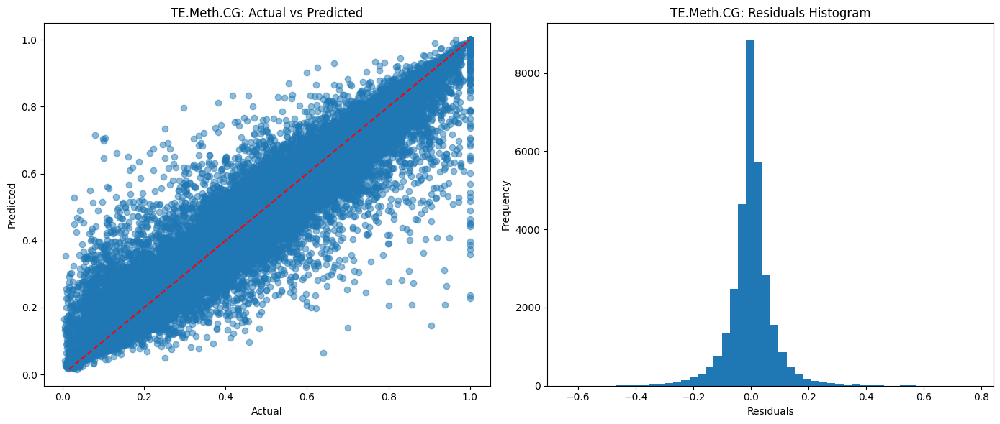


Training model for target: TE.Meth.CHG
Training time: 38.86 seconds
Prediction time: 0.18 seconds
MAE: 0.0429, MSE: 0.0043, RMSE: 0.0654, R2: 0.9228


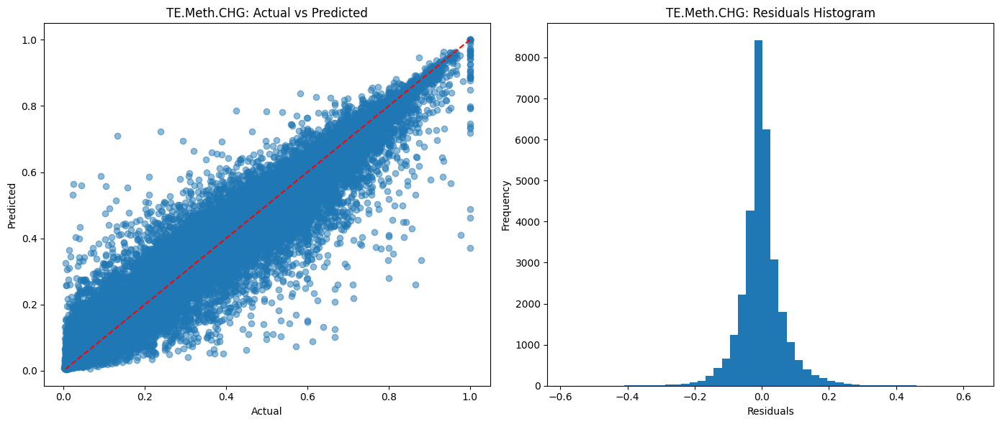


Training model for target: TE.Meth.CHH
Training time: 38.44 seconds
Prediction time: 0.22 seconds
MAE: 0.0257, MSE: 0.0016, RMSE: 0.0402, R2: 0.9494


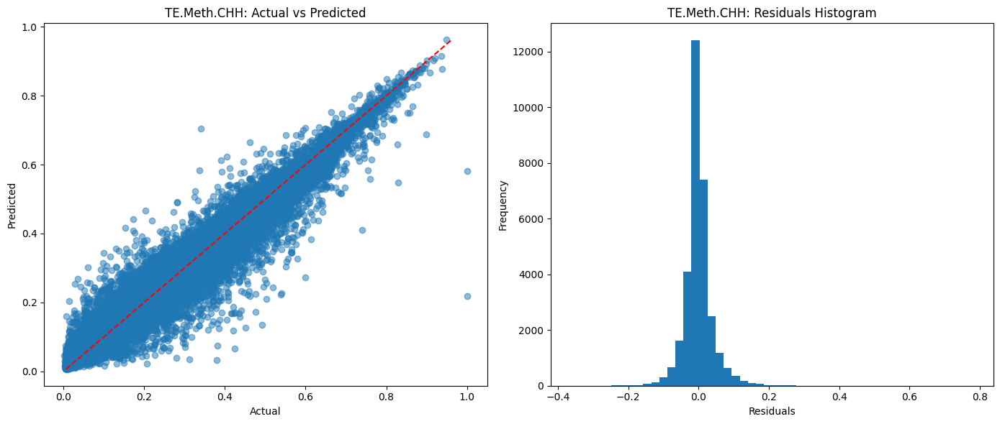


--- Training models for 0-100 window ---

Training model for target: up.Meth.CG.0_100
Training time: 48.71 seconds
Prediction time: 0.16 seconds
MAE: 0.0827, MSE: 0.0190, RMSE: 0.1380, R2: 0.7791


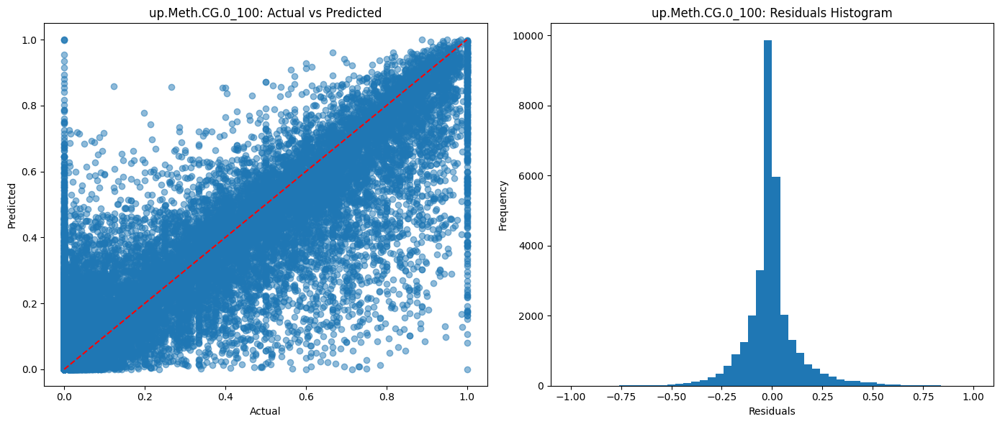


Training model for target: up.Meth.CHG.0_100
Training time: 52.42 seconds
Prediction time: 0.26 seconds
MAE: 0.0607, MSE: 0.0110, RMSE: 0.1049, R2: 0.7604


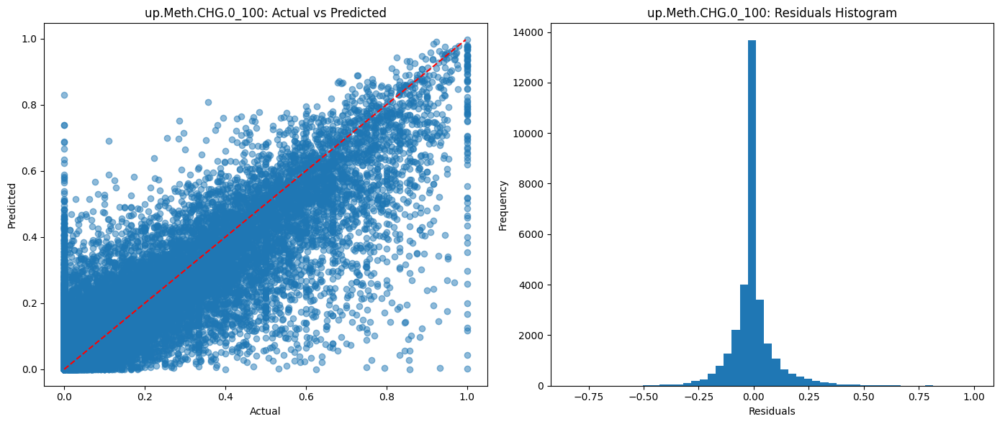


Training model for target: up.Meth.CHH.0_100
Training time: 53.63 seconds
Prediction time: 0.19 seconds
MAE: 0.0368, MSE: 0.0043, RMSE: 0.0659, R2: 0.7914


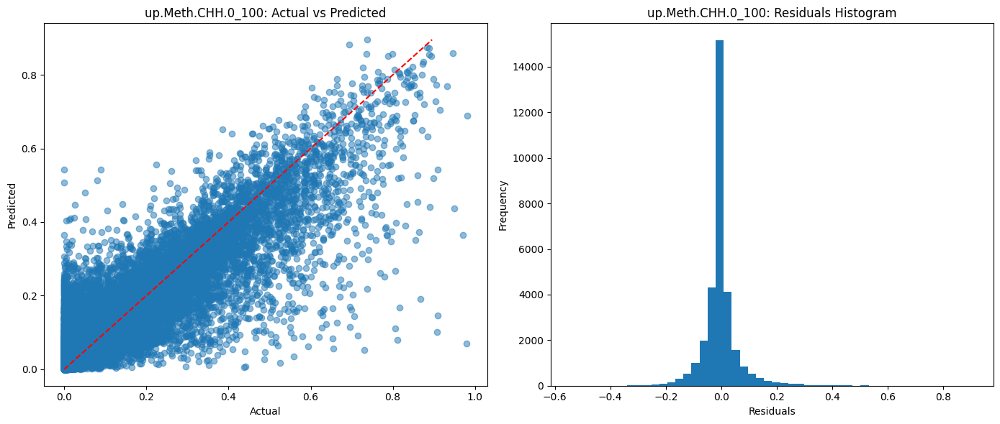


Training model for target: down.Meth.CG.0_100
Training time: 49.44 seconds
Prediction time: 0.17 seconds
MAE: 0.0854, MSE: 0.0197, RMSE: 0.1405, R2: 0.7708


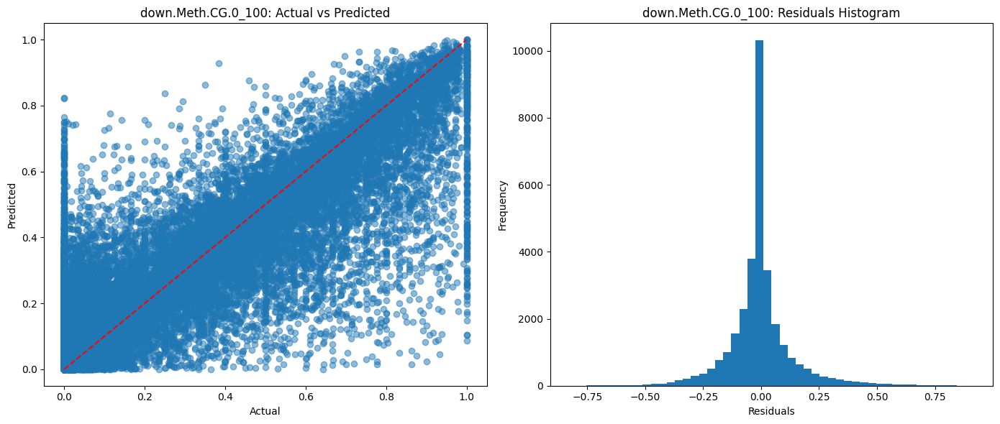


Training model for target: down.Meth.CHG.0_100
Training time: 53.94 seconds
Prediction time: 0.32 seconds
MAE: 0.0622, MSE: 0.0112, RMSE: 0.1060, R2: 0.7591


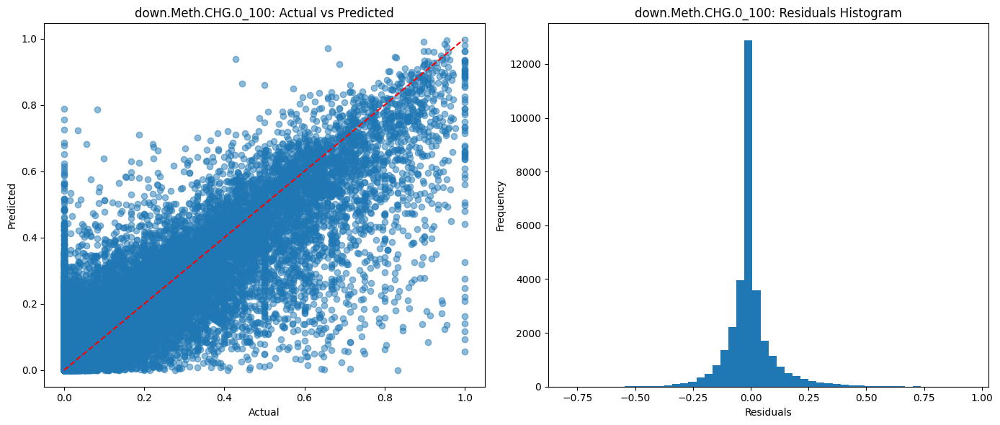


Training model for target: down.Meth.CHH.0_100
Training time: 51.70 seconds
Prediction time: 0.19 seconds
MAE: 0.0377, MSE: 0.0044, RMSE: 0.0663, R2: 0.7800


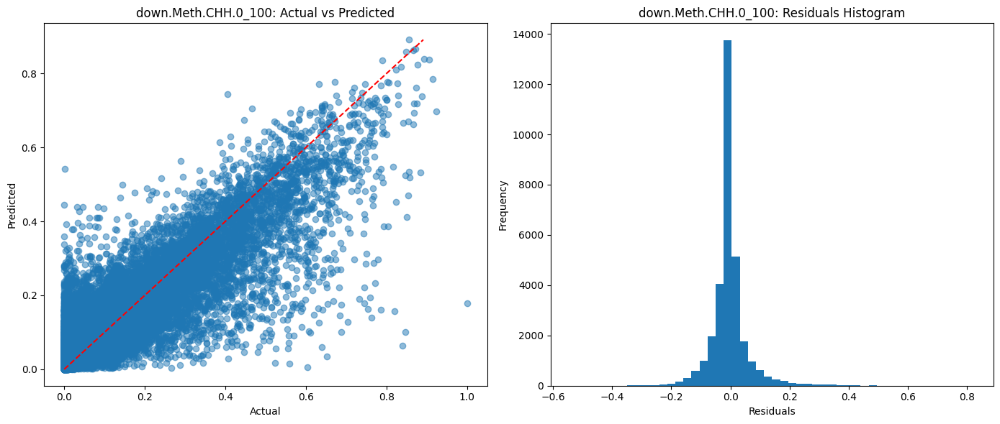


--- Training models for 100-200 window ---

Training model for target: up.Meth.CG.100_200
Training time: 66.89 seconds
Prediction time: 0.33 seconds
MAE: 0.0692, MSE: 0.0164, RMSE: 0.1282, R2: 0.7688


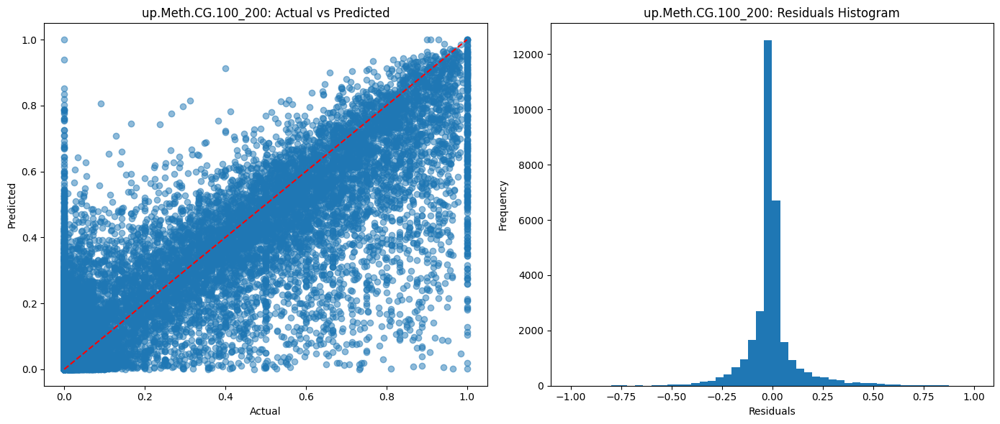


Training model for target: up.Meth.CHG.100_200
Training time: 71.29 seconds
Prediction time: 0.18 seconds
MAE: 0.0490, MSE: 0.0088, RMSE: 0.0937, R2: 0.7404


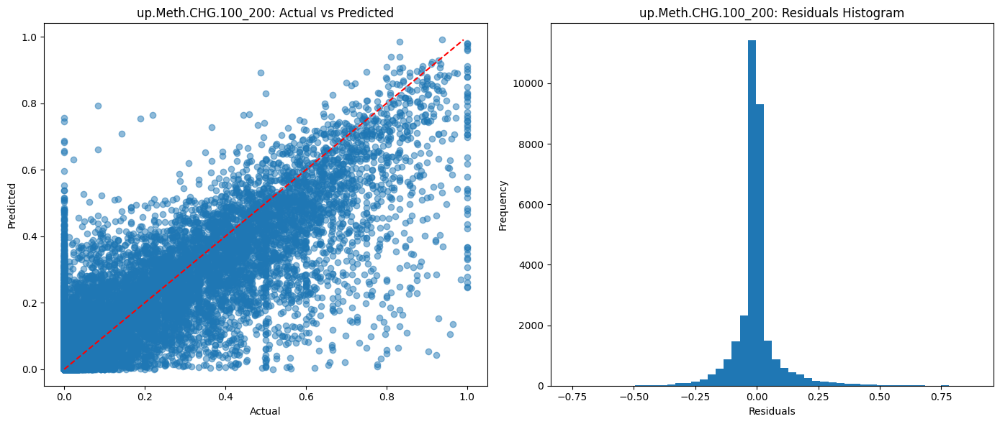


Training model for target: up.Meth.CHH.100_200
Training time: 69.91 seconds
Prediction time: 0.33 seconds
MAE: 0.0283, MSE: 0.0032, RMSE: 0.0566, R2: 0.7908


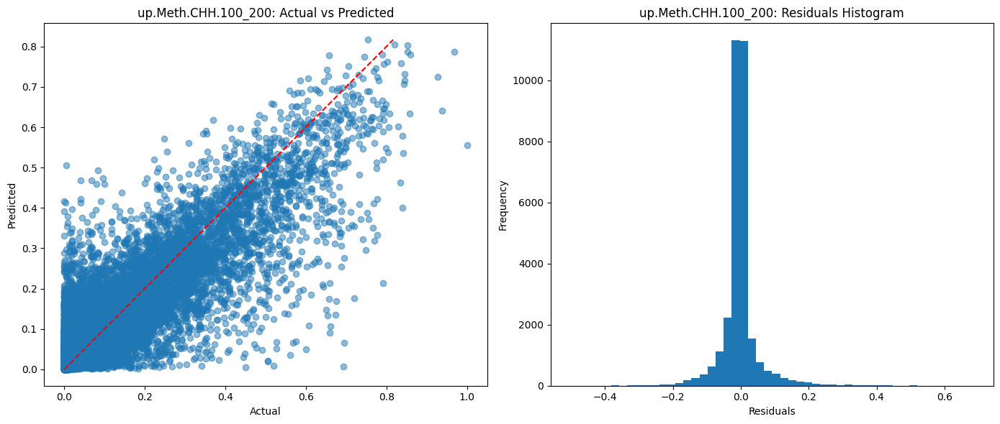


Training model for target: down.Meth.CG.100_200
Training time: 67.19 seconds
Prediction time: 0.19 seconds
MAE: 0.0722, MSE: 0.0172, RMSE: 0.1310, R2: 0.7664


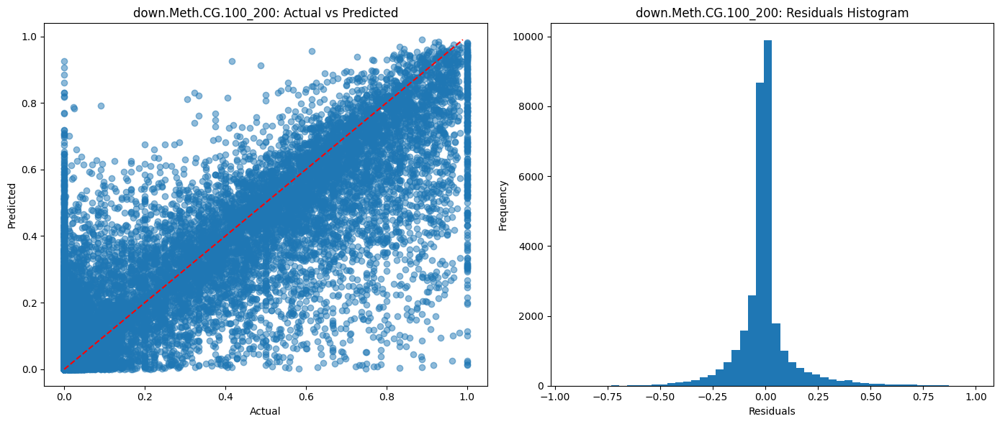


Training model for target: down.Meth.CHG.100_200
Training time: 67.01 seconds
Prediction time: 0.17 seconds
MAE: 0.0516, MSE: 0.0096, RMSE: 0.0980, R2: 0.7479


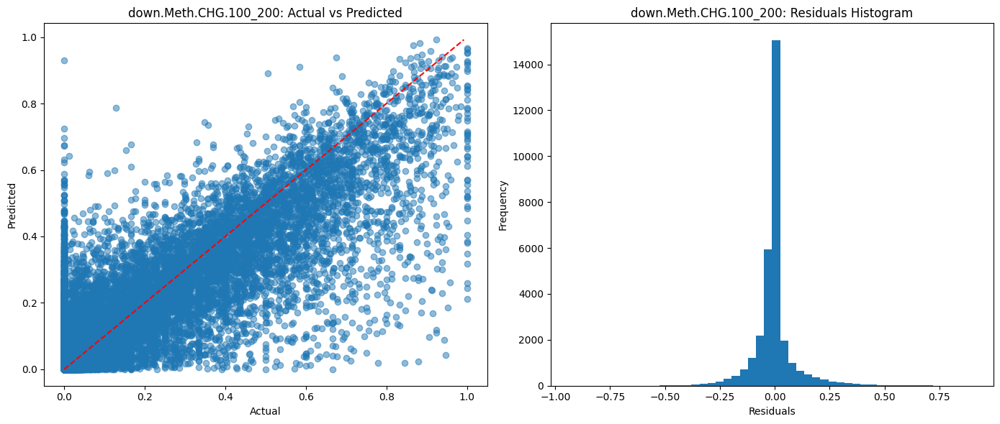


Training model for target: down.Meth.CHH.100_200
Training time: 71.62 seconds
Prediction time: 0.24 seconds
MAE: 0.0293, MSE: 0.0034, RMSE: 0.0584, R2: 0.7892


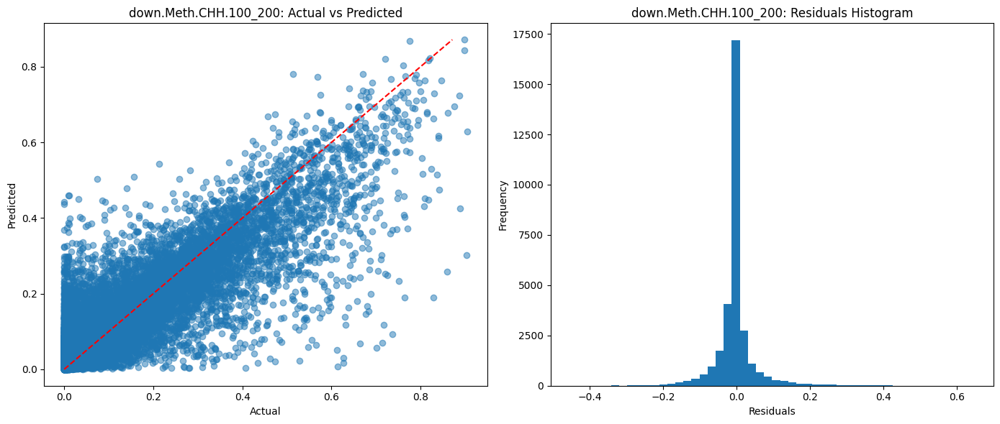


--- Training models for 200-300 window ---

Training model for target: up.Meth.CG.200_300
Training time: 91.66 seconds
Prediction time: 0.19 seconds
MAE: 0.0560, MSE: 0.0124, RMSE: 0.1114, R2: 0.8013


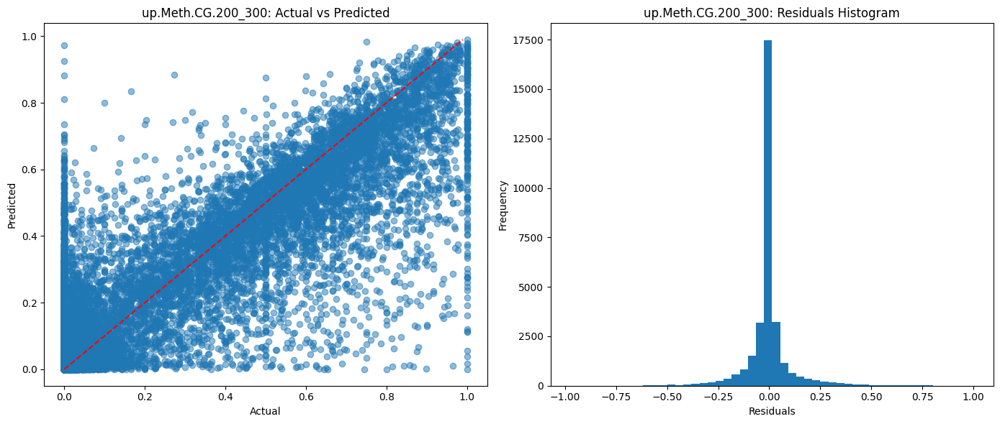


Training model for target: up.Meth.CHG.200_300
Training time: 88.89 seconds
Prediction time: 0.17 seconds
MAE: 0.0400, MSE: 0.0068, RMSE: 0.0823, R2: 0.7763


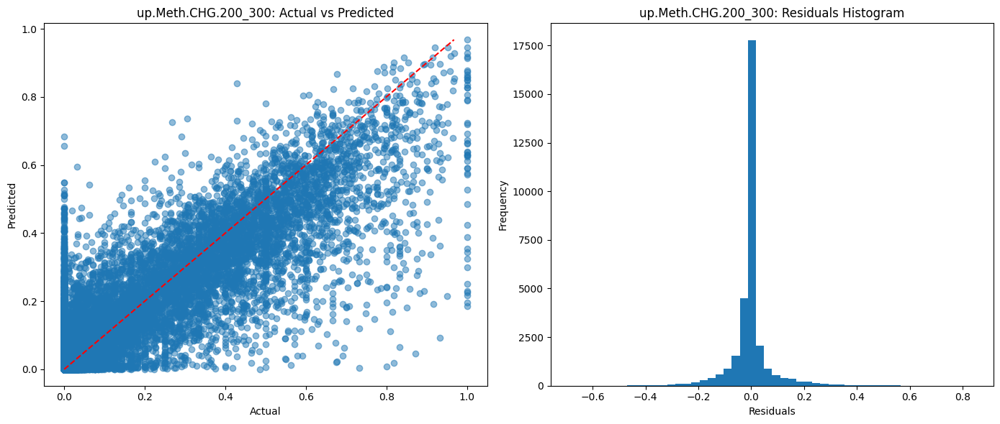


Training model for target: up.Meth.CHH.200_300
Training time: 86.52 seconds
Prediction time: 0.36 seconds
MAE: 0.0218, MSE: 0.0021, RMSE: 0.0461, R2: 0.8281


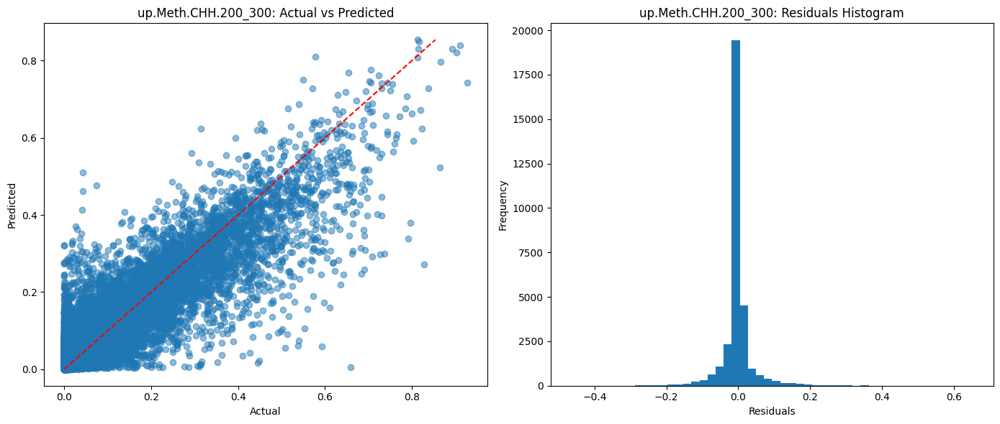


Training model for target: down.Meth.CG.200_300
Training time: 87.94 seconds
Prediction time: 0.17 seconds
MAE: 0.0573, MSE: 0.0124, RMSE: 0.1115, R2: 0.8152


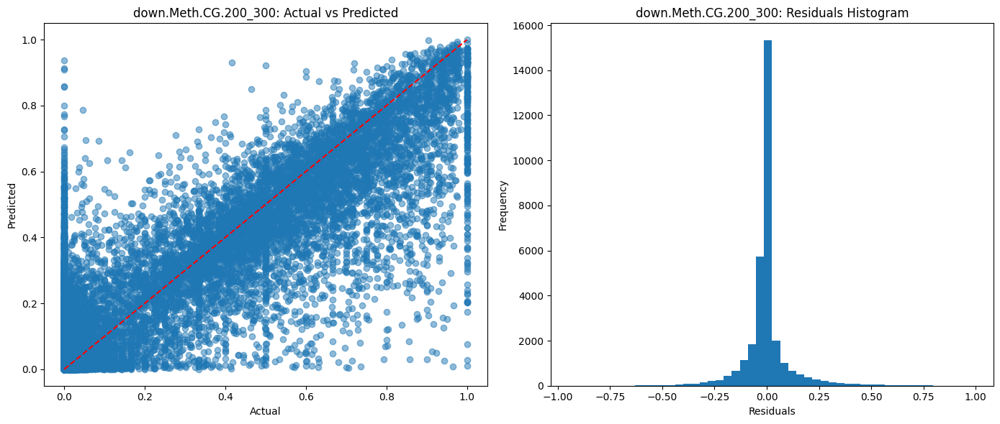


Training model for target: down.Meth.CHG.200_300
Training time: 87.99 seconds
Prediction time: 0.16 seconds
MAE: 0.0427, MSE: 0.0076, RMSE: 0.0874, R2: 0.7722


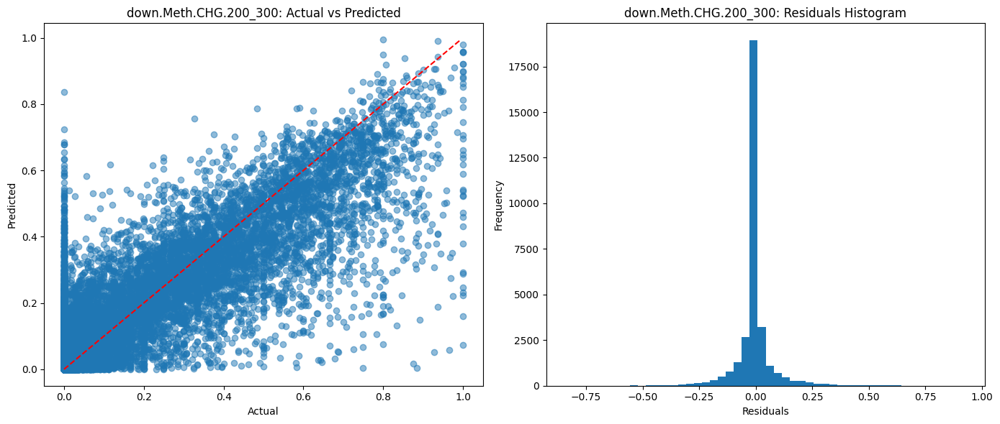


Training model for target: down.Meth.CHH.200_300
Training time: 87.90 seconds
Prediction time: 0.20 seconds
MAE: 0.0226, MSE: 0.0023, RMSE: 0.0483, R2: 0.8222


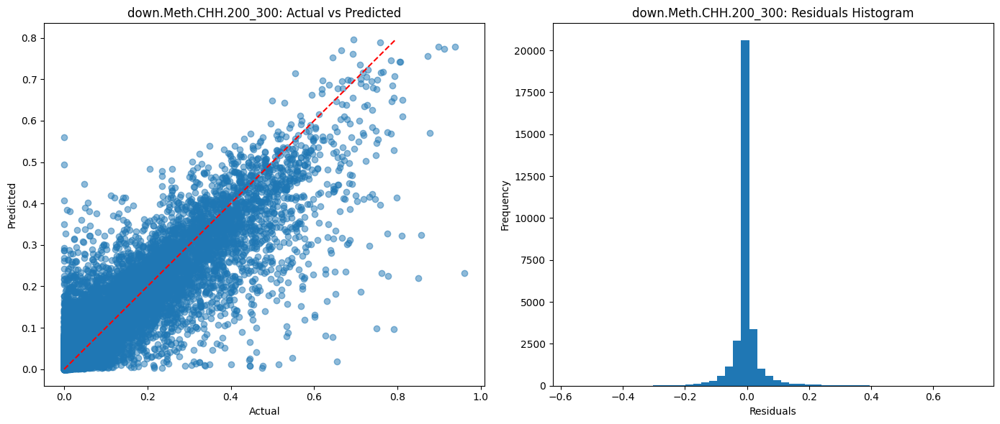


=== Summary of all models ===
                            MAE       MSE      RMSE        R2
TE.Meth.CG             0.050246  0.006128  0.078282  0.899616
TE.Meth.CHG            0.042930  0.004283  0.065443  0.922765
TE.Meth.CHH            0.025661  0.001616  0.040196  0.949418
up.Meth.CG.0_100       0.082667  0.019032  0.137955  0.779069
up.Meth.CHG.0_100      0.060709  0.011010  0.104931  0.760441
up.Meth.CHH.0_100      0.036826  0.004338  0.065865  0.791407
down.Meth.CG.0_100     0.085429  0.019749  0.140532  0.770769
down.Meth.CHG.0_100    0.062231  0.011228  0.105963  0.759075
down.Meth.CHH.0_100    0.037682  0.004394  0.066284  0.779968
up.Meth.CG.100_200     0.069202  0.016424  0.128155  0.768750
up.Meth.CHG.100_200    0.048969  0.008781  0.093704  0.740425
up.Meth.CHH.100_200    0.028266  0.003198  0.056553  0.790809
down.Meth.CG.100_200   0.072246  0.017166  0.131018  0.766445
down.Meth.CHG.100_200  0.051643  0.009602  0.097992  0.747879
down.Meth.CHH.100_200  0.029326  0.0034

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import seaborn as sns

# Defining target variable
target_methylation_columns_TE = ['TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH']

target_methylation_columns_0_100 = [
    'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
    'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100'
]

target_methylation_columns_100_200 = [
    'up.Meth.CG.100_200', 'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200',
    'down.Meth.CG.100_200', 'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200'
]

target_methylation_columns_200_300 = [
    'up.Meth.CG.200_300', 'up.Meth.CHG.200_300', 'up.Meth.CHH.200_300',
    'down.Meth.CG.200_300', 'down.Meth.CHG.200_300', 'down.Meth.CHH.200_300'
]

# Defining features for the TE, and the three windows. Took the Meth.inside features for the TE group.
features_per_window = {
    'TE': [
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate', 'average.CG ', 'average.CHG', 'average.CHH','up.Gene1.strand', 'down.Gene1.strand'
    ],
    '0-100': [
        # includes TE methylation as predictors + local features
        'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate', 'average.CG ', 'average.CHG', 'average.CHH','up.Gene1.strand', 'down.Gene1.strand'
    ],
    '100-200': [
        # builds on 0-100 window + adds 0-100 methylation context
        'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
        'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate', 'average.CG ', 'average.CHG', 'average.CHH','up.Gene1.strand', 'down.Gene1.strand'
    ],
    '200-300': [
      # builds on 100-200 window + adds 100-200 methylation context
        'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
        'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100',
        'up.Meth.CG.100_200', 'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200',
        'down.Meth.CG.100_200', 'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate', 'average.CG ', 'average.CHG', 'average.CHH','up.Gene1.strand', 'down.Gene1.strand'
    ]
}

# Targets for each window
windows_and_targets = [
    ('TE', target_methylation_columns_TE),
    ('0-100', target_methylation_columns_0_100),
    ('100-200', target_methylation_columns_100_200),
    ('200-300', target_methylation_columns_200_300)
]

# Defining the dictionnaries
models = {}
evaluation_results = {}
data_test_dict = {}
target_test_dict = {}
categorical_cols_dict = {}
numeric_cols_dict = {}


# Training loop: for each genomic window and target methylation feature
for window_name, target_cols in windows_and_targets:
    print(f"\n--- Training models for {window_name} window ---")

    # Features selection
    X_window = df_cleaned_new[features_per_window[window_name]]
    y_window = df_cleaned_new[target_cols]

    numeric_cols = X_window.select_dtypes(include=np.number).columns.tolist()
    categorical_cols = X_window.select_dtypes(exclude=np.number).columns.tolist()

    categorical_cols_dict[window_name] = categorical_cols
    numeric_cols_dict[window_name] = numeric_cols

    # Preprocessing Pipeline (numerical feature = standardizing / categorical features = encoding)
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_cols),
            ('num', StandardScaler(), numeric_cols)
        ],
        remainder='passthrough'
    )

    # Train/ Test split (80/20)
    data_train, data_test, target_train, target_test = train_test_split(
        X_window, y_window, test_size=0.2, random_state=42
    )

    data_test_dict[window_name] = data_test
    target_test_dict[window_name] = target_test

    # Full pipeline: preprocessing + Random Forest regressor
    for target_col in target_cols:
        print(f"\nTraining model for target: {target_col}")

        model = Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', RandomForestRegressor(n_estimators=10, random_state=42, n_jobs=-1))
        ])

        # Training
        start_time = time.time()
        model.fit(data_train, target_train[target_col])
        print(f"Training time: {time.time() - start_time:.2f} seconds")

        # Prediction
        start_time = time.time()
        predictions = model.predict(data_test)
        print(f"Prediction time: {time.time() - start_time:.2f} seconds")

        # Evaluation metrics
        mae = mean_absolute_error(target_test[target_col], predictions)
        mse = mean_squared_error(target_test[target_col], predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(target_test[target_col], predictions)

        evaluation_results[target_col] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'R2': r2}
        models[target_col] = model

        print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R2: {r2:.4f}")

        # Visualization: predictions vs actuals + residuals distribution
        fig, ax = plt.subplots(1, 2, figsize=(14, 6))
        ax[0].scatter(target_test[target_col], predictions, alpha=0.5)
        ax[0].plot([predictions.min(), predictions.max()], [predictions.min(), predictions.max()], 'r--')
        ax[0].set_xlabel("Actual")
        ax[0].set_ylabel("Predicted")
        ax[0].set_title(f"{target_col}: Actual vs Predicted")

        residuals = target_test[target_col] - predictions
        ax[1].hist(residuals, bins=50)
        ax[1].set_xlabel("Residuals")
        ax[1].set_ylabel("Frequency")
        ax[1].set_title(f"{target_col}: Residuals Histogram")

        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(evaluation_results).T
print("\n=== Summary of all models ===")
print(results_df)

# Metrics results Visualization

### Histogramms

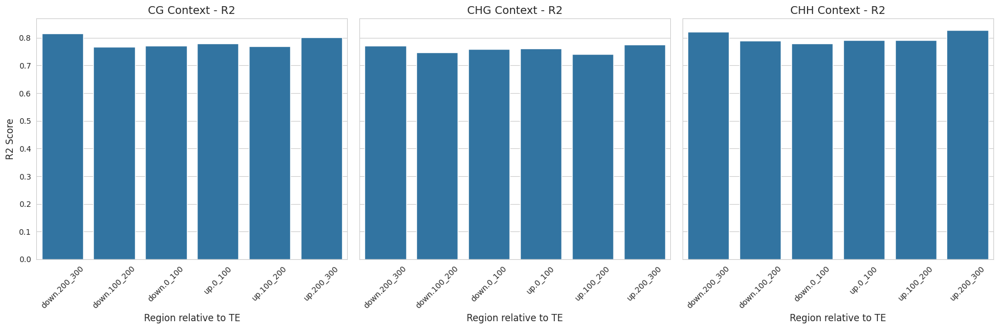

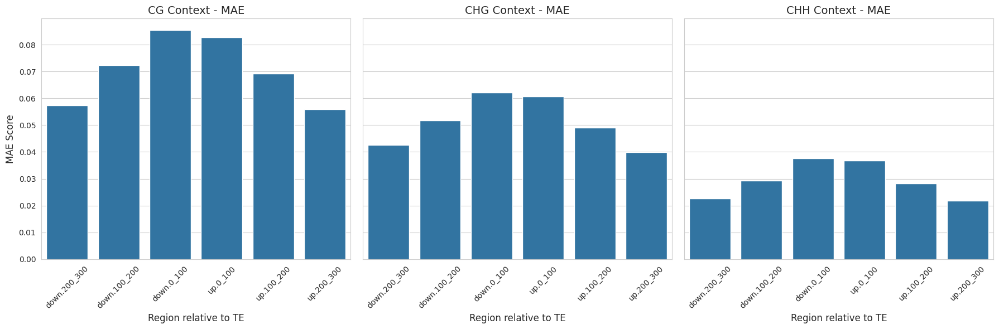

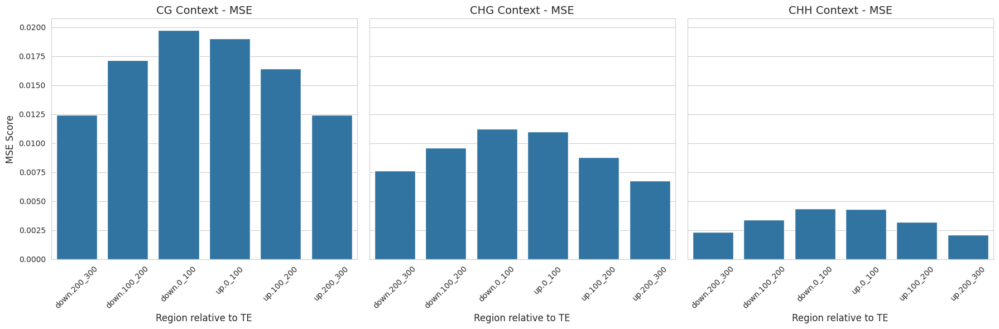

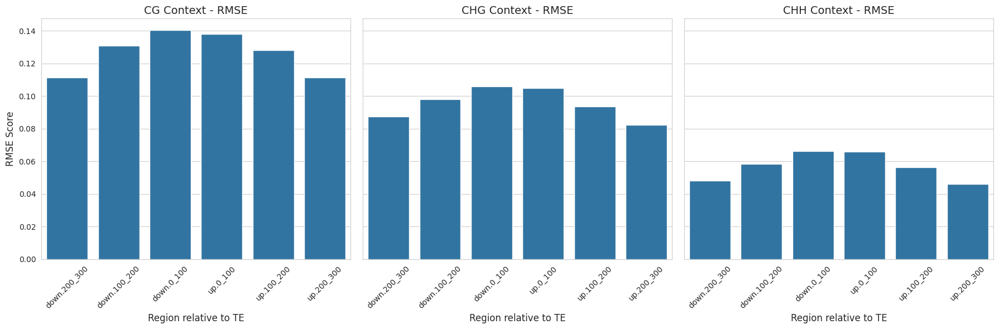

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

eval_df = pd.DataFrame(evaluation_results).T.reset_index()
eval_df.rename(columns={'index': 'Target'}, inplace=True)

eval_df['Context'] = eval_df['Target'].str.extract(r'\.(CG|CHG|CHH)\.')
eval_df['Window'] = eval_df['Target'].str.extract(r'(\d+_\d+)')
eval_df['Direction'] = eval_df['Target'].str.extract(r'^(up|down)')
eval_df['Region'] = eval_df['Direction'] + '.' + eval_df['Window']

custom_region_order = [
    'down.200_300', 'down.100_200', 'down.0_100',
    'up.0_100', 'up.100_200', 'up.200_300'
]

eval_df['Region'] = pd.Categorical(eval_df['Region'], categories=custom_region_order, ordered=True)

eval_df_filtered = eval_df.dropna(subset=['Window', 'Direction']).copy()

sns.set_style("whitegrid")
metrics_to_plot = ['R2', 'MAE', 'MSE', 'RMSE']

for metric in metrics_to_plot:
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    for ax, context in zip(axes, ['CG', 'CHG', 'CHH']):
        subset = eval_df_filtered[eval_df_filtered['Context'] == context]
        sns.barplot(
            x='Region',
            y=metric,
            data=subset,
            ax=ax,
            color=sns.color_palette("tab10")[0]
        )
        ax.set_title(f'{context} Context - {metric}', fontsize=14)
        ax.set_xlabel('Region relative to TE', fontsize=12)
        ax.set_ylabel(f'{metric} Score', fontsize=12 if context == 'CG' else 0)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

### Performance Metrics Heatmap (up and down results)

/tmp/ipython-input-3382324214.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = subset.groupby(['Window', 'Direction'])[metrics_to_plot].mean().unstack()


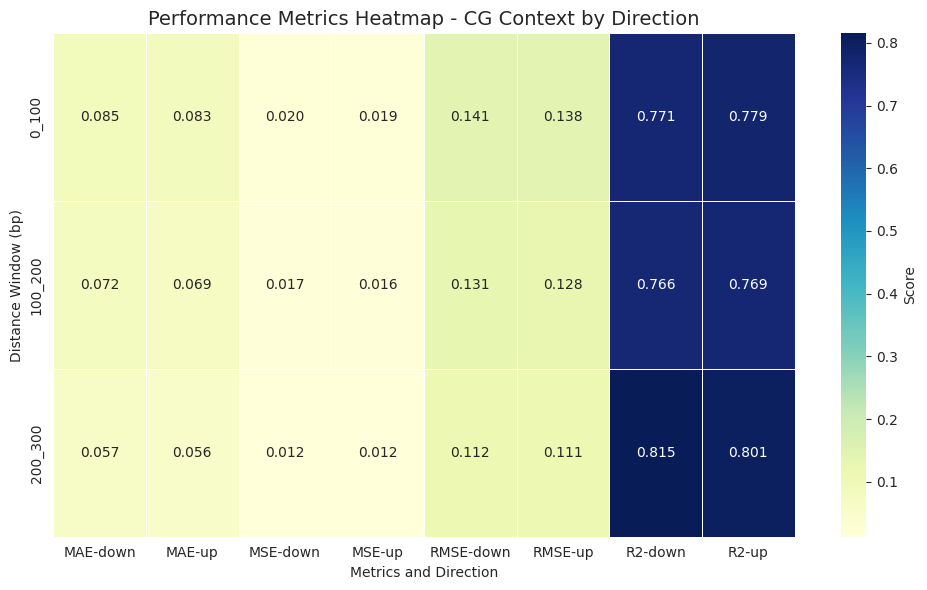

/tmp/ipython-input-3382324214.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = subset.groupby(['Window', 'Direction'])[metrics_to_plot].mean().unstack()


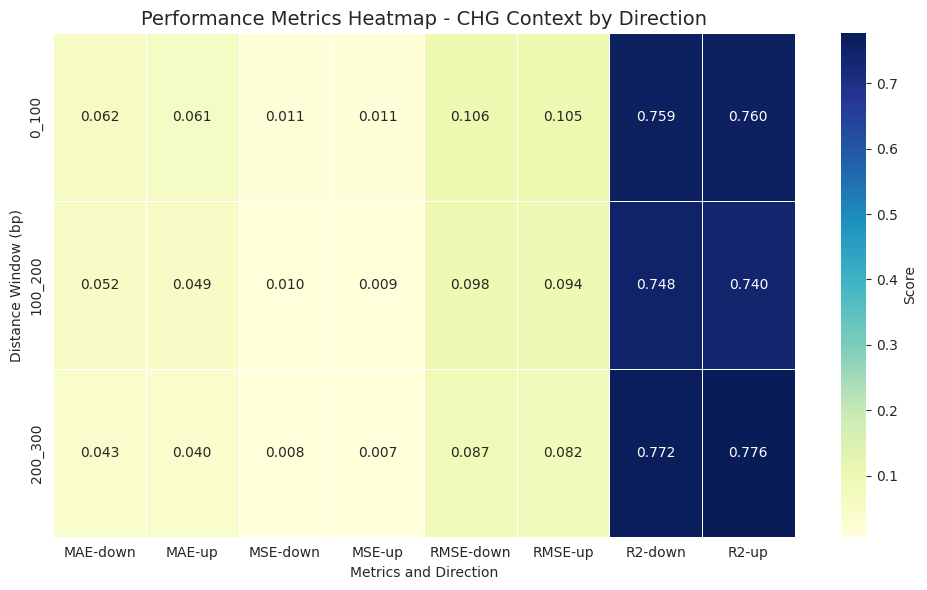

/tmp/ipython-input-3382324214.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = subset.groupby(['Window', 'Direction'])[metrics_to_plot].mean().unstack()


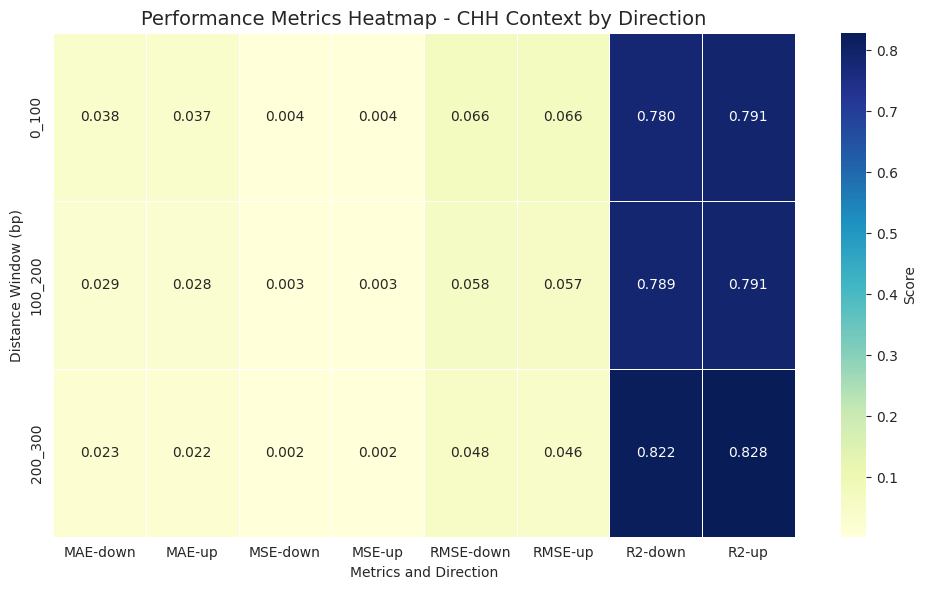

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

eval_df = pd.DataFrame(evaluation_results).T.reset_index()
eval_df.rename(columns={'index': 'Target'}, inplace=True)
eval_df['Context'] = eval_df['Target'].str.extract(r'\.(CG|CHG|CHH)\.')
eval_df['Window'] = eval_df['Target'].str.extract(r'(\d+_\d+)')
eval_df['Direction'] = eval_df['Target'].str.extract(r'^(up|down)')

window_order = ['0_100', '100_200', '200_300']
eval_df['Window'] = pd.Categorical(eval_df['Window'], categories=window_order, ordered=True)


sns.set_style("whitegrid")
metrics_to_plot = ['MAE', 'MSE', 'RMSE', 'R2']

for context in ['CG', 'CHG', 'CHH']:
    subset = eval_df[eval_df['Context'] == context]

    heatmap_data = subset.groupby(['Window', 'Direction'])[metrics_to_plot].mean().unstack()

    plt.figure(figsize=(10, 6))
    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".3f",
        cmap="YlGnBu",
        cbar_kws={'label': 'Score'},
        linewidths=0.5
    )
    plt.title(f'Performance Metrics Heatmap - {context} Context by Direction', fontsize=14)
    plt.ylabel('Distance Window (bp)')
    plt.xlabel('Metrics and Direction')
    plt.tight_layout()
    plt.show()

### Performance Metrics Heatmap (mean of up and down )

/tmp/ipython-input-2721412926.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = subset.groupby('Window')[metrics_to_plot].mean()


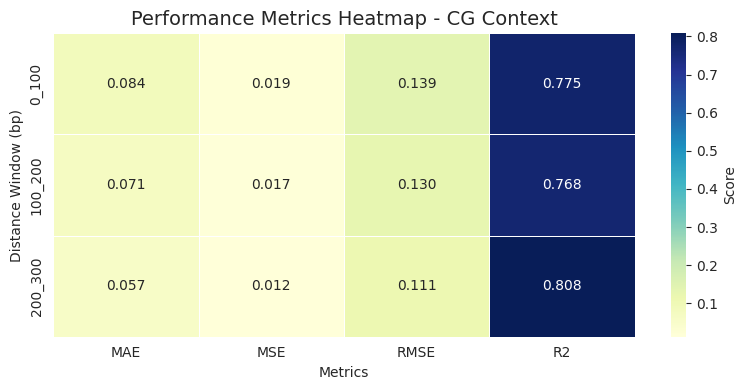

/tmp/ipython-input-2721412926.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = subset.groupby('Window')[metrics_to_plot].mean()


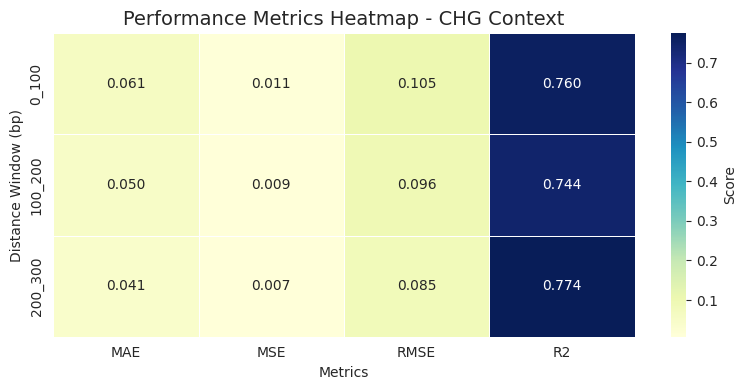

/tmp/ipython-input-2721412926.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = subset.groupby('Window')[metrics_to_plot].mean()


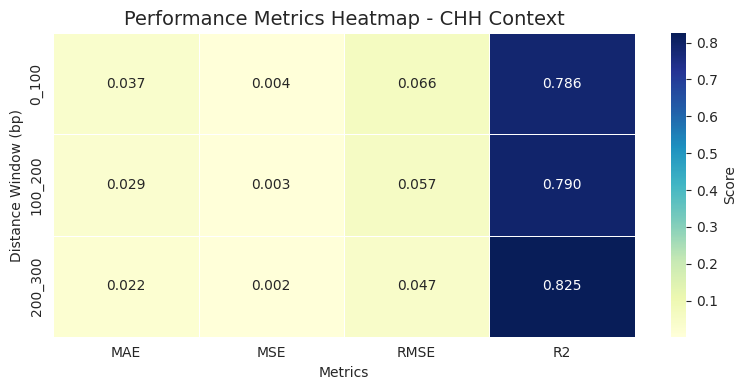

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

eval_df = pd.DataFrame(evaluation_results).T.reset_index()
eval_df.rename(columns={'index': 'Target'}, inplace=True)

eval_df['Context'] = eval_df['Target'].str.extract(r'\.(CG|CHG|CHH)\.')

eval_df['Window'] = eval_df['Target'].str.extract(r'(\d+_\d+)')

eval_df['Direction'] = eval_df['Target'].str.extract(r'^(up|down)')

window_order = ['0_100', '100_200', '200_300']
eval_df['Window'] = pd.Categorical(eval_df['Window'], categories=window_order, ordered=True)


sns.set_style("whitegrid")
metrics_to_plot = ['MAE', 'MSE', 'RMSE', 'R2']

for context in ['CG', 'CHG', 'CHH']:
    subset = eval_df[eval_df['Context'] == context]

    heatmap_data = subset.groupby('Window')[metrics_to_plot].mean()

    plt.figure(figsize=(8, 4))
    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".3f",
        cmap="YlGnBu",
        cbar_kws={'label': 'Score'},
        linewidths=0.5
    )
    plt.title(f'Performance Metrics Heatmap - {context} Context', fontsize=14)
    plt.ylabel('Distance Window (bp)')
    plt.xlabel('Metrics')
    plt.tight_layout()
    plt.show()


# Methylation spreading prediction

### Prediction

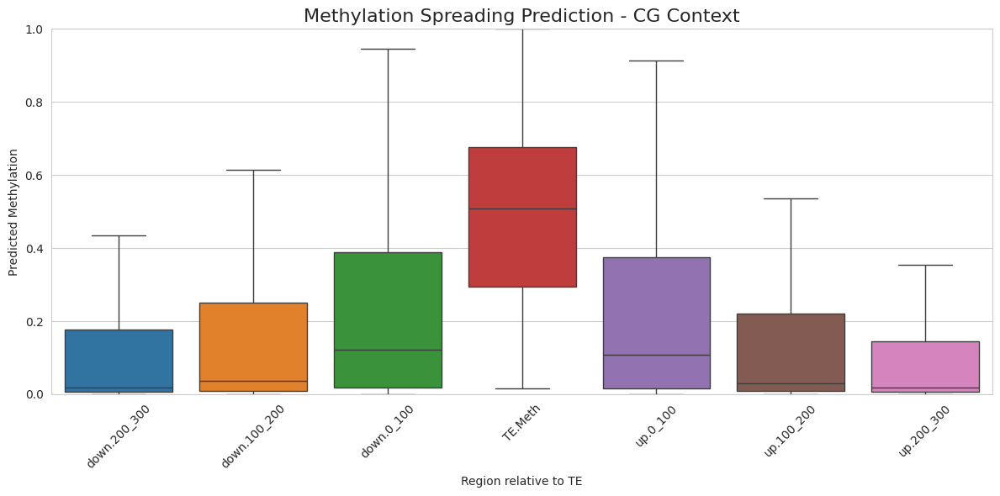

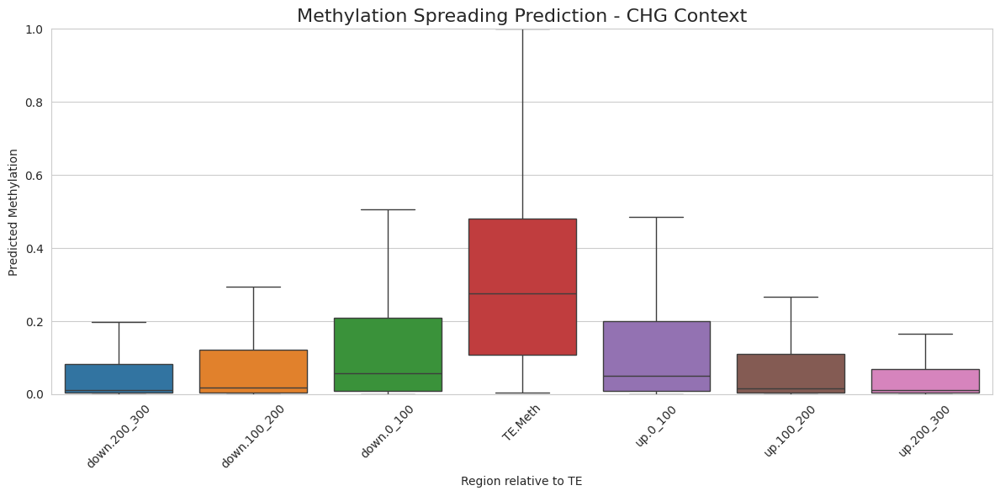

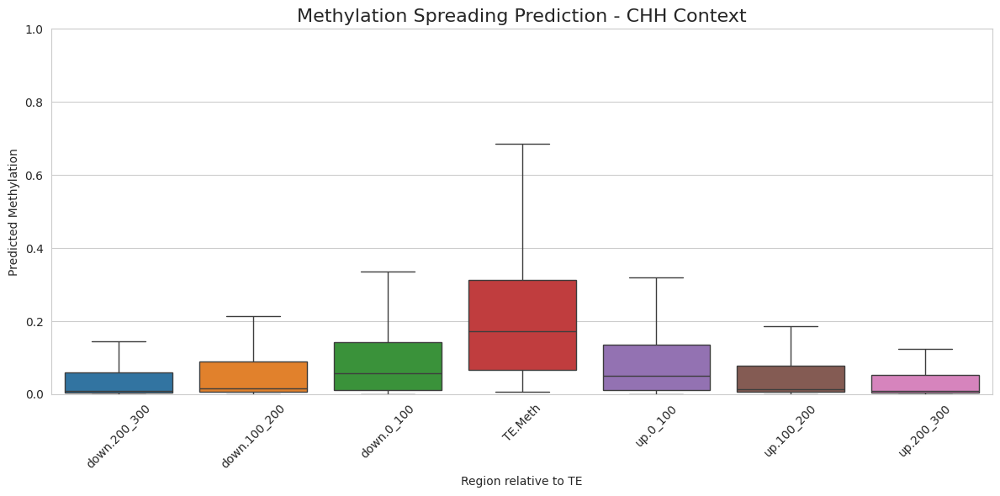

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

contexts = ['CG', 'CHG', 'CHH']
# Defining the order of windows for the spreading plot
spreading_order = [
    'down.Meth.{}' + '.200_300',
    'down.Meth.{}' + '.100_200',
    'down.Meth.{}' + '.0_100',
    'TE.Meth.{}',
    'up.Meth.{}' + '.0_100',
    'up.Meth.{}' + '.100_200',
    'up.Meth.{}' + '.200_300'
]

for context in contexts:
    all_predictions = []
    labels = []

    for pattern in spreading_order:
        target_col = pattern.format(context)
        if target_col in models:
            preds = models[target_col].predict(data_test)
            all_predictions.append(preds)
            labels.append(target_col.replace(f".{context}", "").replace("Meth.", ""))
        else:
            all_predictions.append(np.array([]))
            labels.append(target_col)

    plot_data = pd.DataFrame(all_predictions).T
    plot_data.columns = labels

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=plot_data, showfliers=False)
    plt.title(f'Methylation Spreading Prediction - {context} Context', fontsize=16)
    plt.ylabel('Predicted Methylation')
    plt.xlabel('Region relative to TE')
    plt.xticks(rotation=45)
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()

### Ground Truth

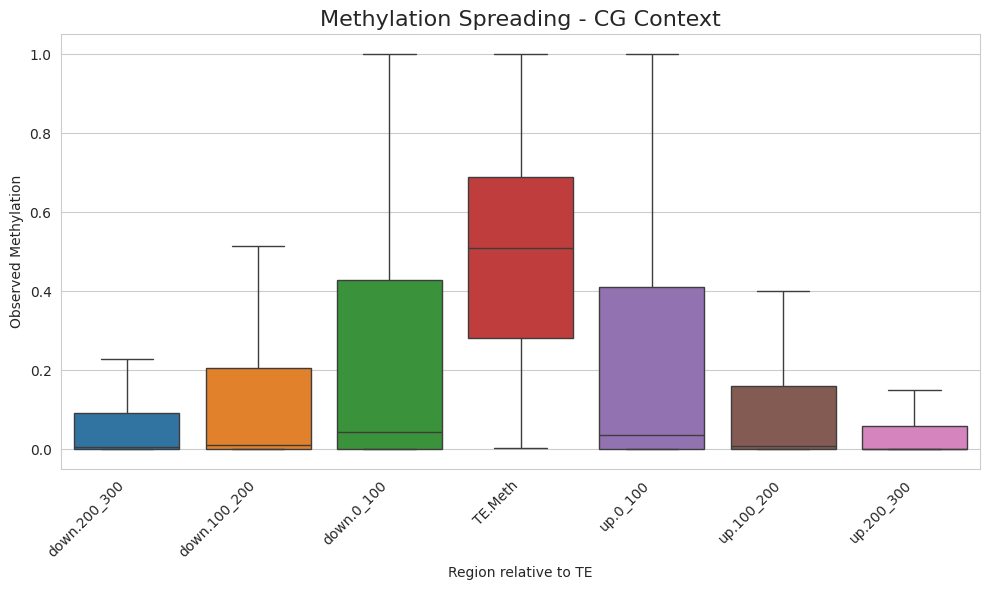

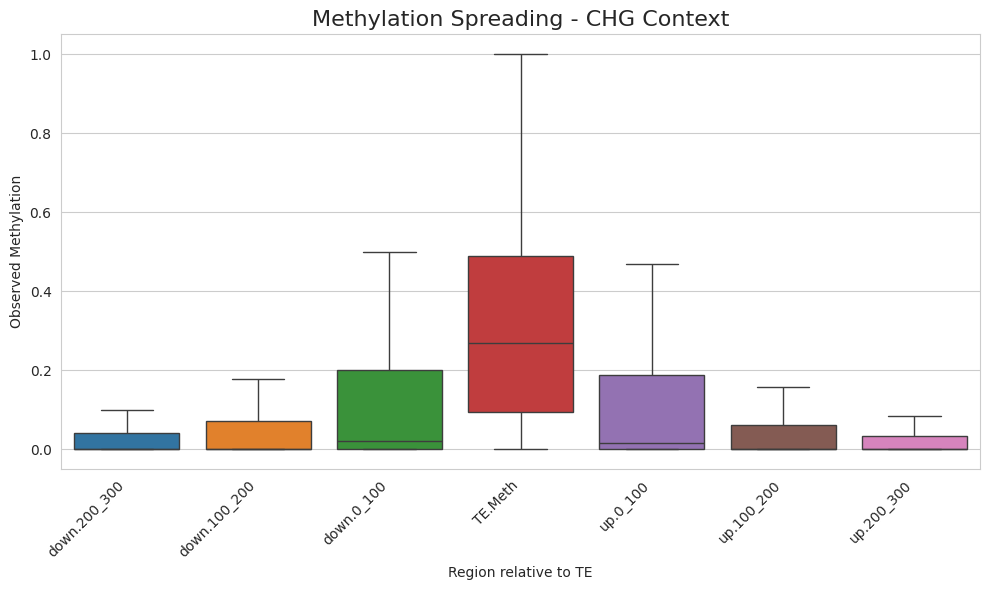

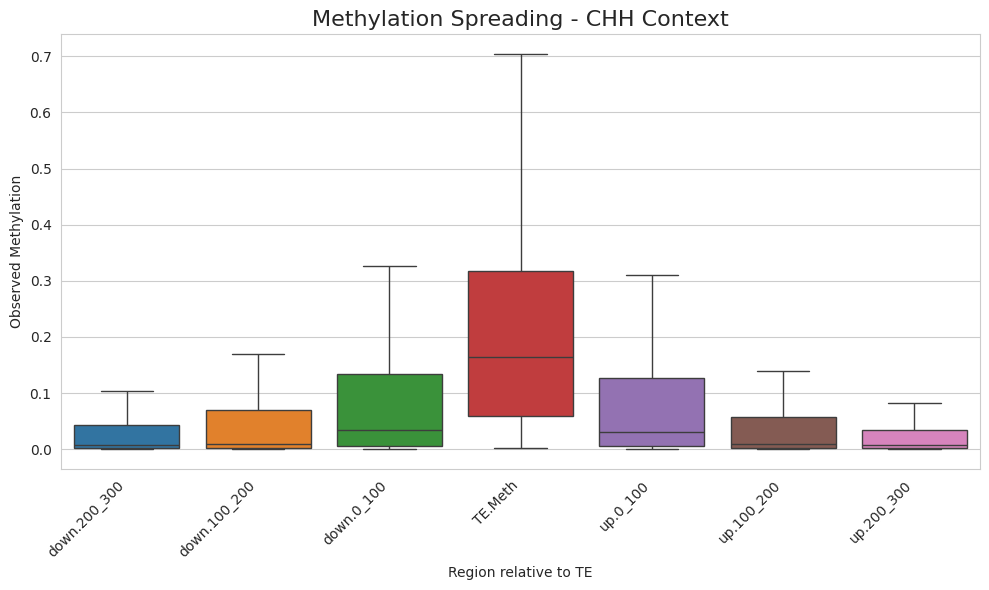

In [39]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

contexts = ['CG', 'CHG', 'CHH']
spreading_order = [
    'down.Meth.{}' + '.200_300',
    'down.Meth.{}' + '.100_200',
    'down.Meth.{}' + '.0_100',
    'TE.Meth.{}',
    'up.Meth.{}' + '.0_100',
    'up.Meth.{}' + '.100_200',
    'up.Meth.{}' + '.200_300'
]

for context in contexts:
    all_values = []
    labels = []

    for pattern in spreading_order:
        target_col = pattern.format(context)
        if target_col in df_cleaned_new.columns:
            values = df_cleaned_new[target_col].values
            all_values.append(values)
            labels.append(target_col.replace(f".{context}", "").replace("Meth.", ""))
        else:
            all_values.append(np.array([]))
            labels.append(target_col)

    plot_data = pd.DataFrame(all_values).T
    plot_data.columns = labels

    plt.figure(figsize=(10, 6))
    sns.boxplot(data=plot_data, showfliers=False)
    plt.title(f'Methylation Spreading - {context} Context', fontsize=16)
    plt.ylabel('Observed Methylation')
    plt.xlabel('Region relative to TE')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


### Both observed and prediction data

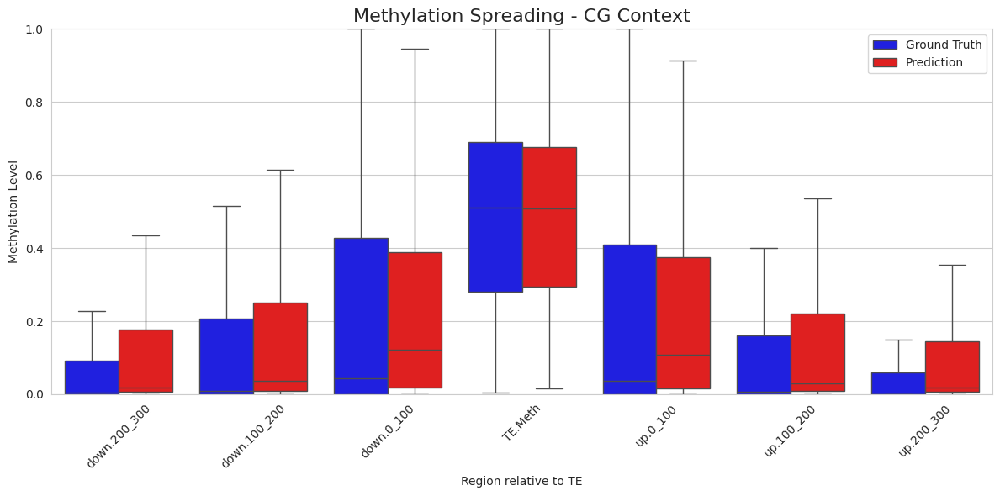

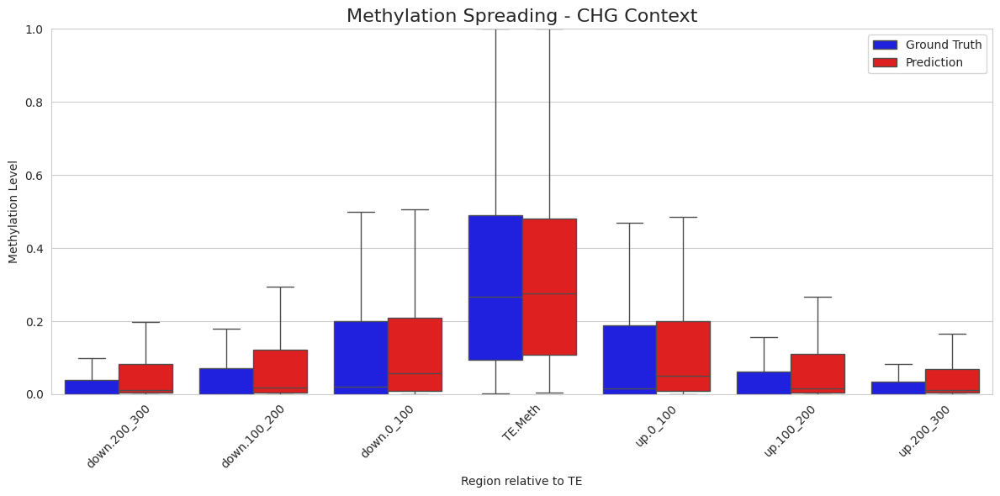

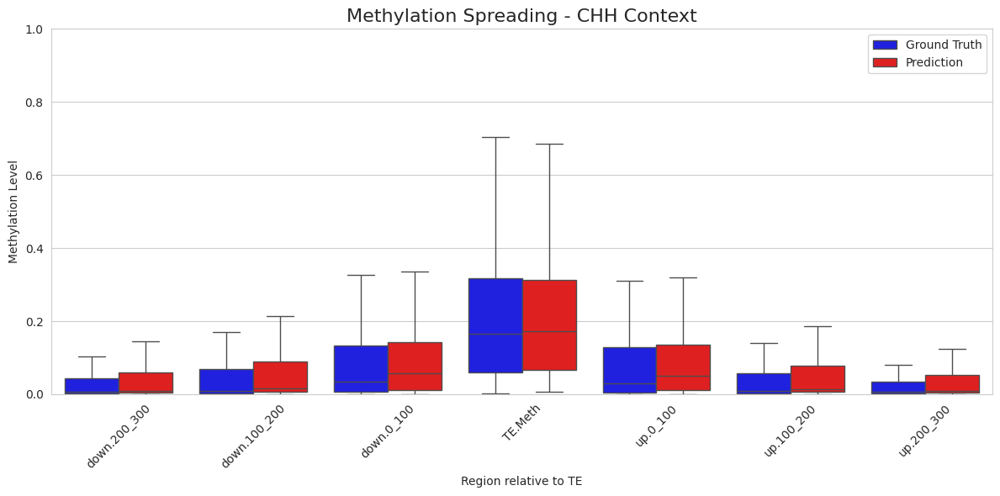

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

contexts = ['CG', 'CHG', 'CHH']
spreading_order = [
    'down.Meth.{}' + '.200_300',
    'down.Meth.{}' + '.100_200',
    'down.Meth.{}' + '.0_100',
    'TE.Meth.{}',
    'up.Meth.{}' + '.0_100',
    'up.Meth.{}' + '.100_200',
    'up.Meth.{}' + '.200_300'
]

for context in contexts:
    gt_values = []
    pred_values = []
    labels = []

    for pattern in spreading_order:
        target_col = pattern.format(context)

        # Ground truth
        if target_col in df_cleaned_new.columns:
            gt = df_cleaned_new[target_col].values
        else:
            gt = np.array([])
        gt_values.append(gt)

        # Predictions
        if target_col in models:
            pred = models[target_col].predict(data_test)
        else:
            pred = np.array([])
        pred_values.append(pred)

        labels.append(target_col.replace(f".{context}", "").replace("Meth.", ""))

    plot_data = pd.DataFrame({
        'Region': np.repeat(labels, [len(g) for g in gt_values]),
        'Methylation': np.concatenate(gt_values),
        'Type': 'Ground Truth'
    })
    pred_data = pd.DataFrame({
        'Region': np.repeat(labels, [len(p) for p in pred_values]),
        'Methylation': np.concatenate(pred_values),
        'Type': 'Prediction'
    })
    combined_data = pd.concat([plot_data, pred_data], ignore_index=True)

    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Region', y='Methylation', hue='Type', data=combined_data,
                palette={'Ground Truth':'blue', 'Prediction':'red'}, showfliers=False)
    plt.title(f'Methylation Spreading - {context} Context', fontsize=16)
    plt.ylabel('Methylation Level')
    plt.xlabel('Region relative to TE')
    plt.xticks(rotation=45)
    plt.ylim(0, 1)
    plt.legend(title='')
    plt.tight_layout()
    plt.show()


# Feature importance analysis

### Feature importance impurity-based method


Feature Importance (Impurity-based) for TE.Meth.CG


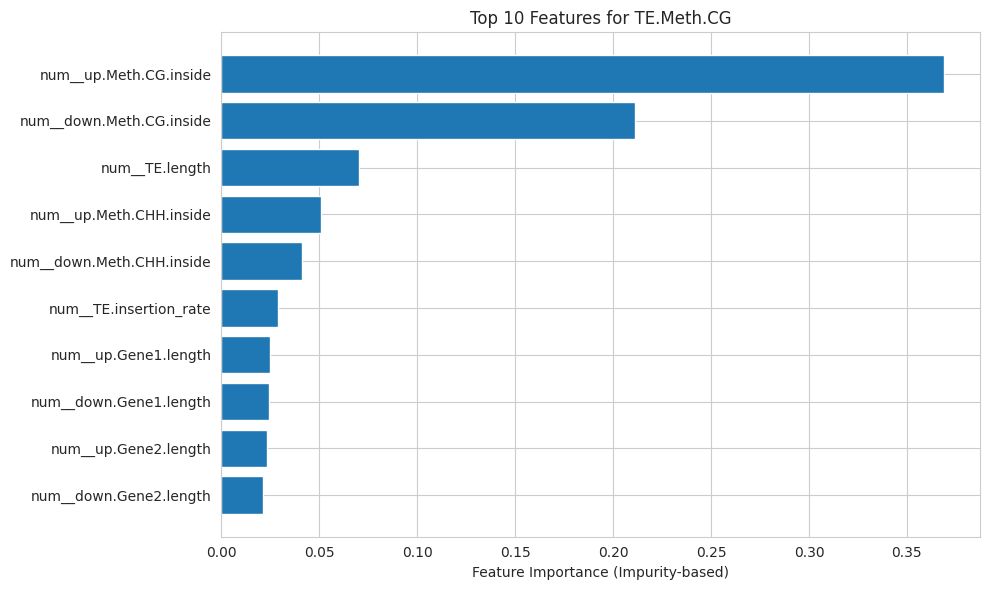


Feature Importance (Impurity-based) for TE.Meth.CHG


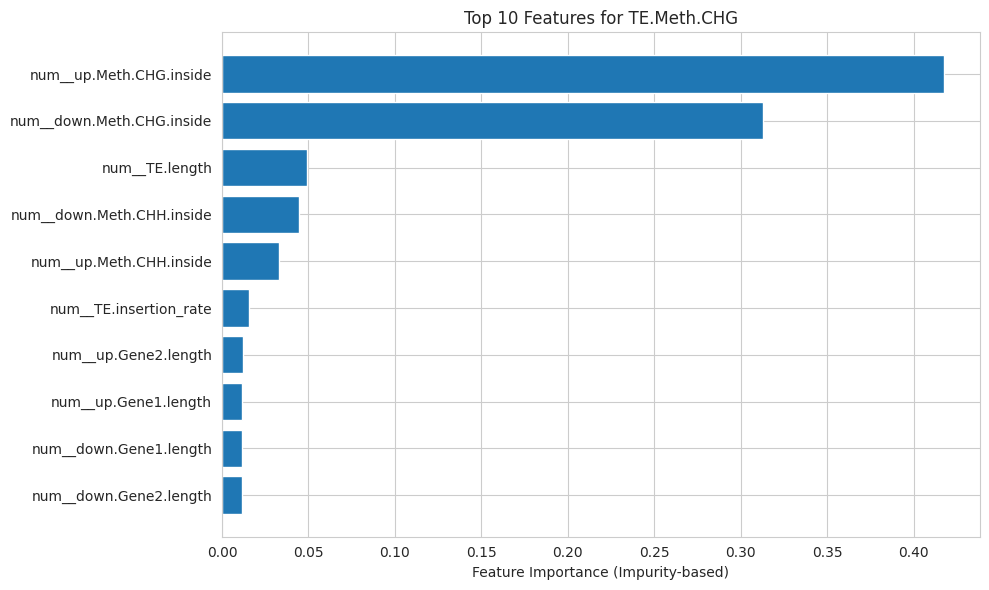


Feature Importance (Impurity-based) for TE.Meth.CHH


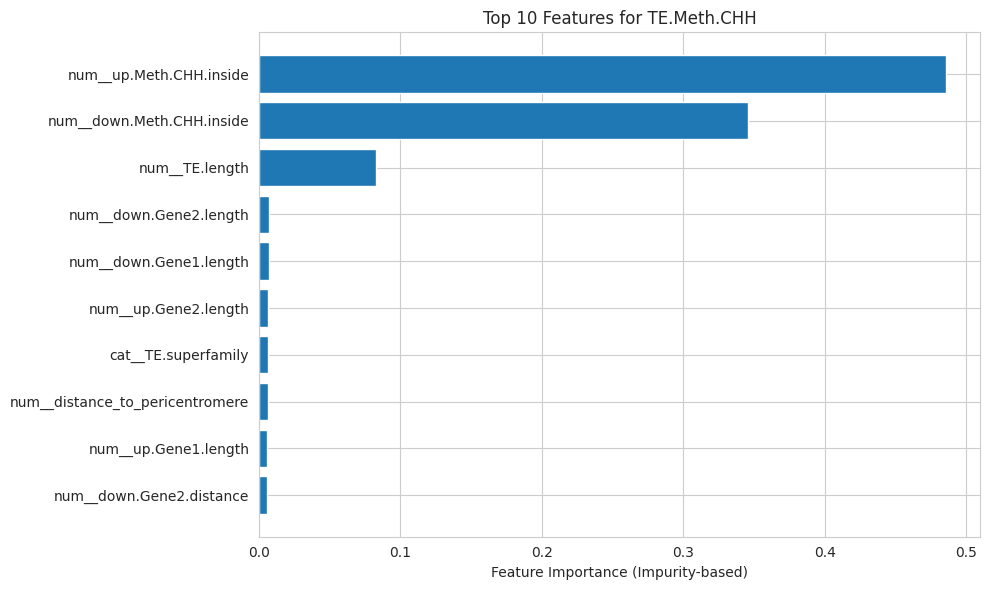


Feature Importance (Impurity-based) for up.Meth.CG.0_100


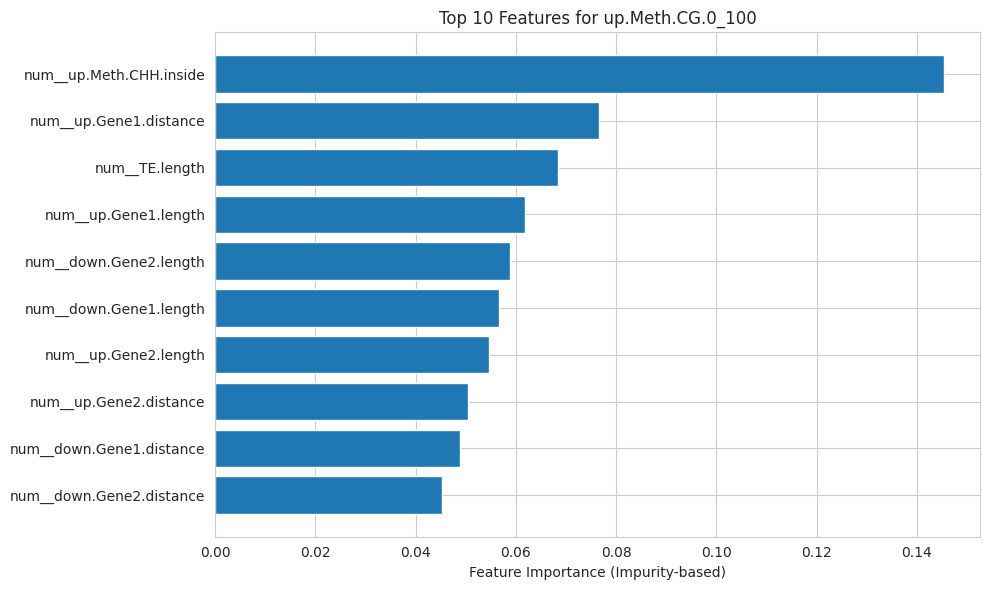


Feature Importance (Impurity-based) for up.Meth.CHG.0_100


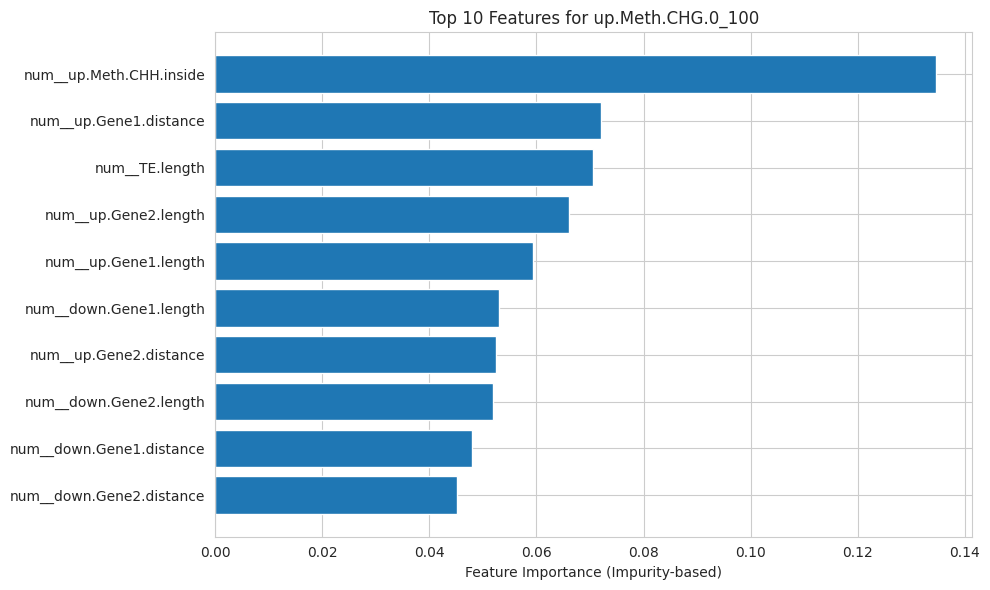


Feature Importance (Impurity-based) for up.Meth.CHH.0_100


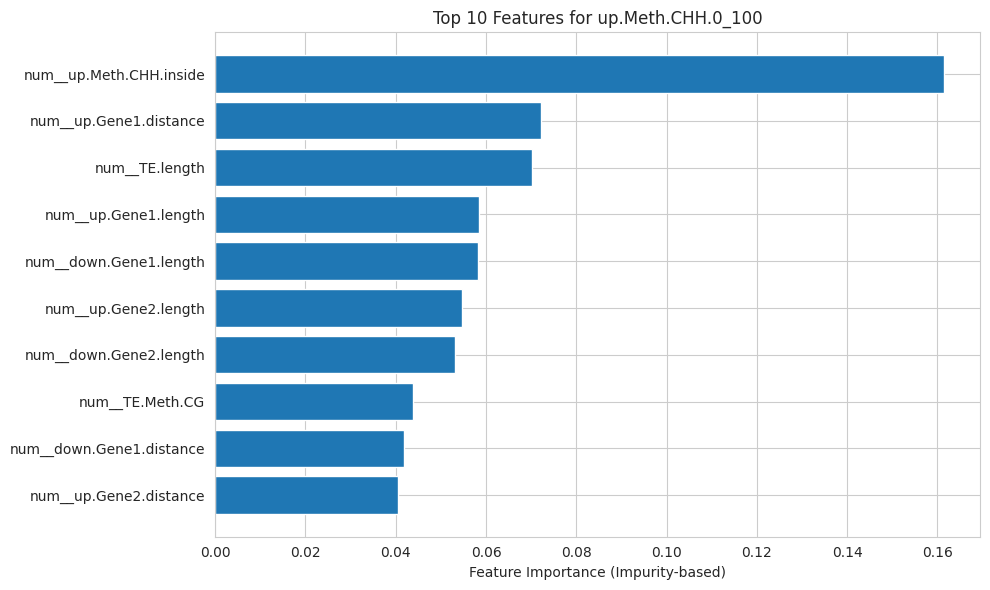


Feature Importance (Impurity-based) for down.Meth.CG.0_100


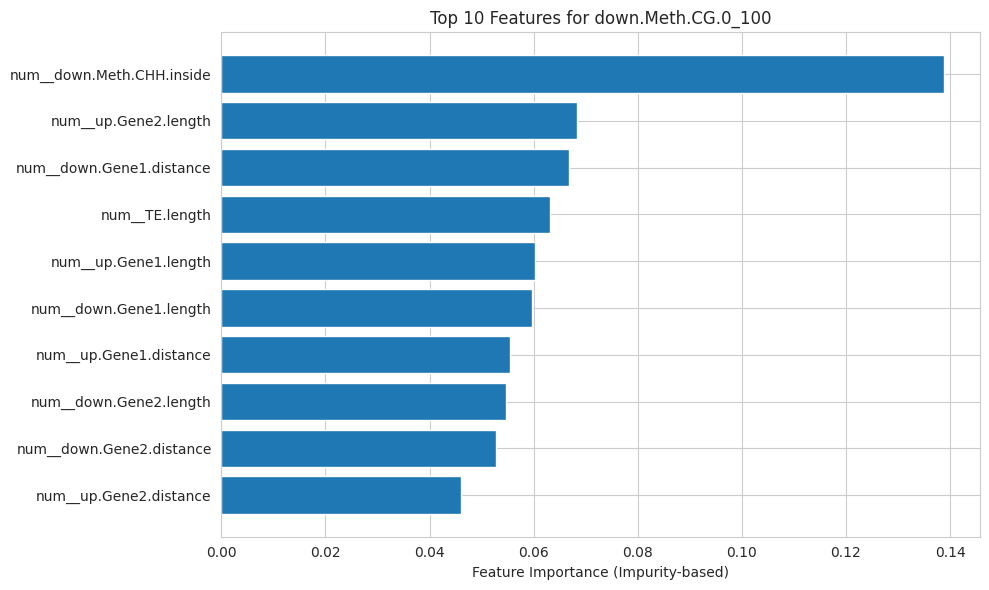


Feature Importance (Impurity-based) for down.Meth.CHG.0_100


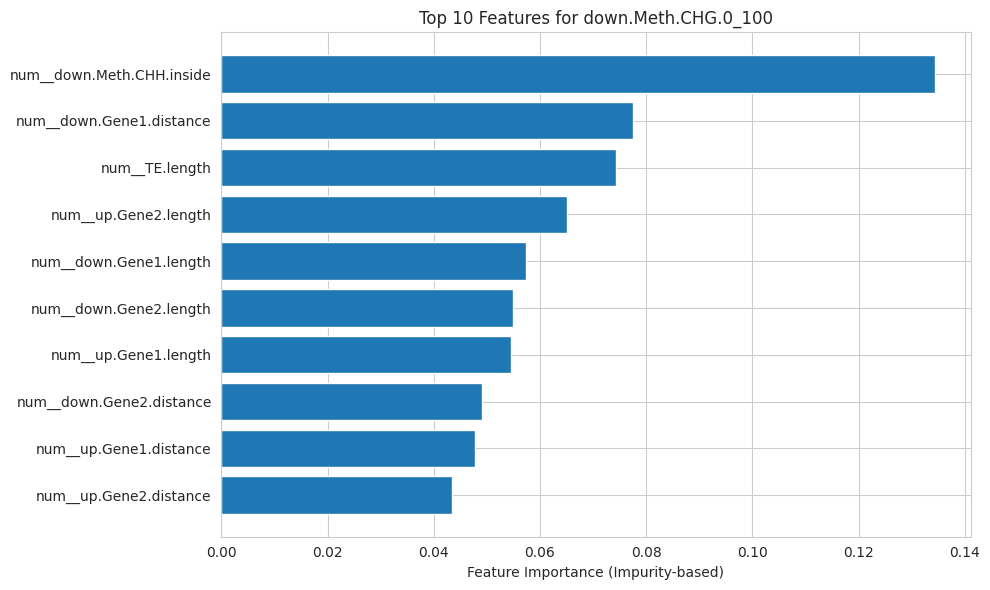


Feature Importance (Impurity-based) for down.Meth.CHH.0_100


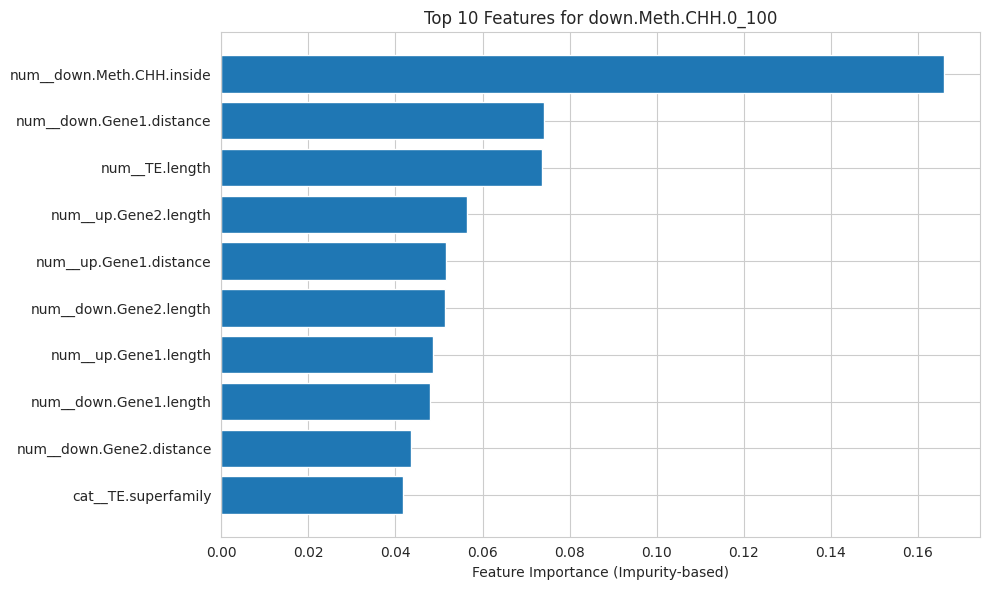


Feature Importance (Impurity-based) for up.Meth.CG.100_200


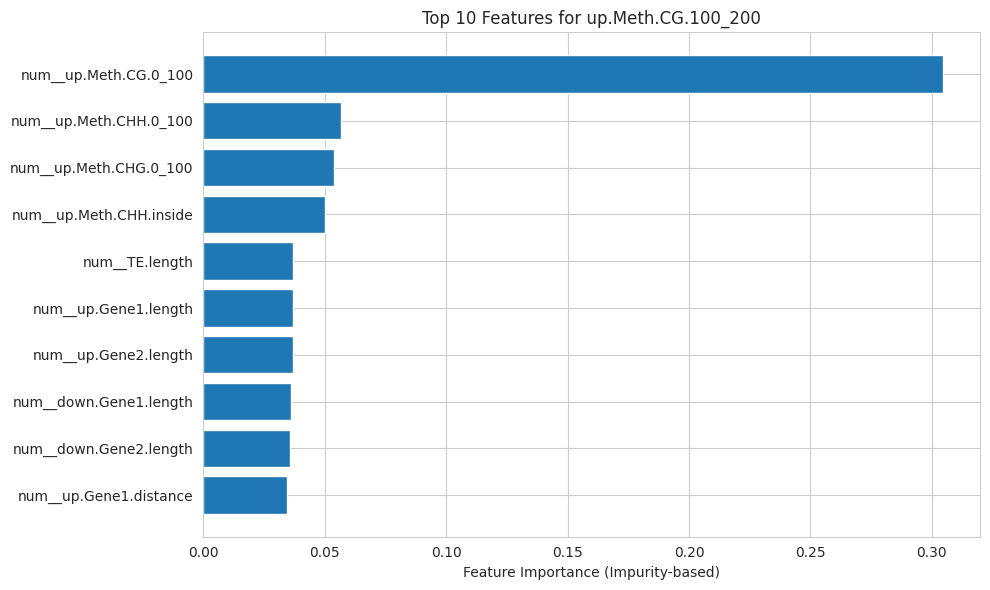


Feature Importance (Impurity-based) for up.Meth.CHG.100_200


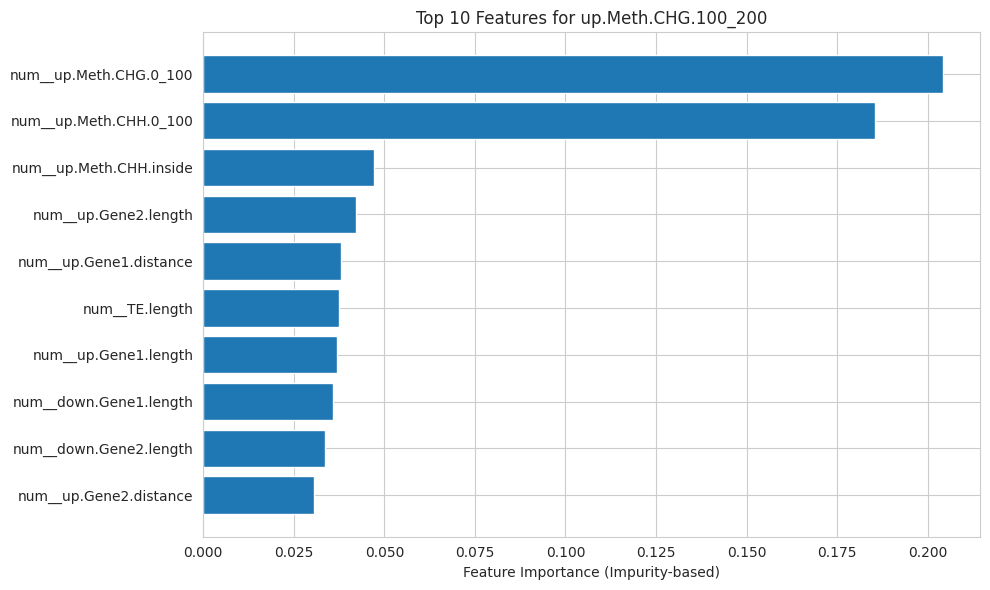


Feature Importance (Impurity-based) for up.Meth.CHH.100_200


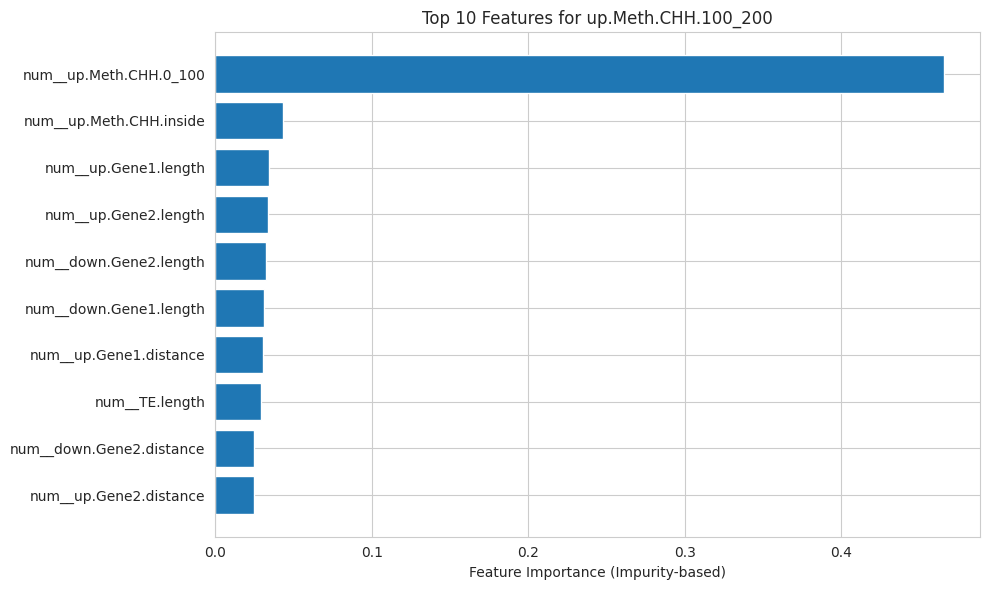


Feature Importance (Impurity-based) for down.Meth.CG.100_200


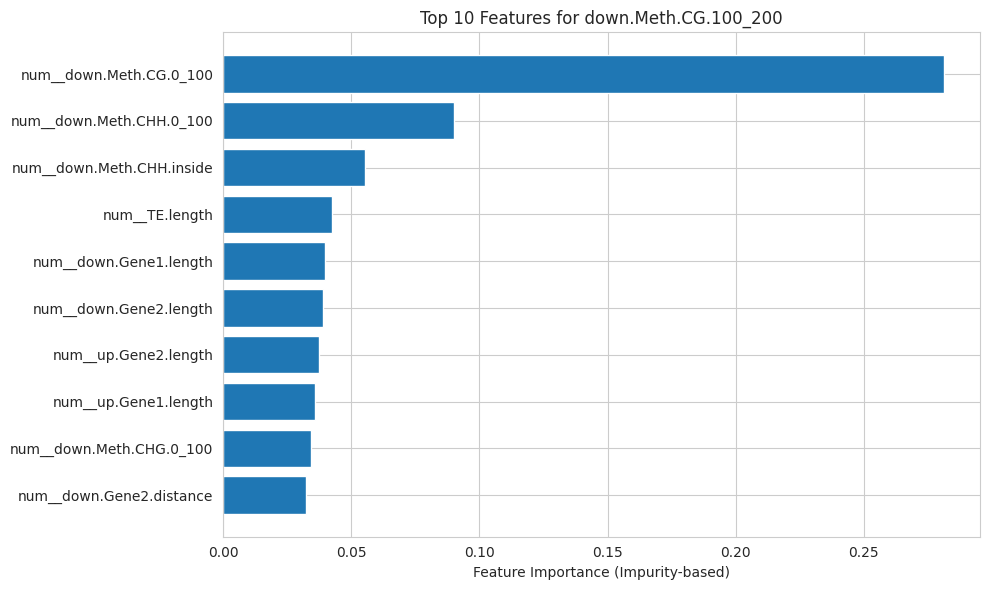


Feature Importance (Impurity-based) for down.Meth.CHG.100_200


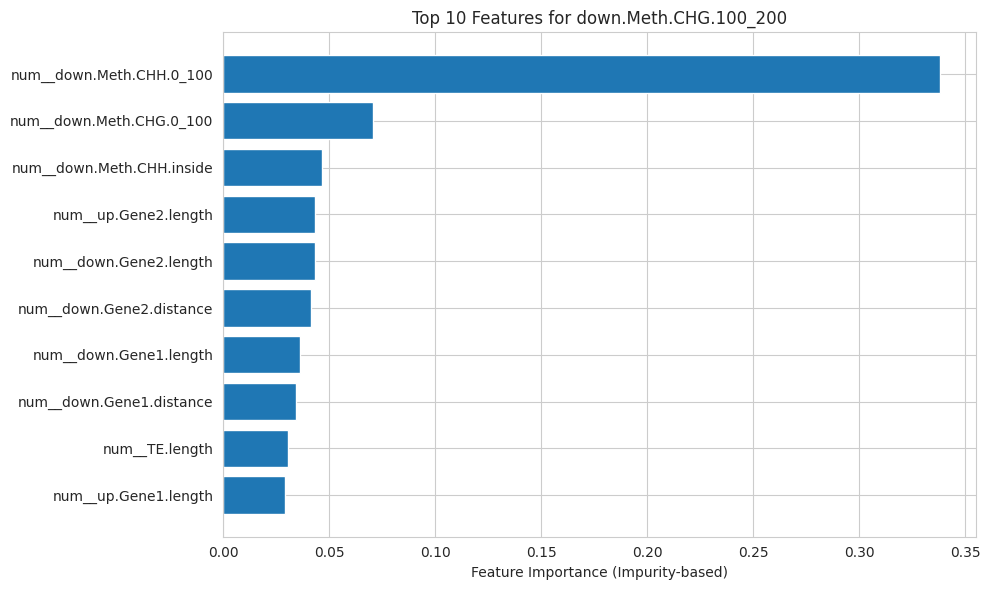


Feature Importance (Impurity-based) for down.Meth.CHH.100_200


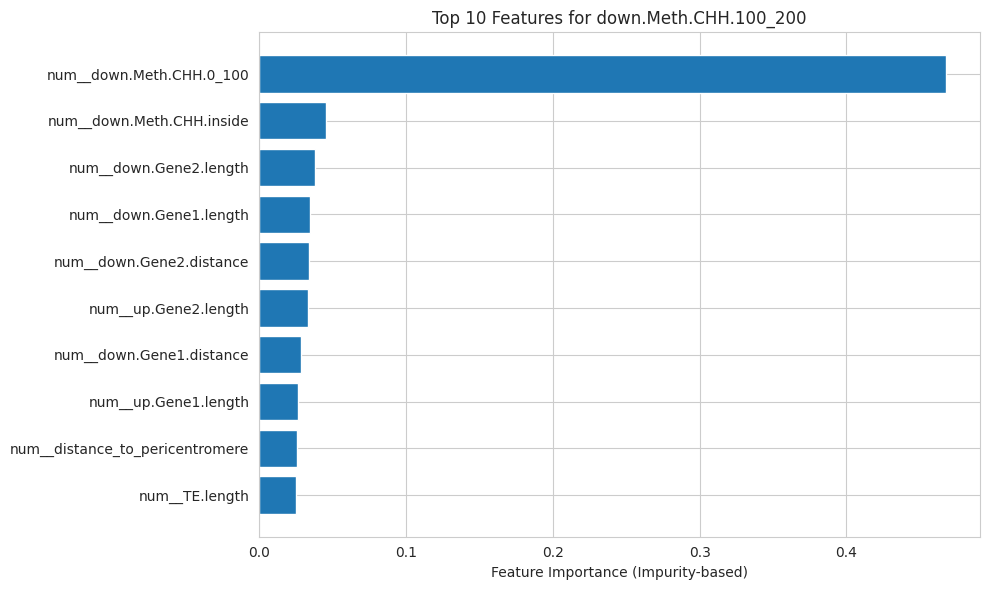


Feature Importance (Impurity-based) for up.Meth.CG.200_300


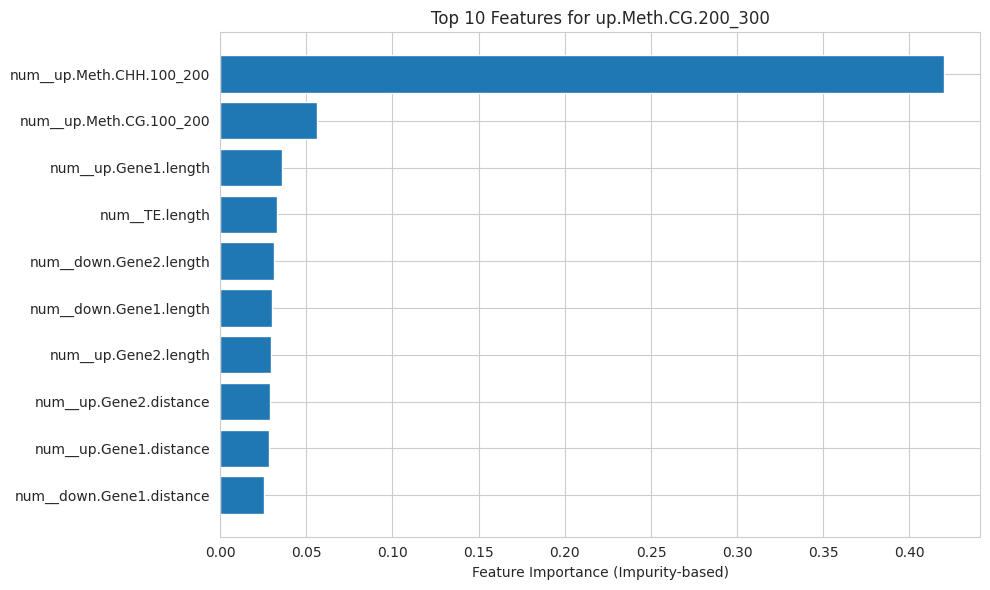


Feature Importance (Impurity-based) for up.Meth.CHG.200_300


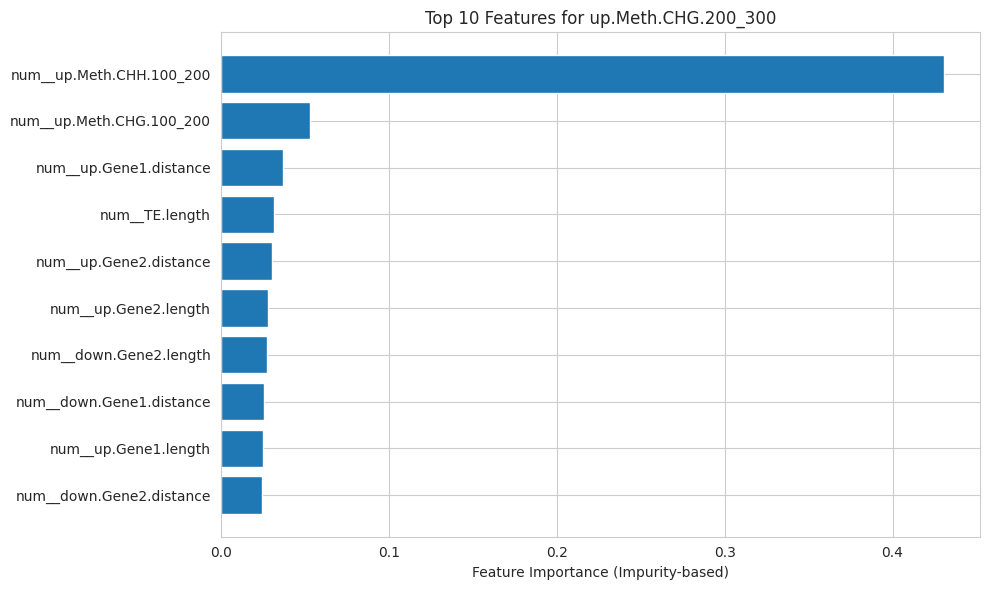


Feature Importance (Impurity-based) for up.Meth.CHH.200_300


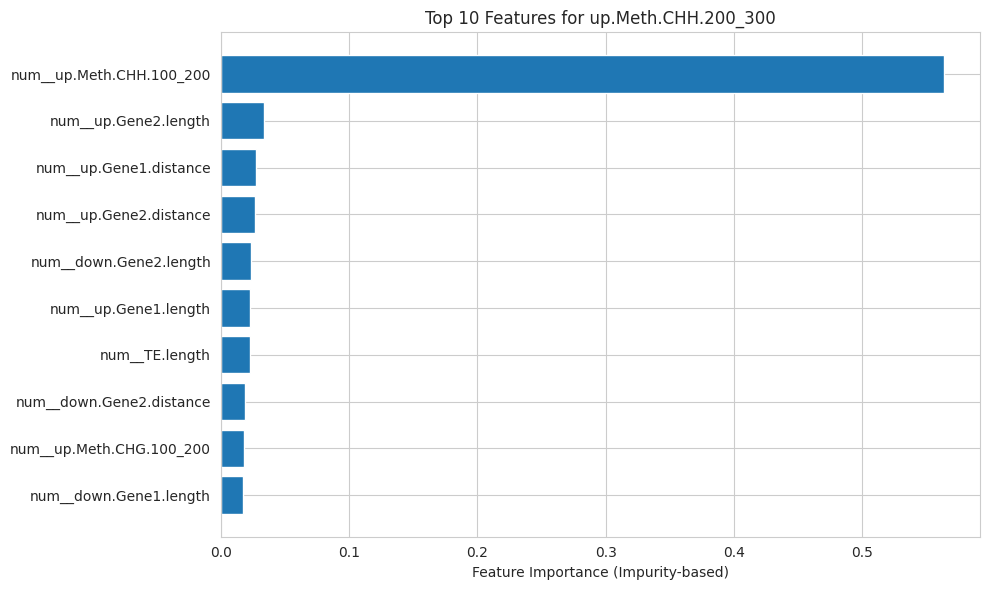


Feature Importance (Impurity-based) for down.Meth.CG.200_300


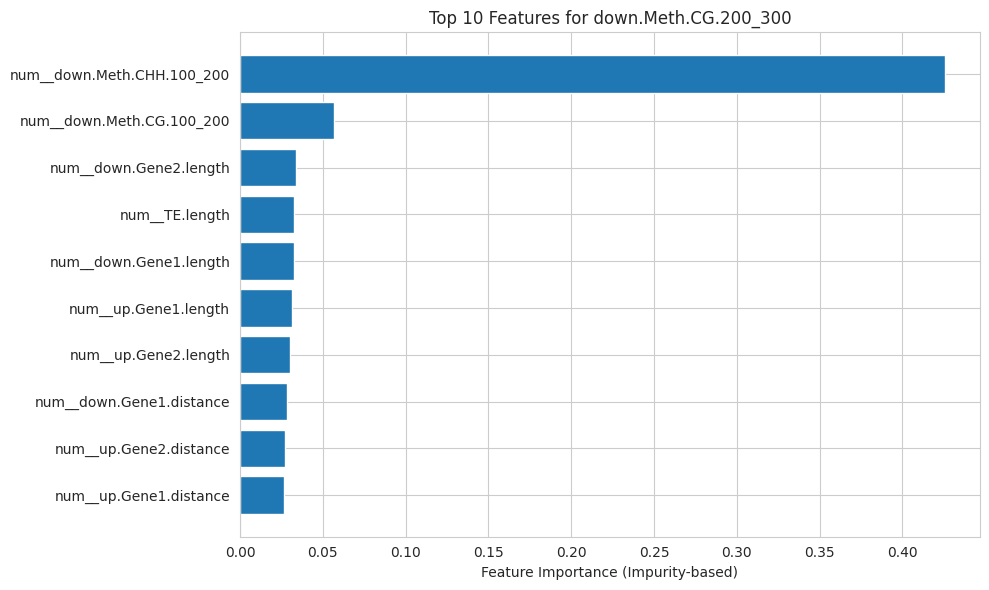


Feature Importance (Impurity-based) for down.Meth.CHG.200_300


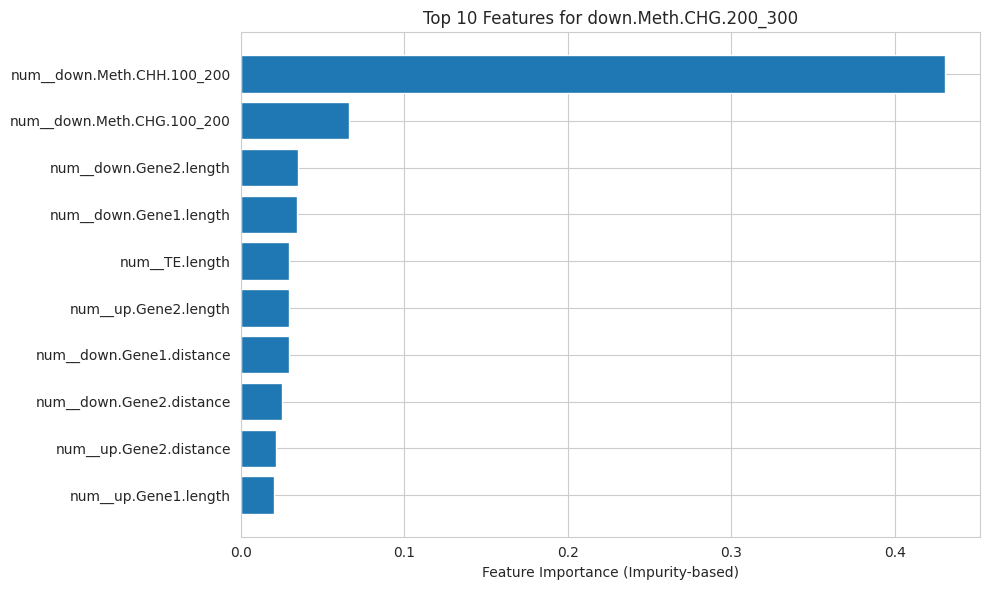


Feature Importance (Impurity-based) for down.Meth.CHH.200_300


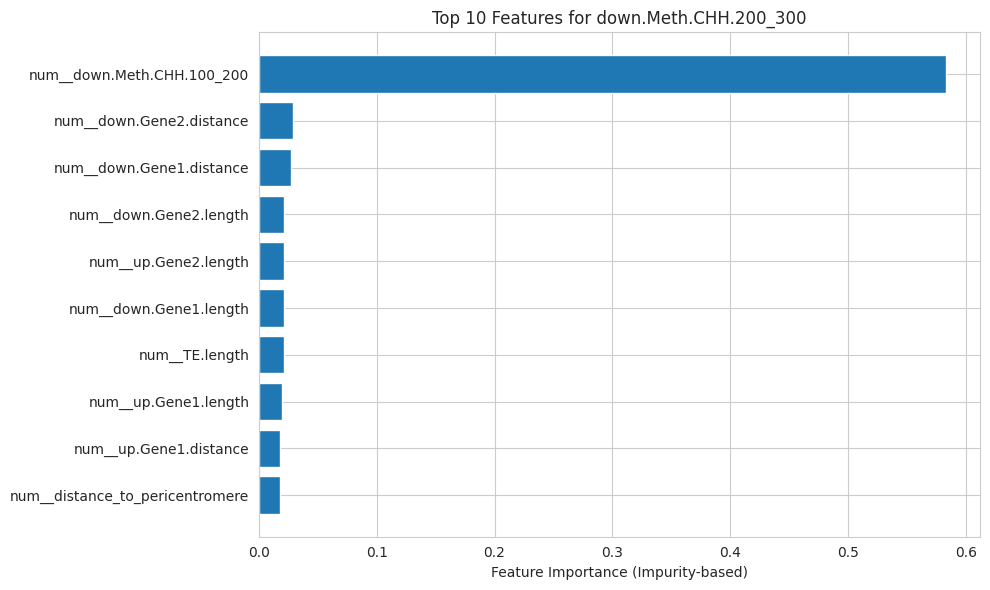

In [41]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

for target_col, model in models.items():
    print(f"\nFeature Importance (Impurity-based) for {target_col}")

    try:
        feature_names = model.named_steps["preprocessor"].get_feature_names_out()
        if "regressor" in model.named_steps:
            final_model = model.named_steps["regressor"]
        elif "classifier" in model.named_steps:
            final_model = model.named_steps["classifier"]
        else:
            print("Error")
    except AttributeError:
        try:
             feature_names = data_test.columns
             final_model = model
        except NameError:
             print("Error")
             continue

    if hasattr(final_model, "feature_importances_"):
        importances = final_model.feature_importances_
        indices = np.argsort(importances)

        num_features_to_plot = min(10, len(importances))
        top_indices = indices[-num_features_to_plot:]

        plt.figure(figsize=(10, 6))
        plt.barh(range(len(top_indices)), importances[top_indices], align="center")
        plt.yticks(range(len(top_indices)), [feature_names[i] for i in top_indices])
        plt.xlabel("Feature Importance (Impurity-based)")
        plt.title(f"Top {num_features_to_plot} Features for {target_col}")
        plt.tight_layout()
        plt.show()
    else:
        print(f"Model for {target_col} does not support impurity-based feature importances.")










### SHAP Method

In [42]:
!pip install shap
import shap
import numpy as np
import matplotlib.pyplot as plt


SHAP values for target: TE.Meth.CG


PermutationExplainer explainer: 956it [04:23,  3.63it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


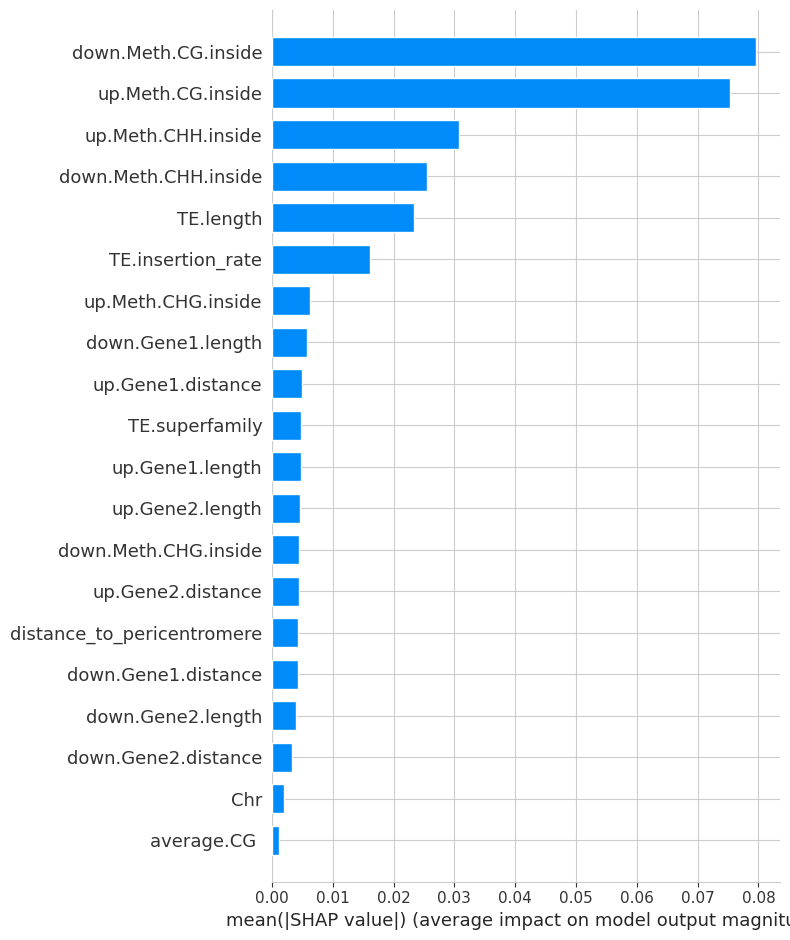


SHAP values for target: TE.Meth.CHG


PermutationExplainer explainer: 956it [03:46,  4.02it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


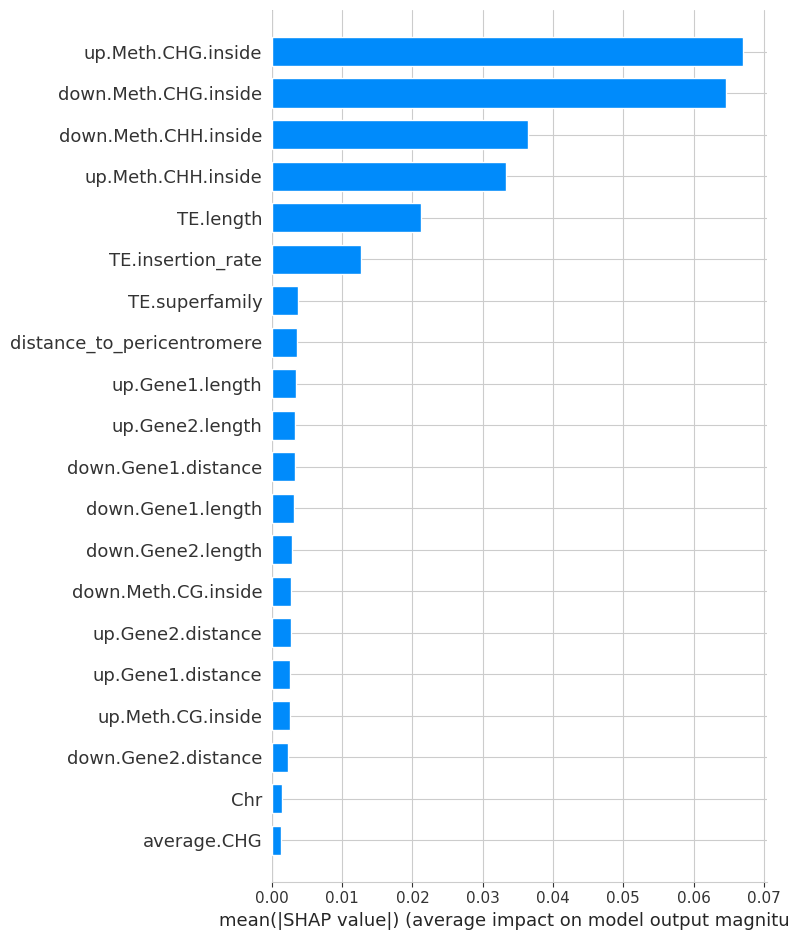


SHAP values for target: TE.Meth.CHH


PermutationExplainer explainer: 956it [03:40,  4.14it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


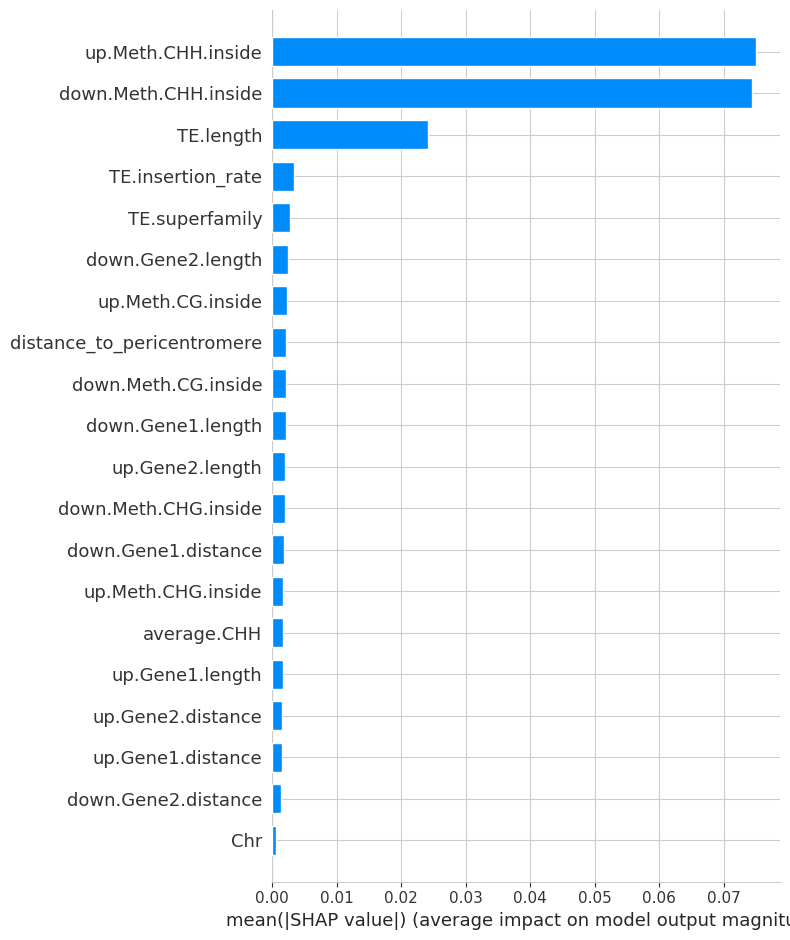


SHAP values for target: up.Meth.CG.0_100


PermutationExplainer explainer: 956it [03:32,  4.28it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


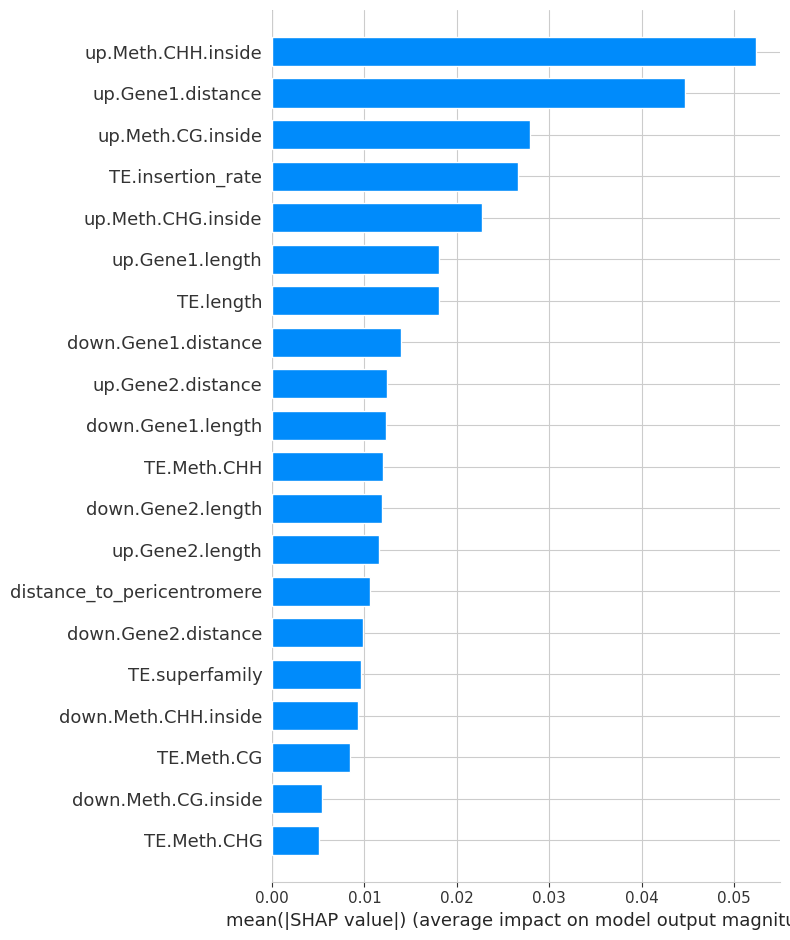


SHAP values for target: up.Meth.CHG.0_100


PermutationExplainer explainer: 956it [03:34,  4.25it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


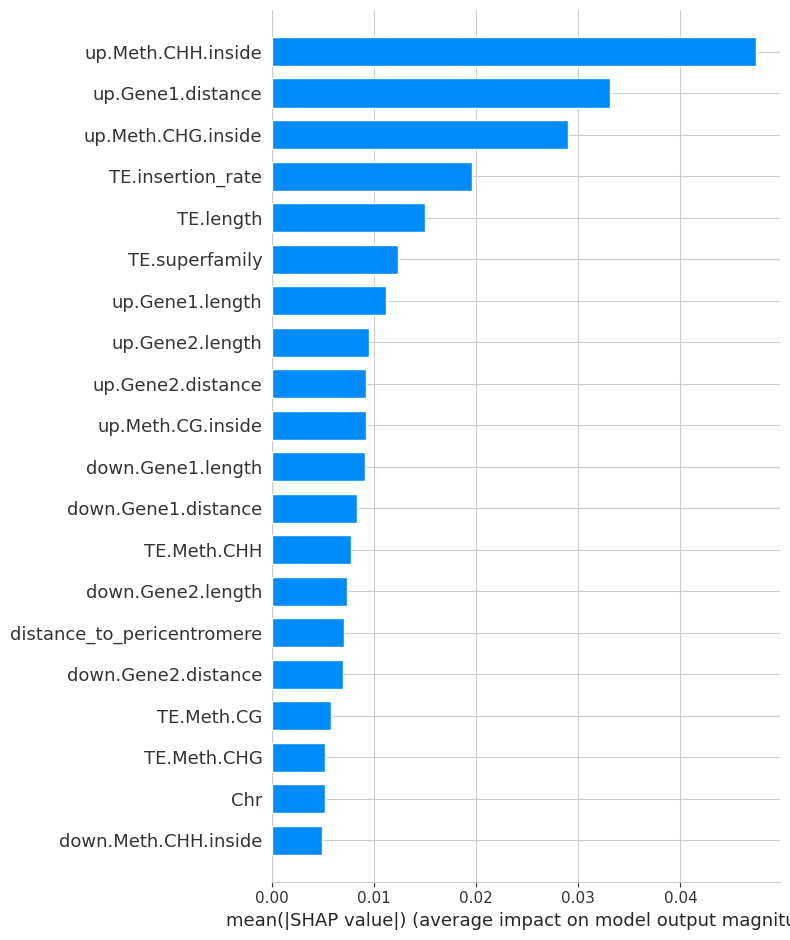


SHAP values for target: up.Meth.CHH.0_100


PermutationExplainer explainer: 956it [03:52,  3.94it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


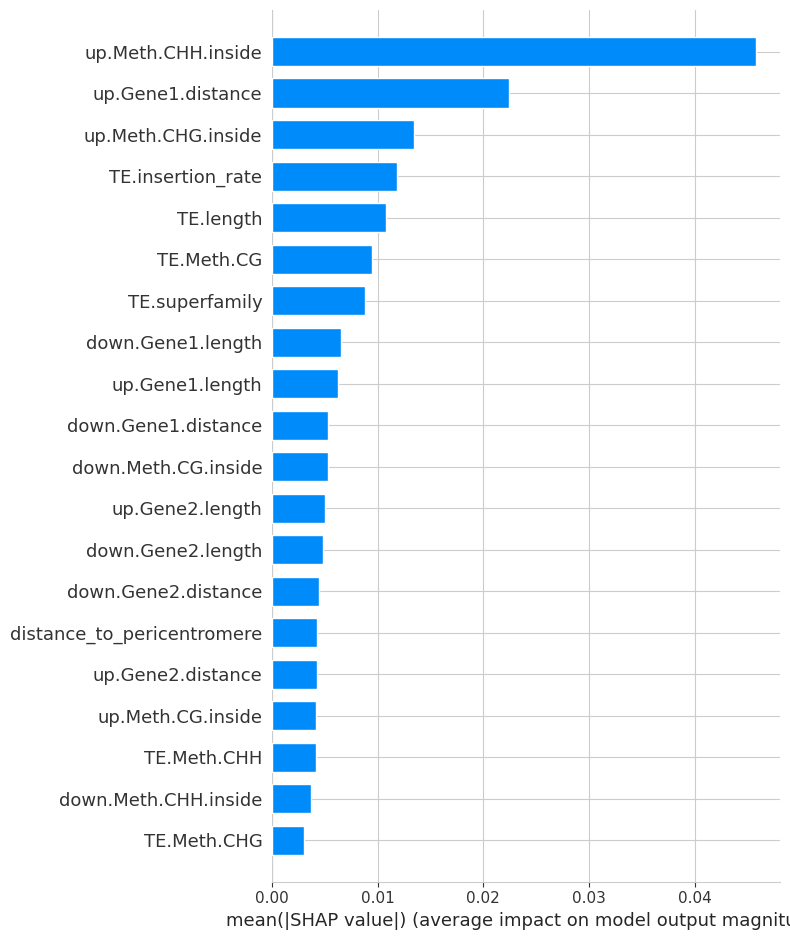


SHAP values for target: down.Meth.CG.0_100


PermutationExplainer explainer: 956it [04:07,  3.68it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


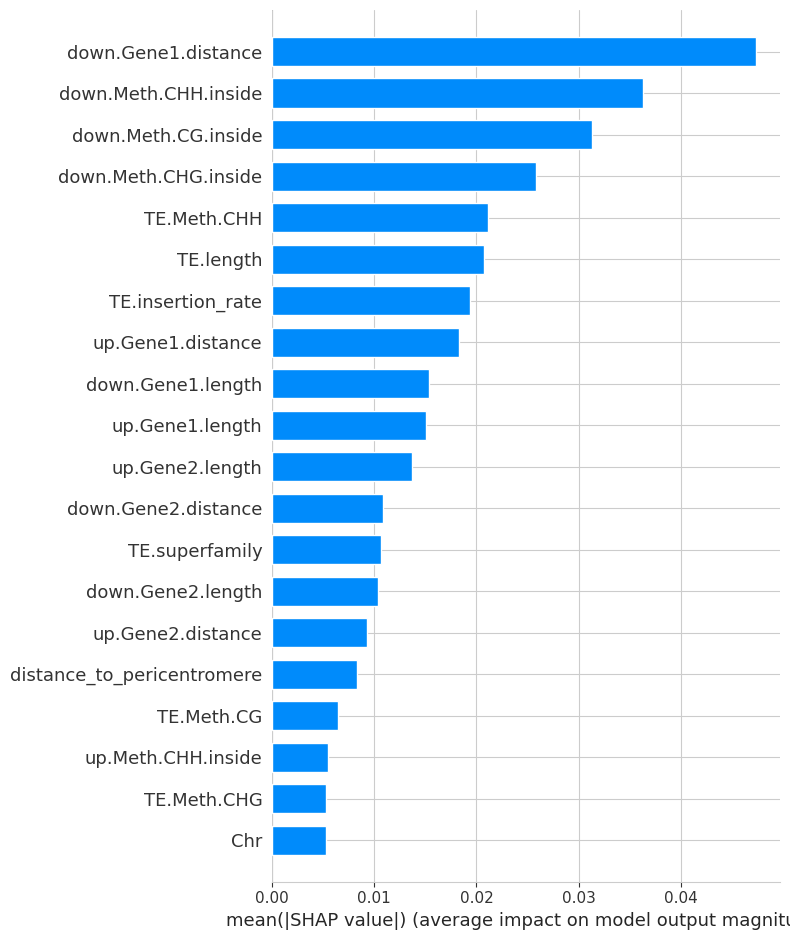


SHAP values for target: down.Meth.CHG.0_100


PermutationExplainer explainer: 956it [03:53,  3.94it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


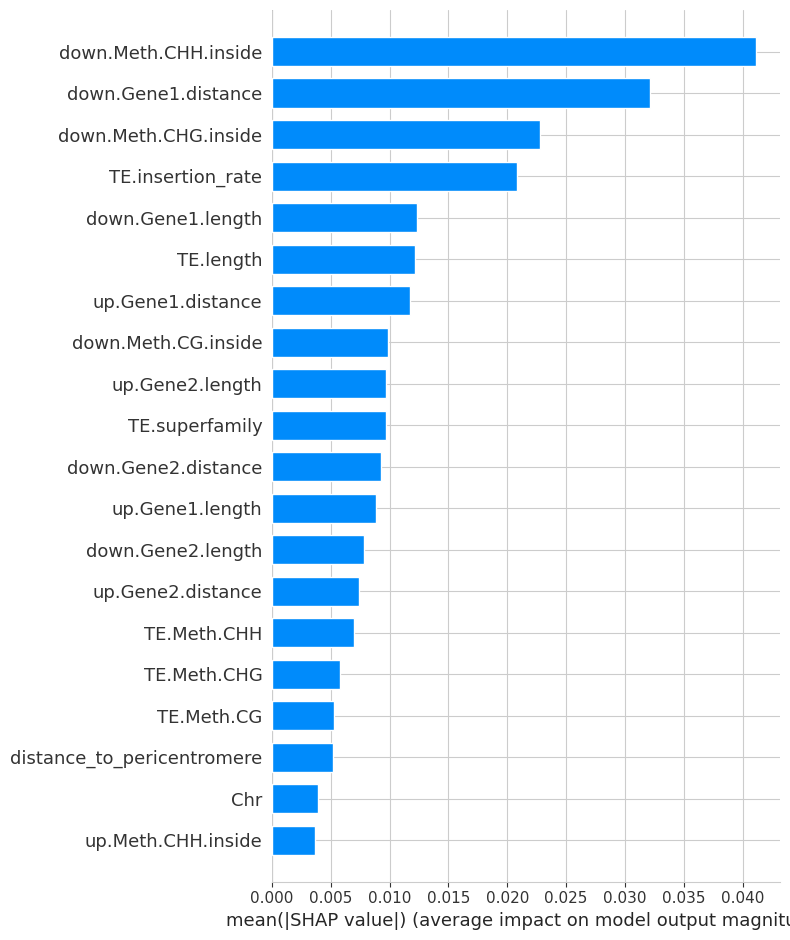


SHAP values for target: down.Meth.CHH.0_100


PermutationExplainer explainer: 956it [04:03,  3.76it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


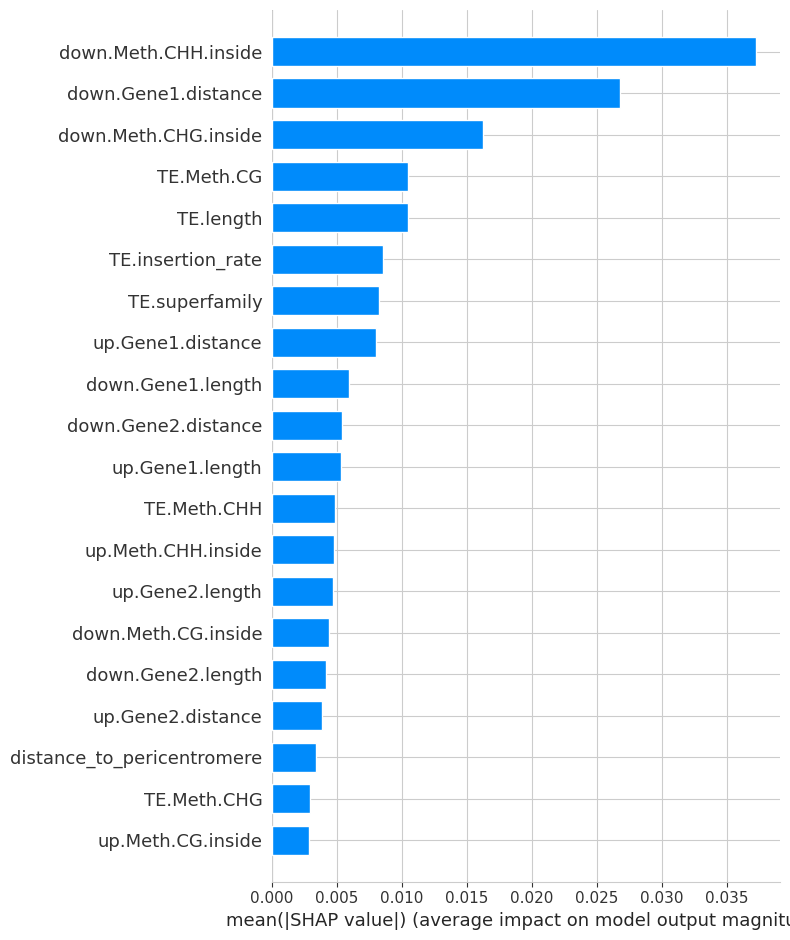


SHAP values for target: up.Meth.CG.100_200


PermutationExplainer explainer: 956it [03:34,  4.24it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


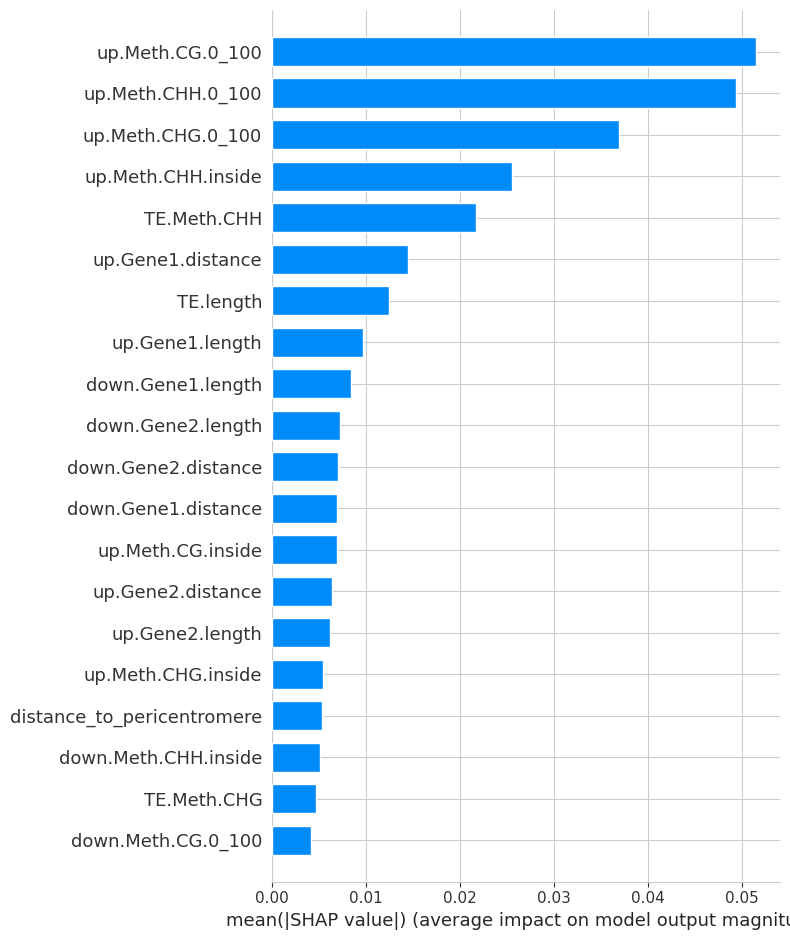


SHAP values for target: up.Meth.CHG.100_200


PermutationExplainer explainer: 956it [03:36,  4.23it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


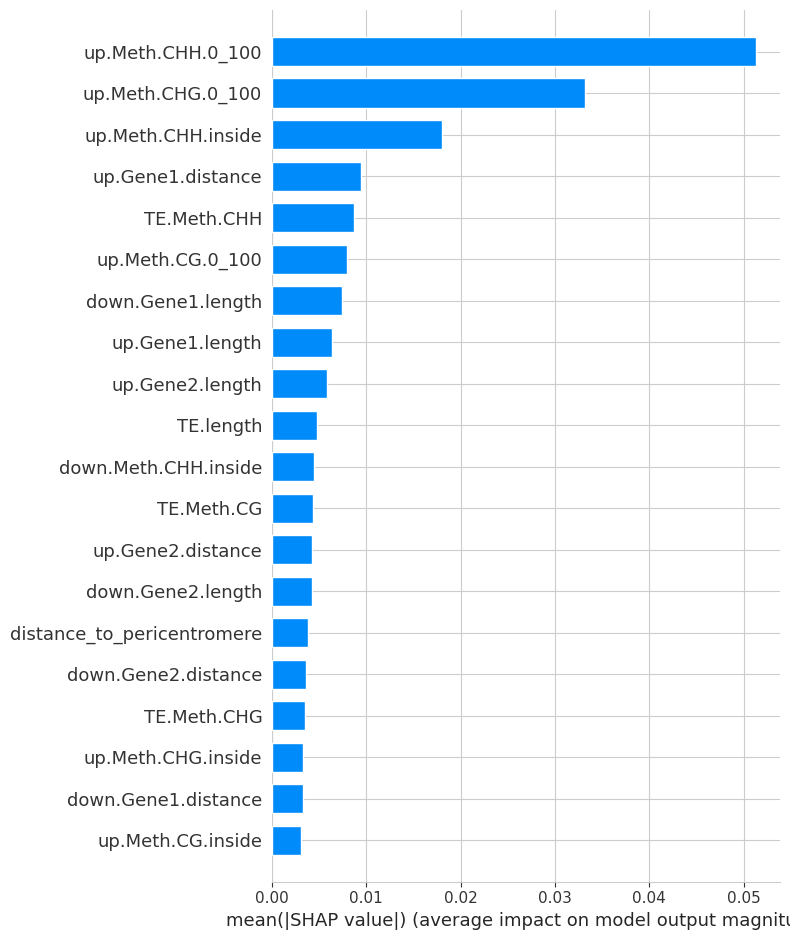


SHAP values for target: up.Meth.CHH.100_200


PermutationExplainer explainer: 956it [03:45,  4.04it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


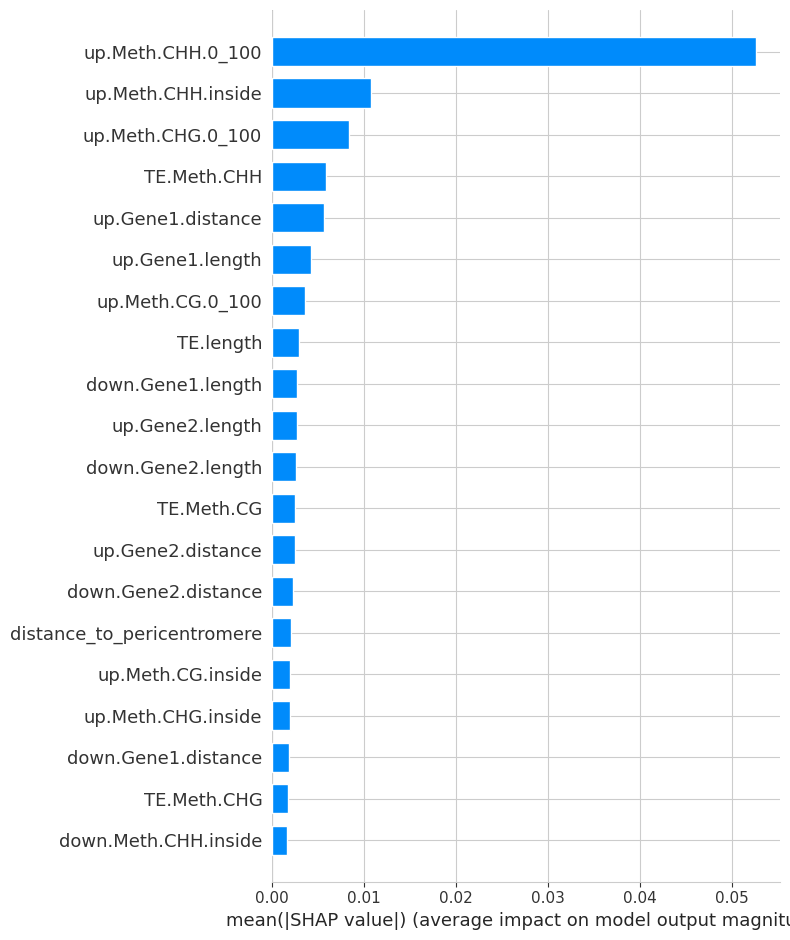


SHAP values for target: down.Meth.CG.100_200


PermutationExplainer explainer: 956it [03:40,  4.14it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


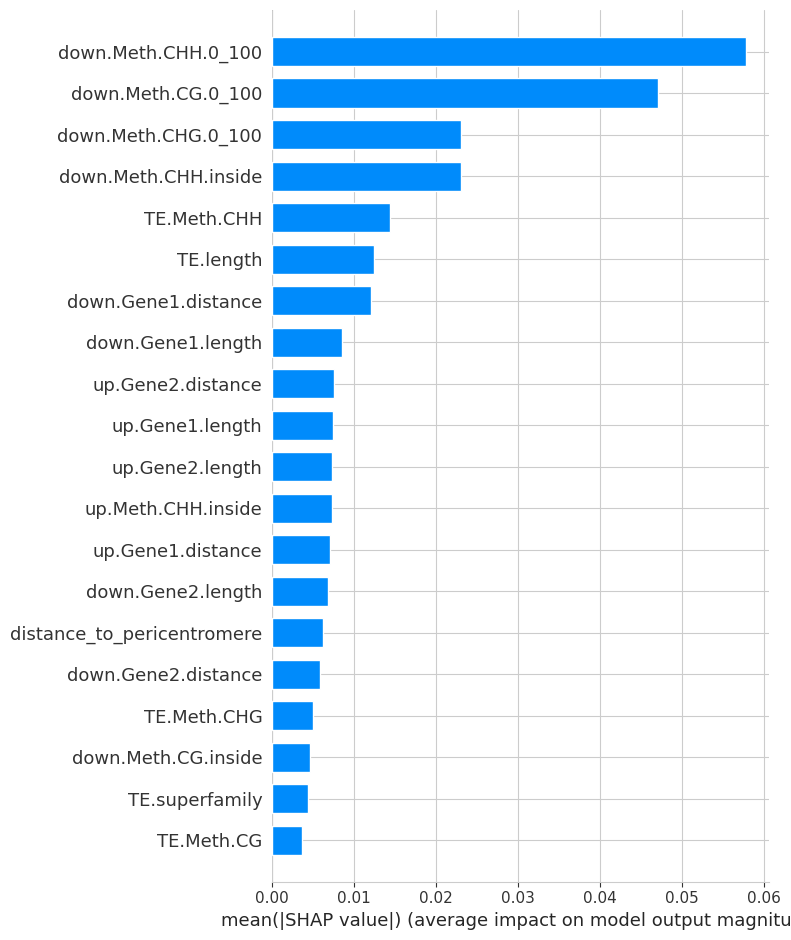


SHAP values for target: down.Meth.CHG.100_200


PermutationExplainer explainer: 956it [03:36,  4.21it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


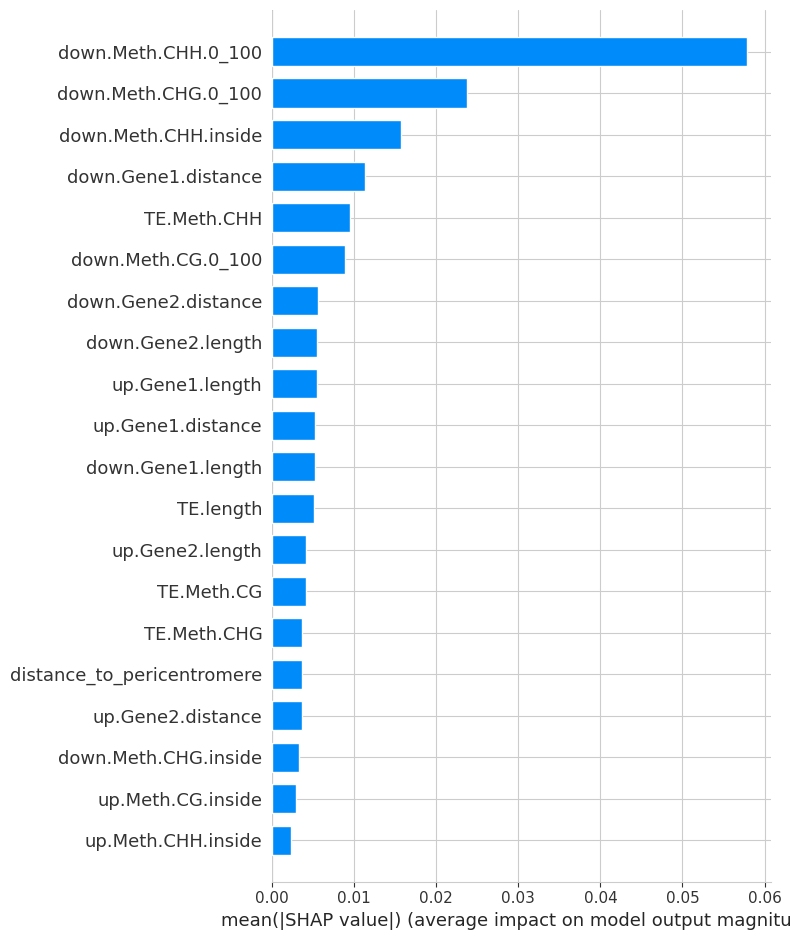


SHAP values for target: down.Meth.CHH.100_200


PermutationExplainer explainer: 956it [03:44,  4.08it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


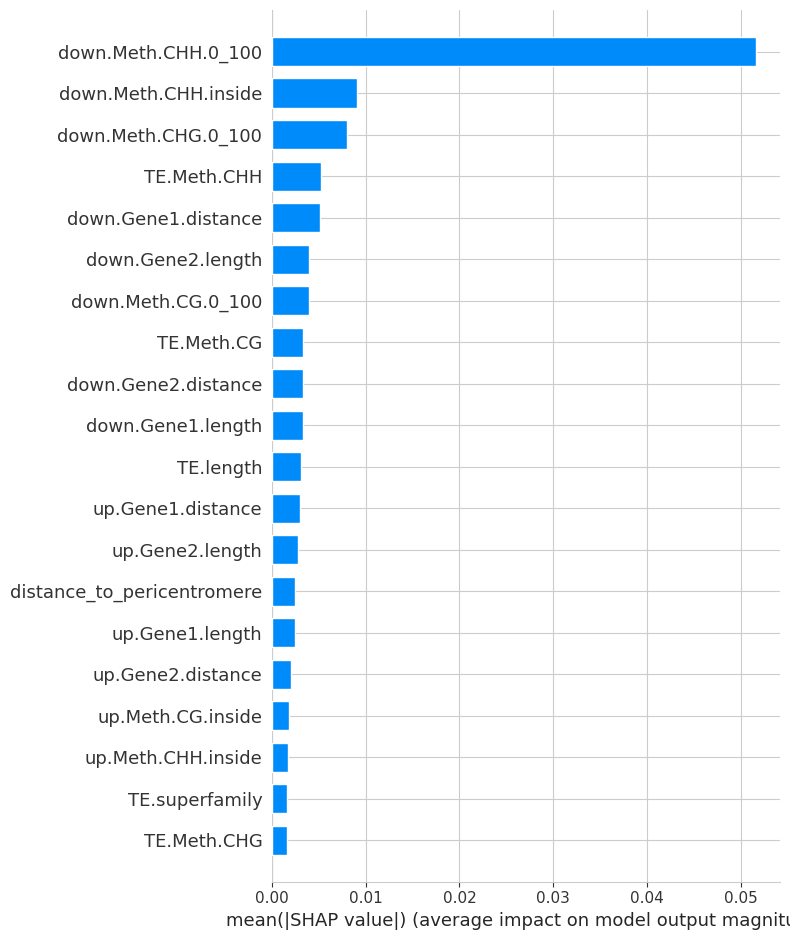


SHAP values for target: up.Meth.CG.200_300


PermutationExplainer explainer: 956it [03:23,  4.47it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


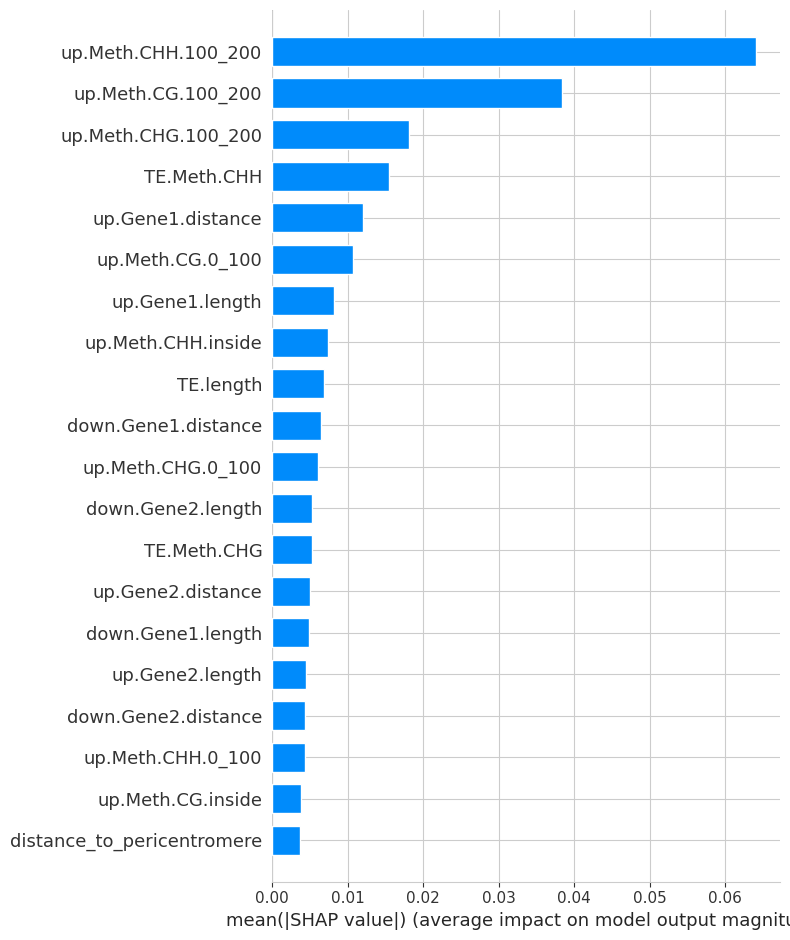


SHAP values for target: up.Meth.CHG.200_300


PermutationExplainer explainer: 956it [03:21,  4.48it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


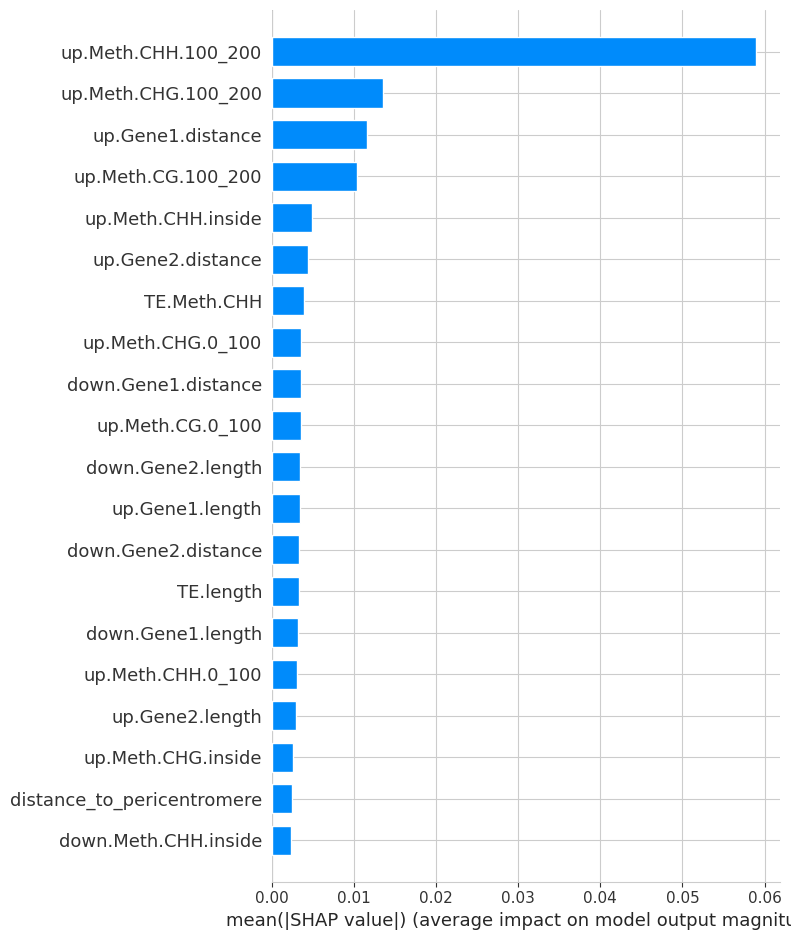


SHAP values for target: up.Meth.CHH.200_300


PermutationExplainer explainer: 956it [03:28,  4.35it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


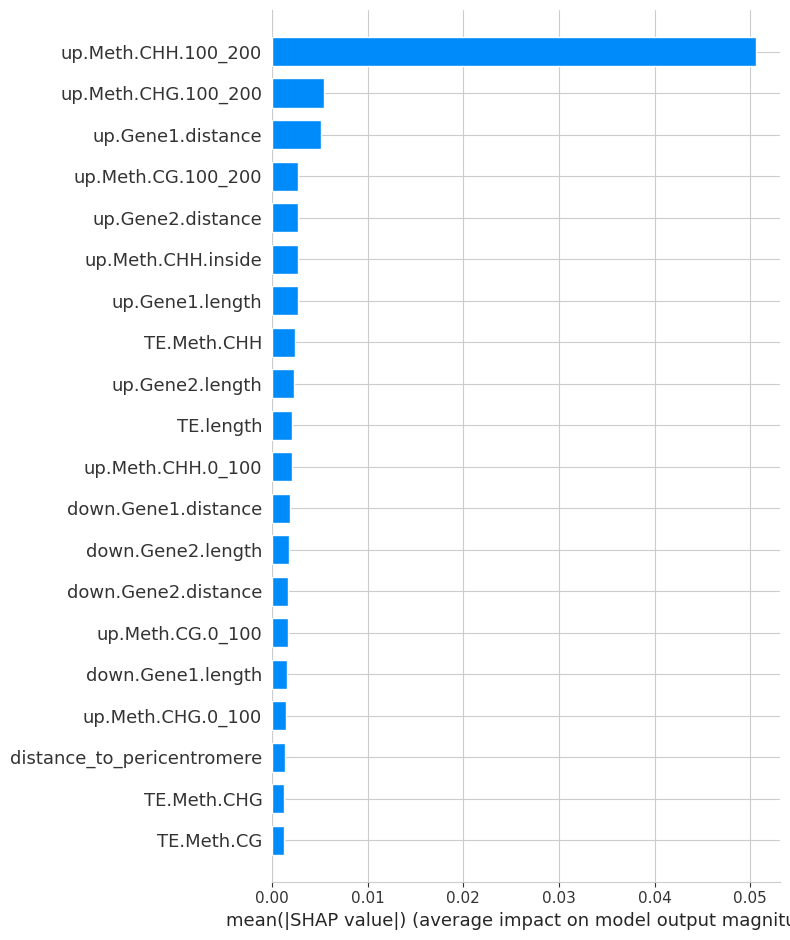


SHAP values for target: down.Meth.CG.200_300


PermutationExplainer explainer: 956it [03:27,  4.37it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


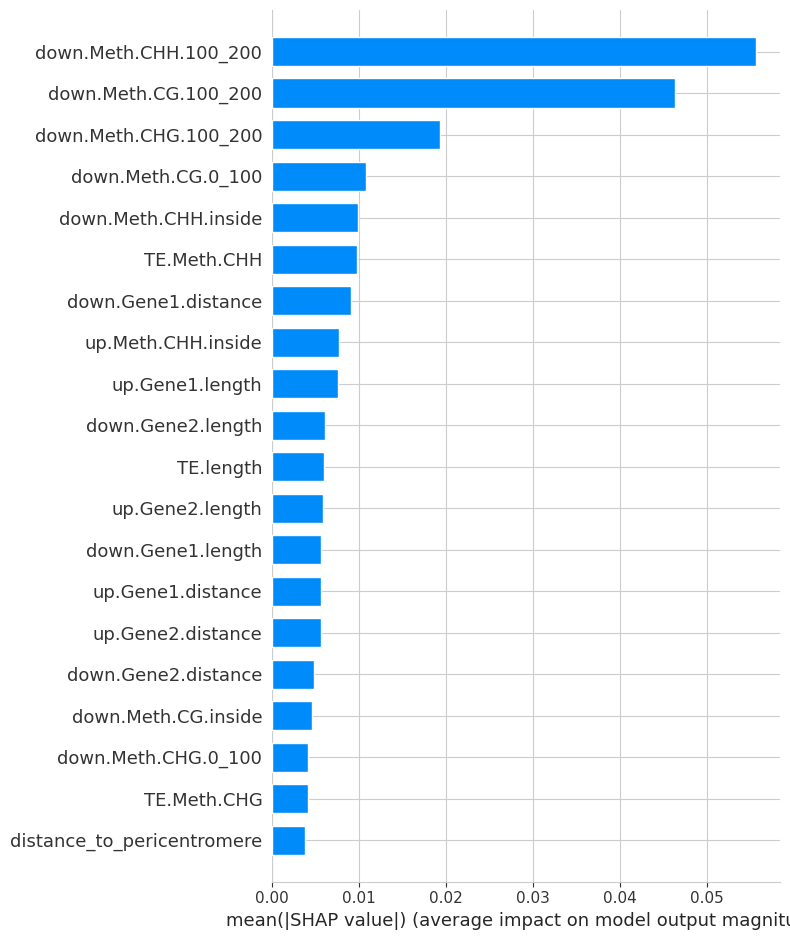


SHAP values for target: down.Meth.CHG.200_300


PermutationExplainer explainer: 956it [03:43,  4.07it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


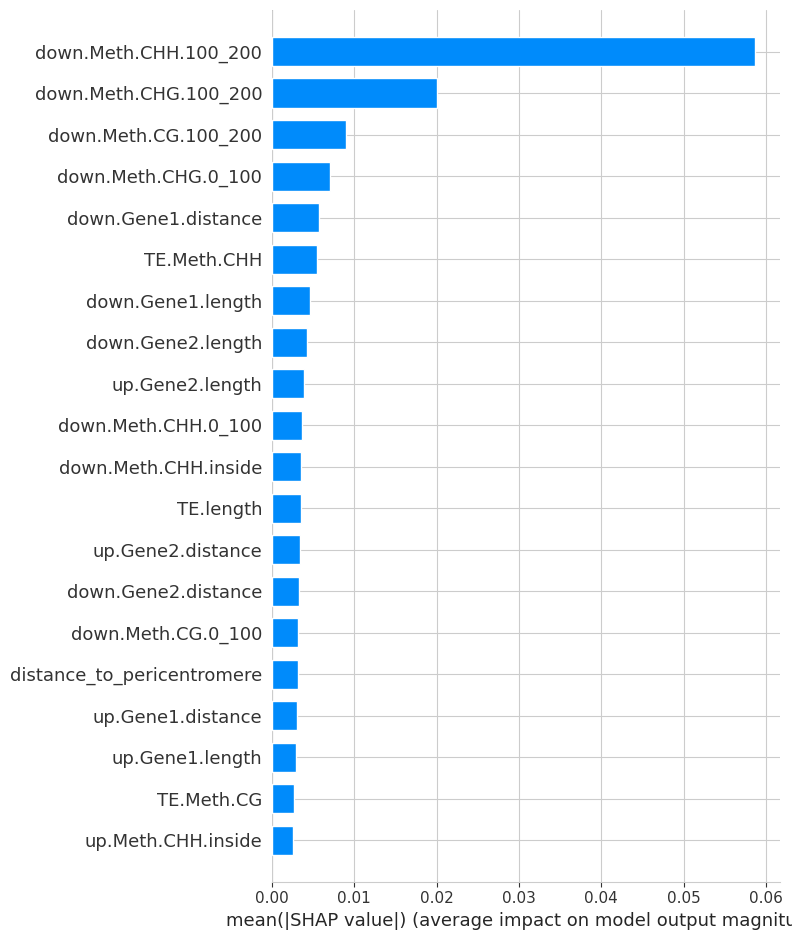


SHAP values for target: down.Meth.CHH.200_300


PermutationExplainer explainer: 956it [03:34,  4.25it/s]
/tmp/ipython-input-533983815.py:62: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


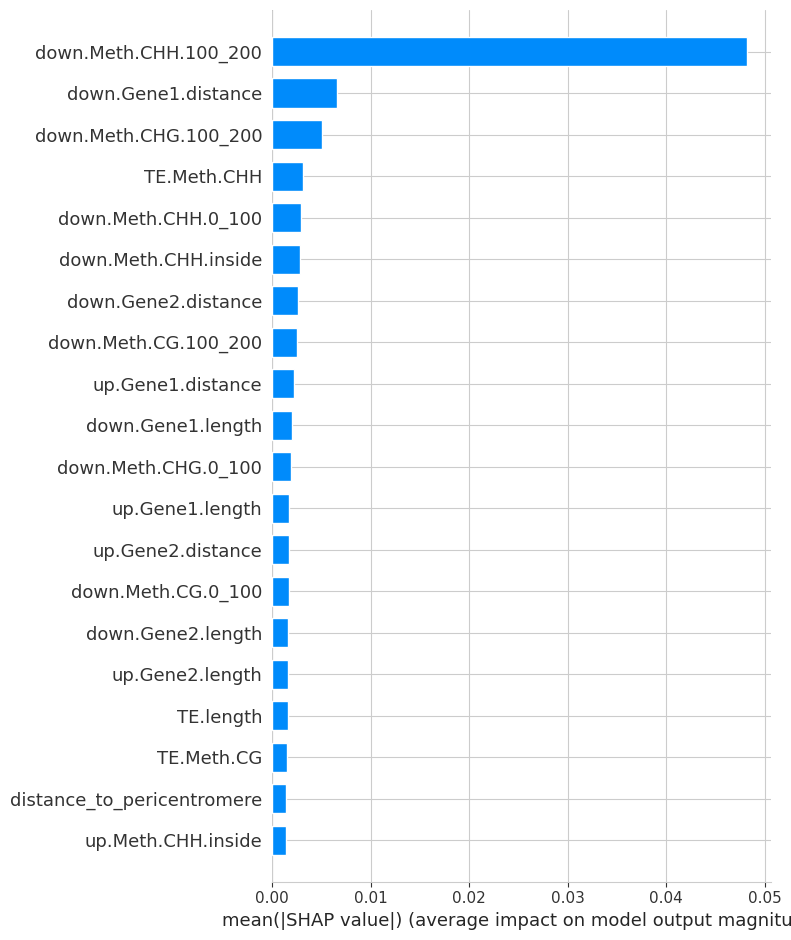

In [45]:
# Dictionaries --> storing SHAP outputs for visualization

shap_values_dict = {}
X_test_transformed_dict = {}
feature_names_dict = {}
sampled_data_test_dict = {}   # Raw sampled test set (untransformed)

# Define all_target_columns_list by concatenating individual target lists
all_target_columns_list = (
    target_methylation_columns_TE +
    target_methylation_columns_0_100 +
    target_methylation_columns_100_200 +
    target_methylation_columns_200_300
)


# Looping over each target variable to compute and store SHAP values

for target_col in all_target_columns_list:
    print(f"\nSHAP values for target: {target_col}")

    if 'TE.Meth' in target_col:
        window_name = 'TE'
    elif '0_100' in target_col:
        window_name = '0-100'
    elif '100_200' in target_col:
        window_name = '100-200'
    elif '200_300' in target_col:
        window_name = '200-300'
    else:
        print(f"Skipping {target_col}: Window name could not be determined.")
        continue

    if window_name in data_test_dict and window_name in categorical_cols_dict and window_name in numeric_cols_dict:
        data_test = data_test_dict[window_name]
        categorical_cols_for_model = categorical_cols_dict[window_name]
        numeric_cols_for_model = numeric_cols_dict[window_name]
    else:
        print(f"Skipping {target_col}: data_test, categorical_cols, or numeric_cols not found for window {window_name}")
        continue

    # Previous trained model and preprocessing steps
    model = models[target_col]
    preprocessor = model.named_steps['preprocessor']
    rf_model = model.named_steps['regressor']

    oe = preprocessor.named_transformers_['cat']
    oe_feature_names = oe.get_feature_names_out(categorical_cols_for_model)
    all_feature_names = np.concatenate([oe_feature_names, numeric_cols_for_model])

    # Sample 3% (approximately 1000 data) of the test set (to speed up SHAP computation : took to much time with x> 0.03. No difference in the results with x = 0.05)
    sampled_data_test = data_test.sample(frac=0.03, random_state=42)
    X_test_transformed = preprocessor.transform(sampled_data_test)

    # Computing SHAP values + storing  + plotting
    explainer = shap.Explainer(rf_model.predict, X_test_transformed)
    shap_values = explainer(X_test_transformed)
    shap_values_dict[target_col] = shap_values
    X_test_transformed_dict[target_col] = X_test_transformed
    feature_names_dict[target_col] = all_feature_names
    sampled_data_test_dict[target_col] = sampled_data_test
    shap.summary_plot(shap_values, X_test_transformed, feature_names=all_feature_names, plot_type='bar')


Waterfall plot for target: TE.Meth.CG


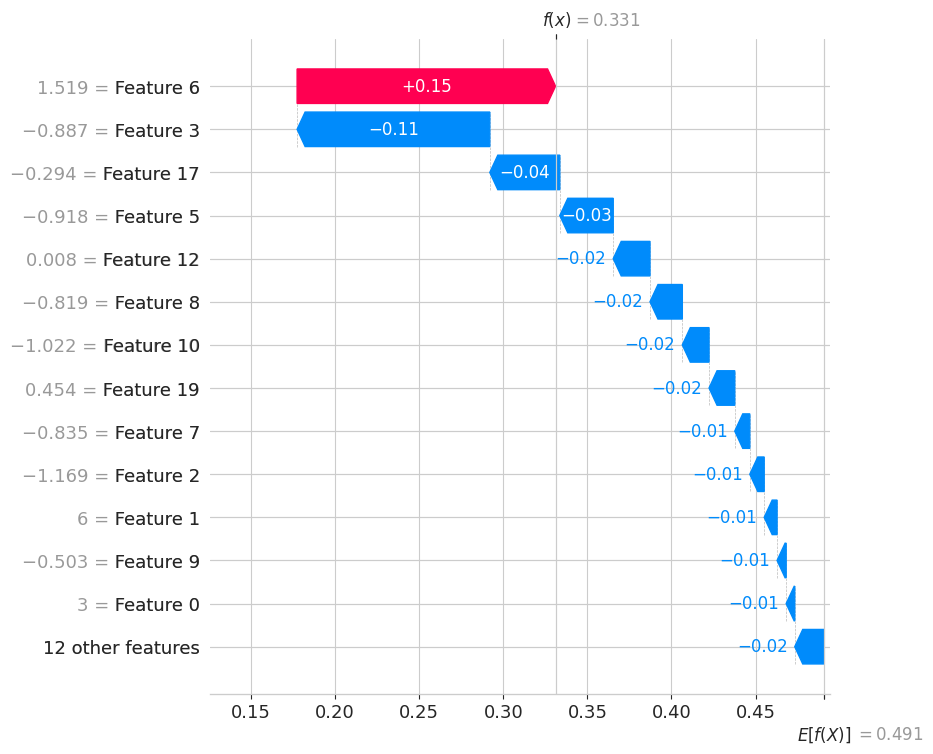


Waterfall plot for target: TE.Meth.CHG


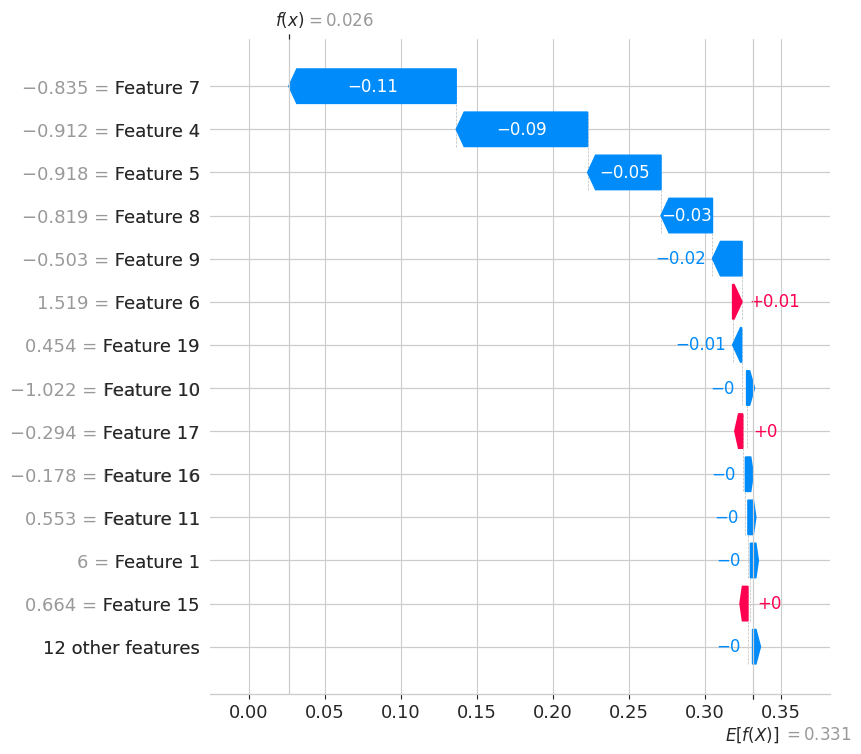


Waterfall plot for target: TE.Meth.CHH


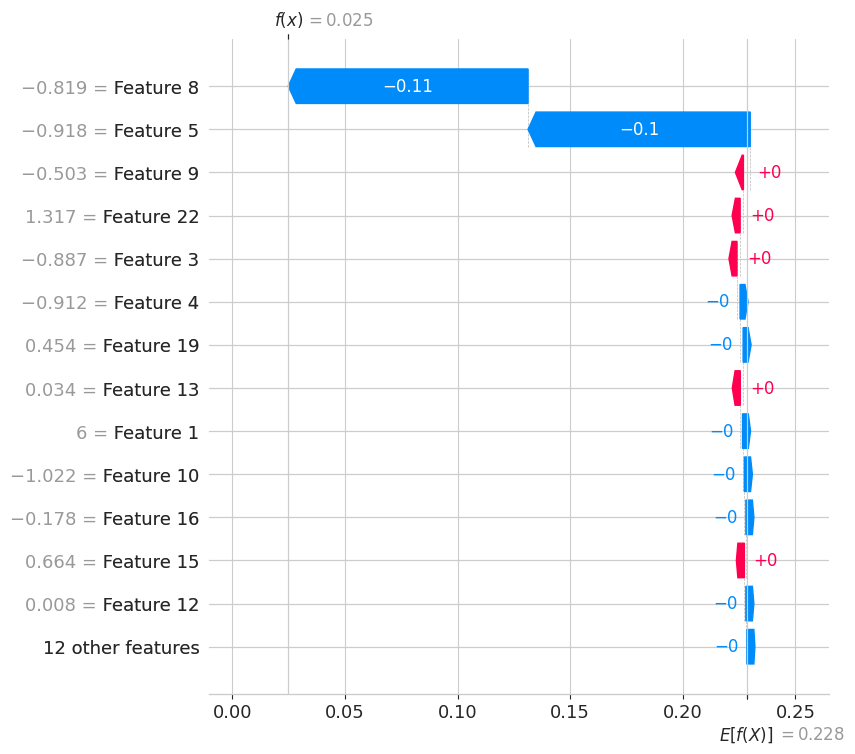


Waterfall plot for target: up.Meth.CG.0_100


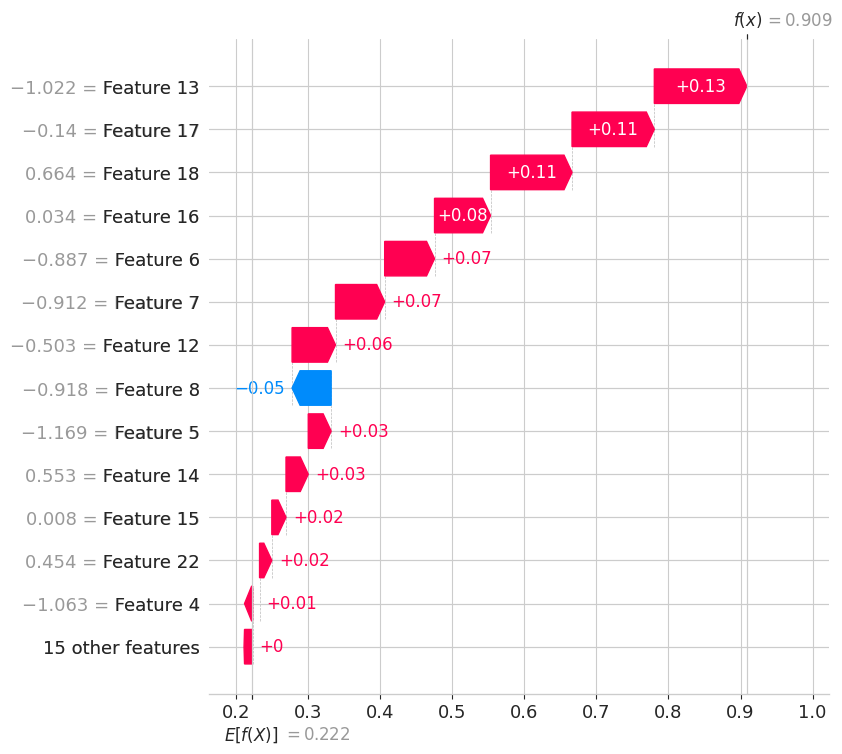


Waterfall plot for target: up.Meth.CHG.0_100


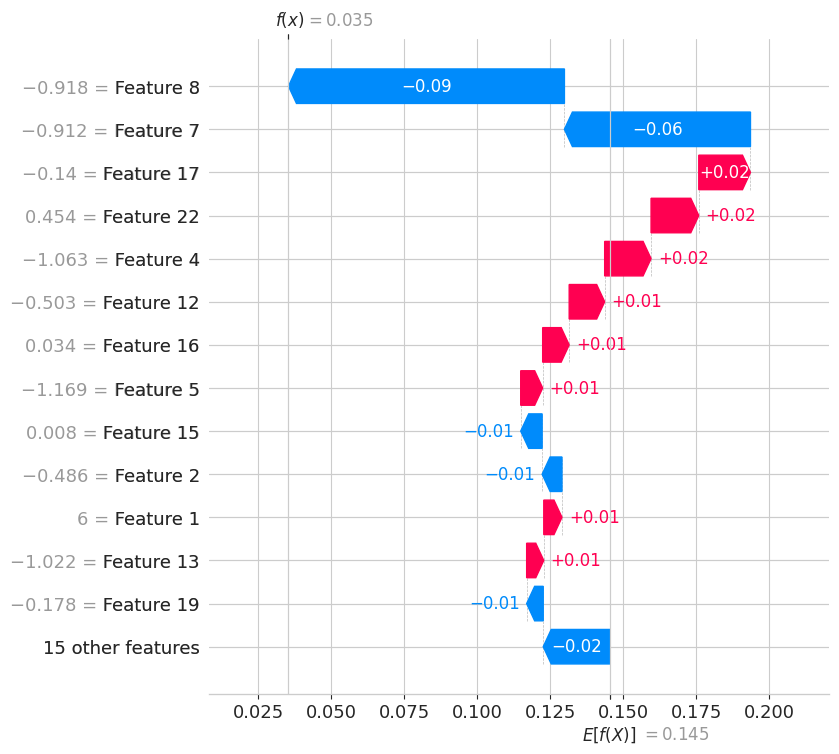


Waterfall plot for target: up.Meth.CHH.0_100


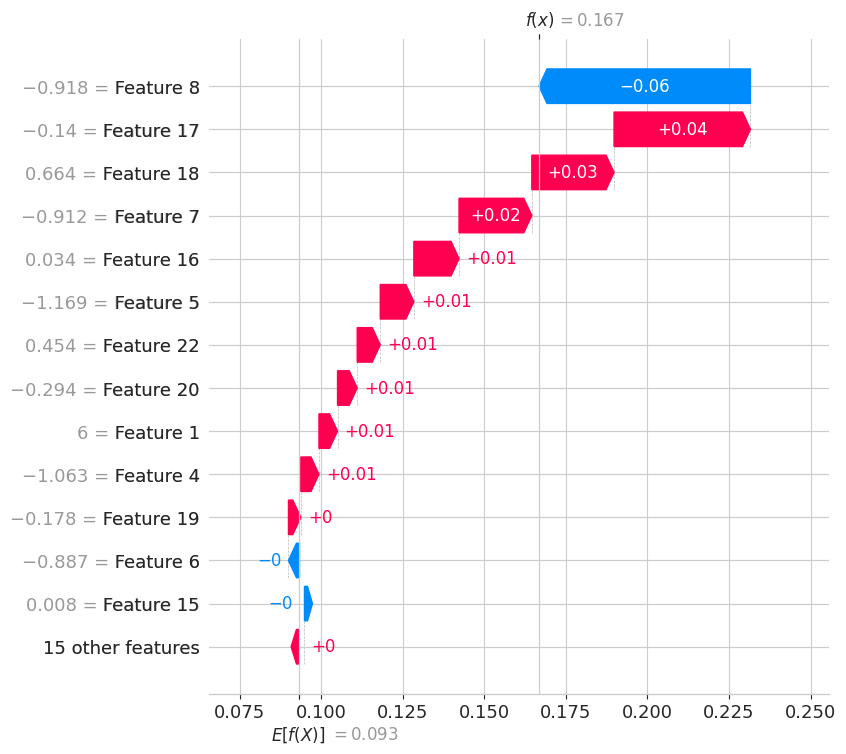


Waterfall plot for target: down.Meth.CG.0_100


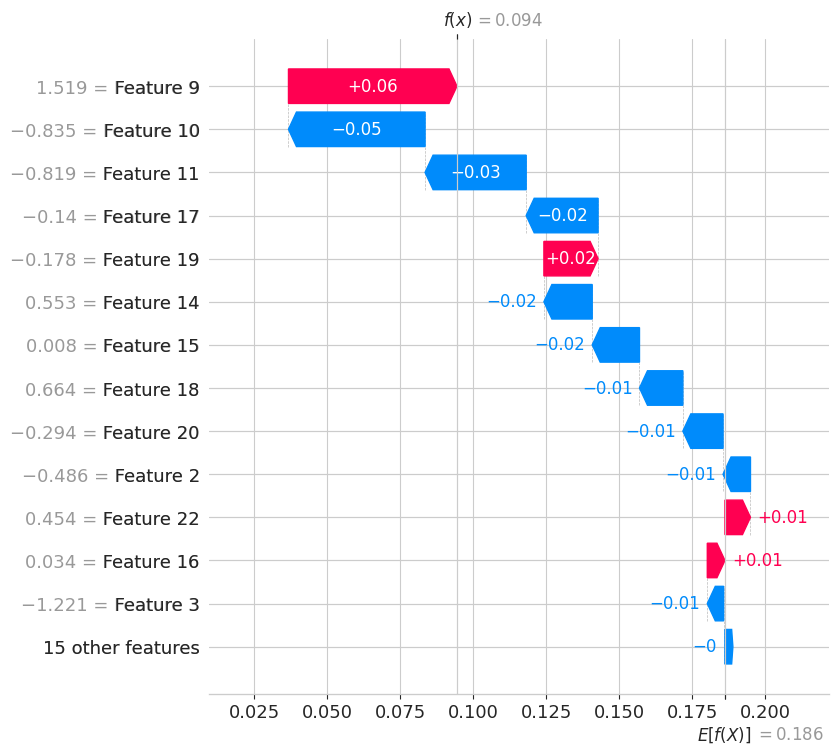


Waterfall plot for target: down.Meth.CHG.0_100


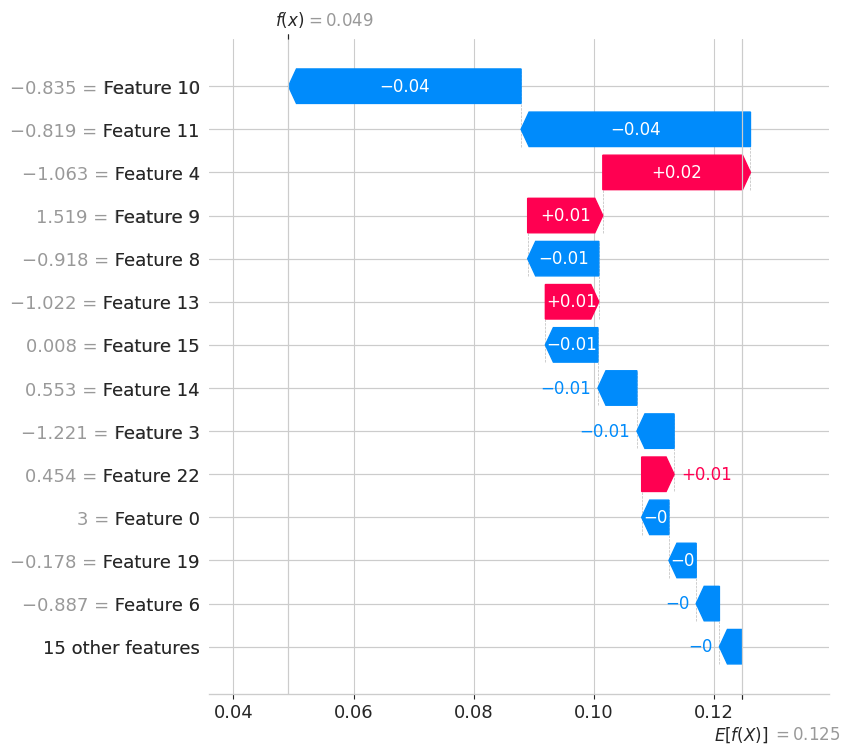


Waterfall plot for target: down.Meth.CHH.0_100


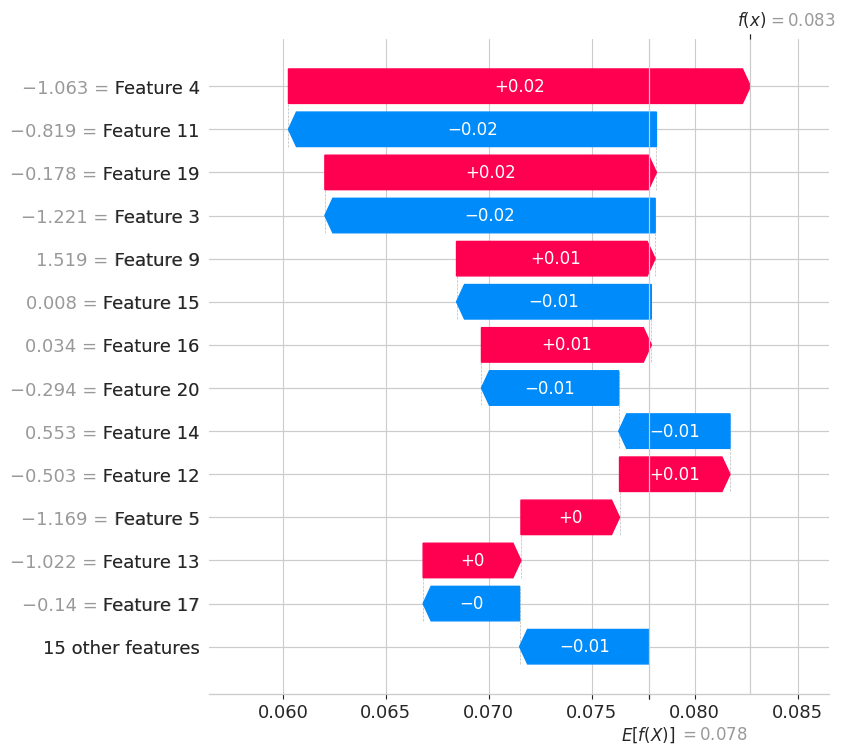


Waterfall plot for target: up.Meth.CG.100_200


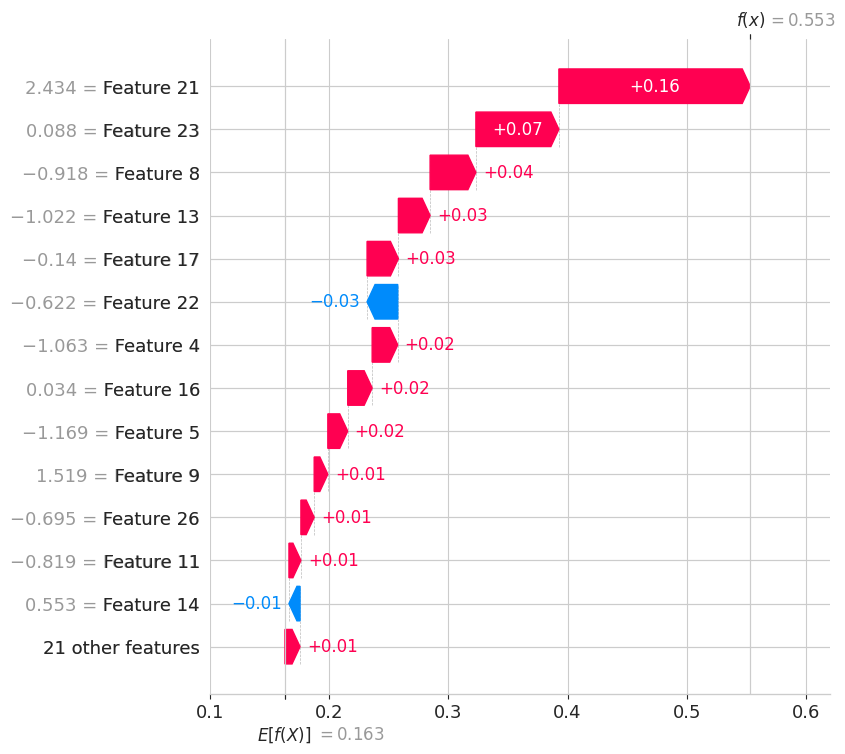


Waterfall plot for target: up.Meth.CHG.100_200


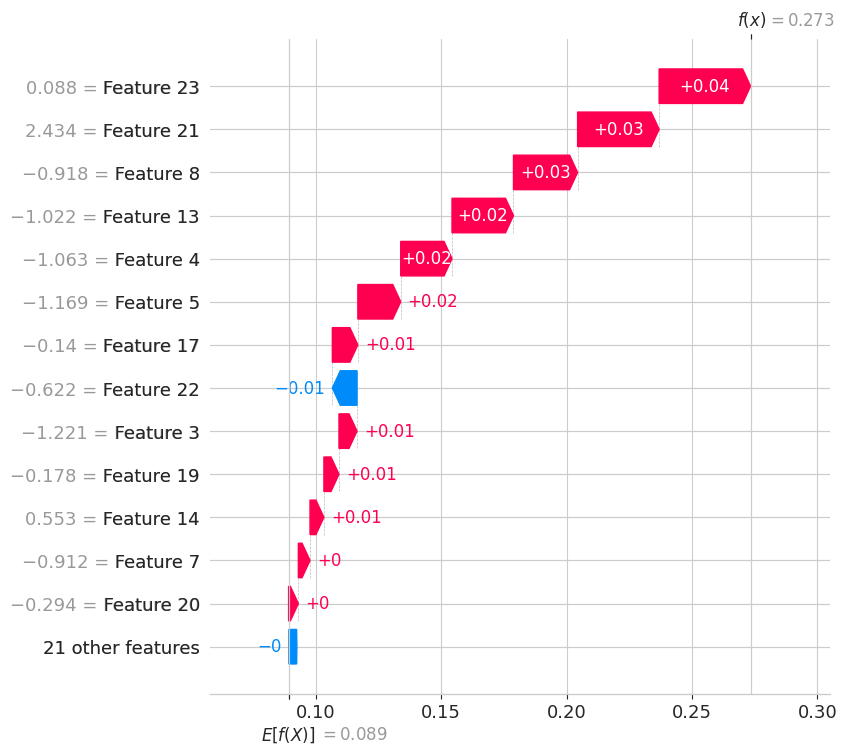


Waterfall plot for target: up.Meth.CHH.100_200


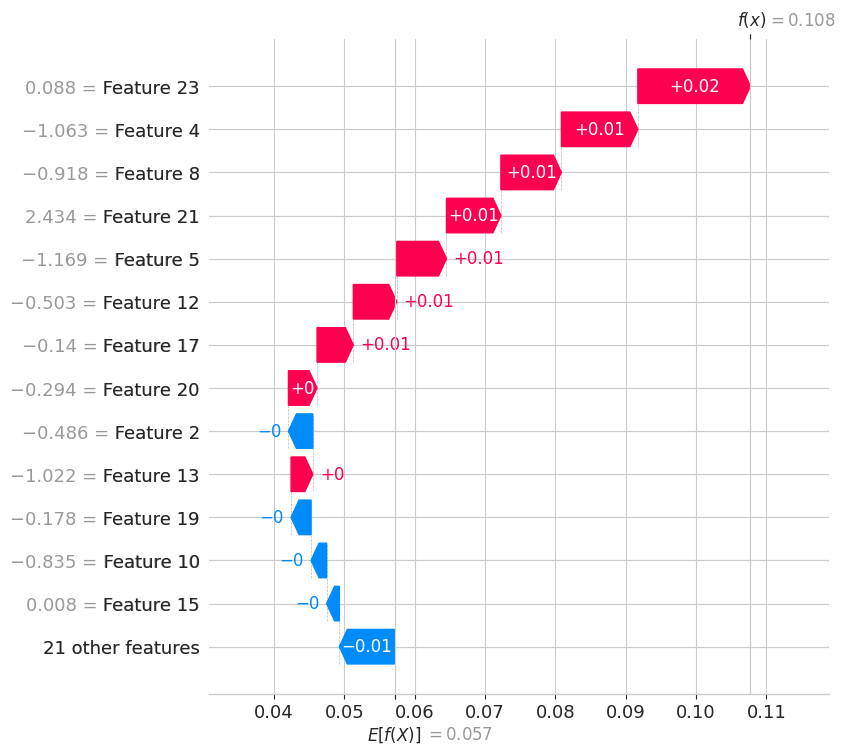


Waterfall plot for target: down.Meth.CG.100_200


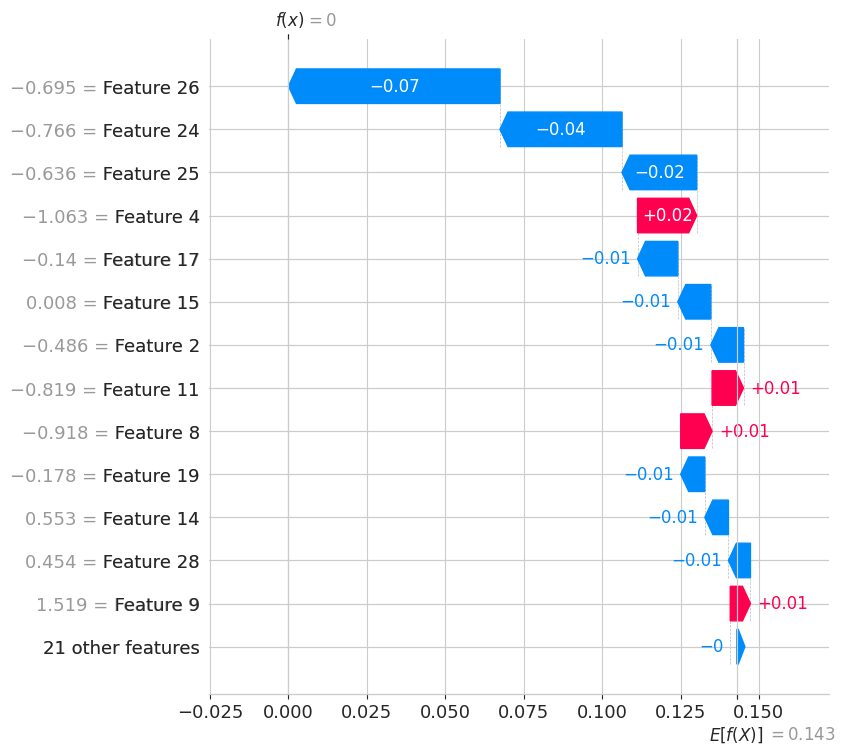


Waterfall plot for target: down.Meth.CHG.100_200


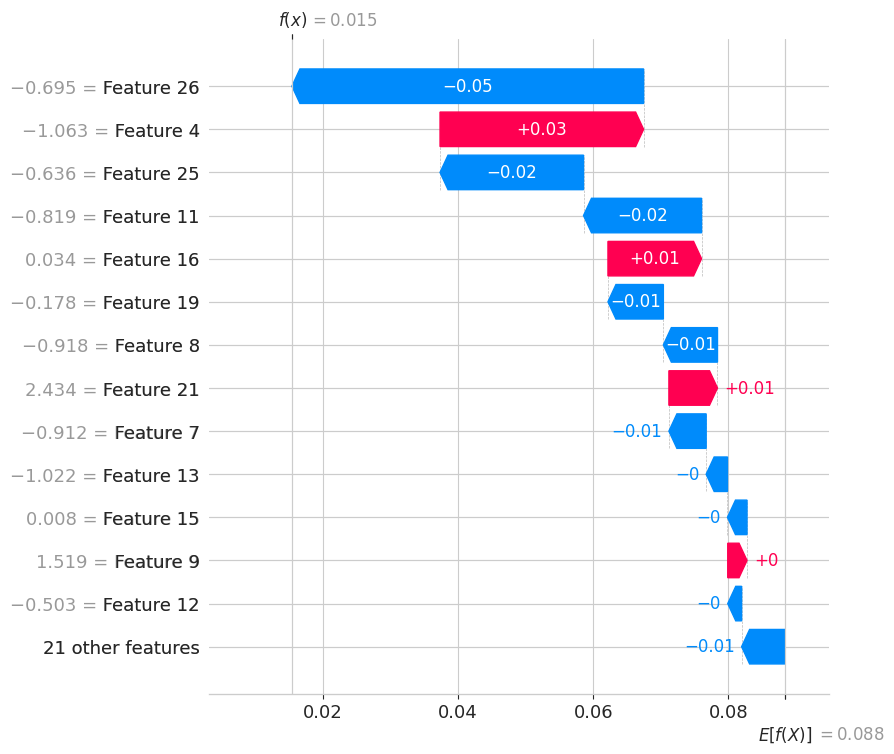


Waterfall plot for target: down.Meth.CHH.100_200


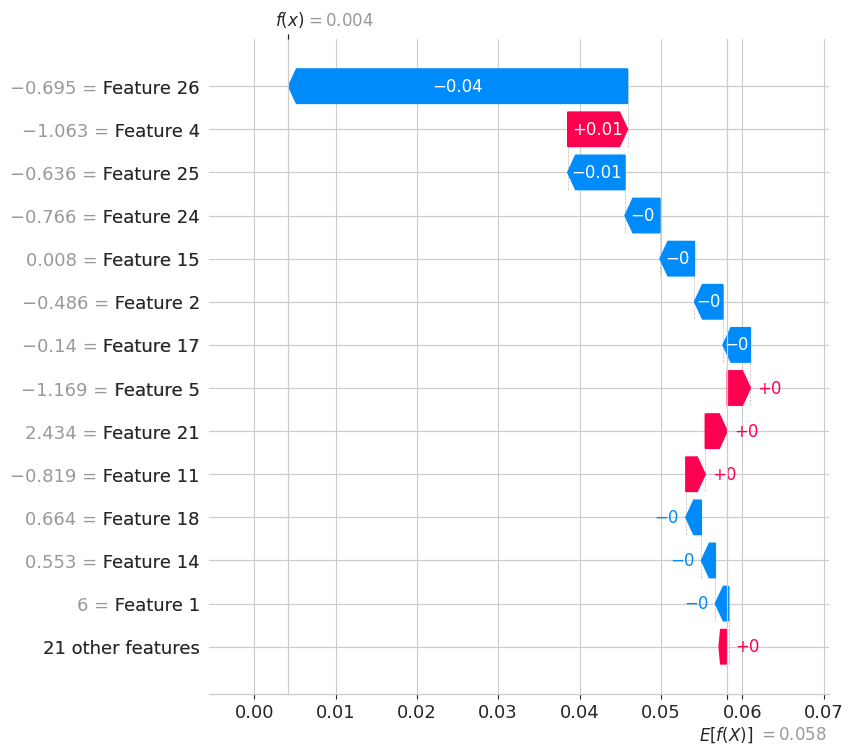


Waterfall plot for target: up.Meth.CG.200_300


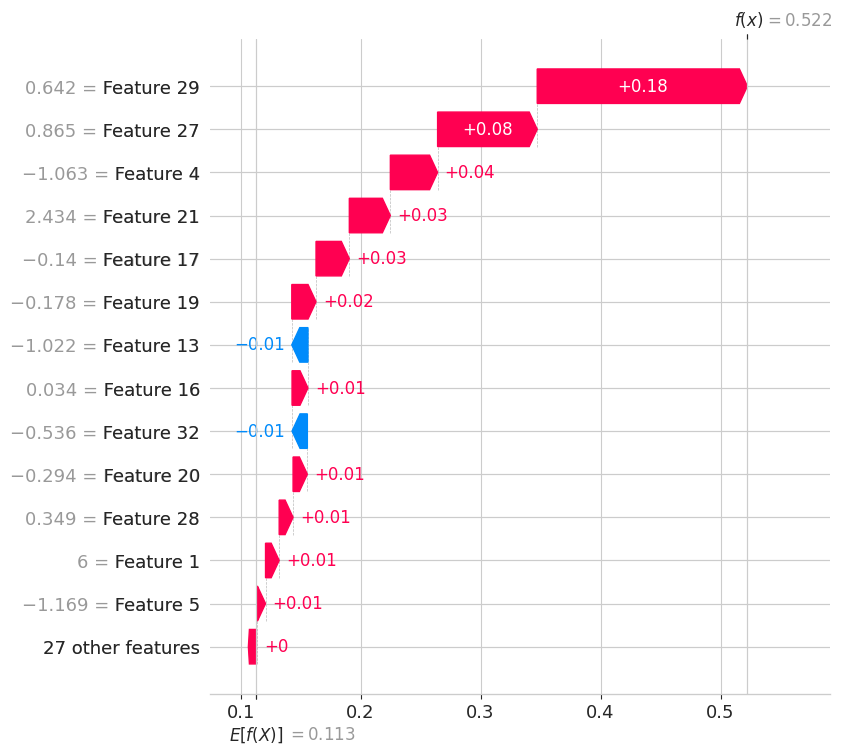


Waterfall plot for target: up.Meth.CHG.200_300


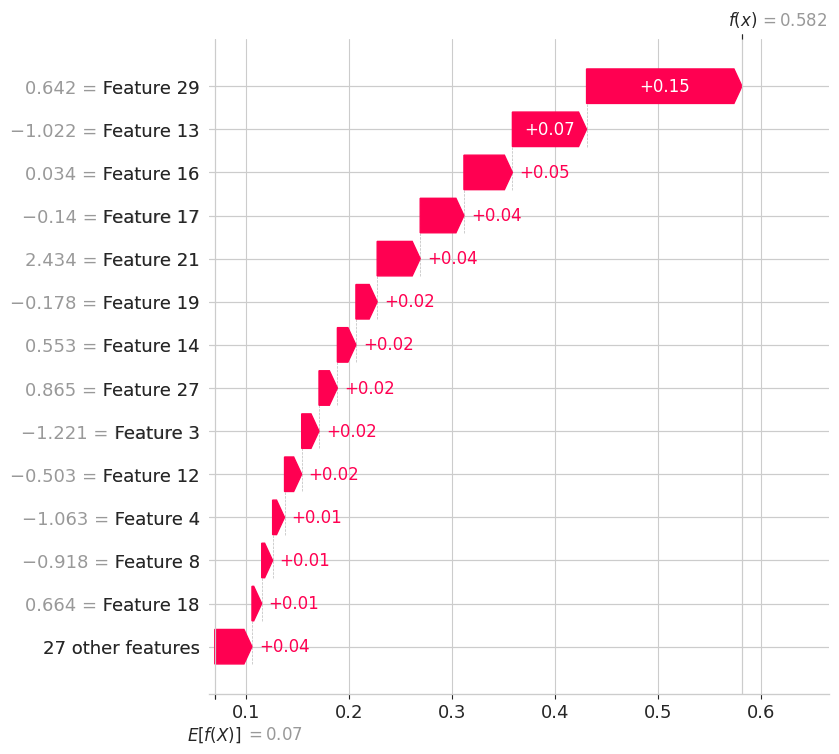


Waterfall plot for target: up.Meth.CHH.200_300


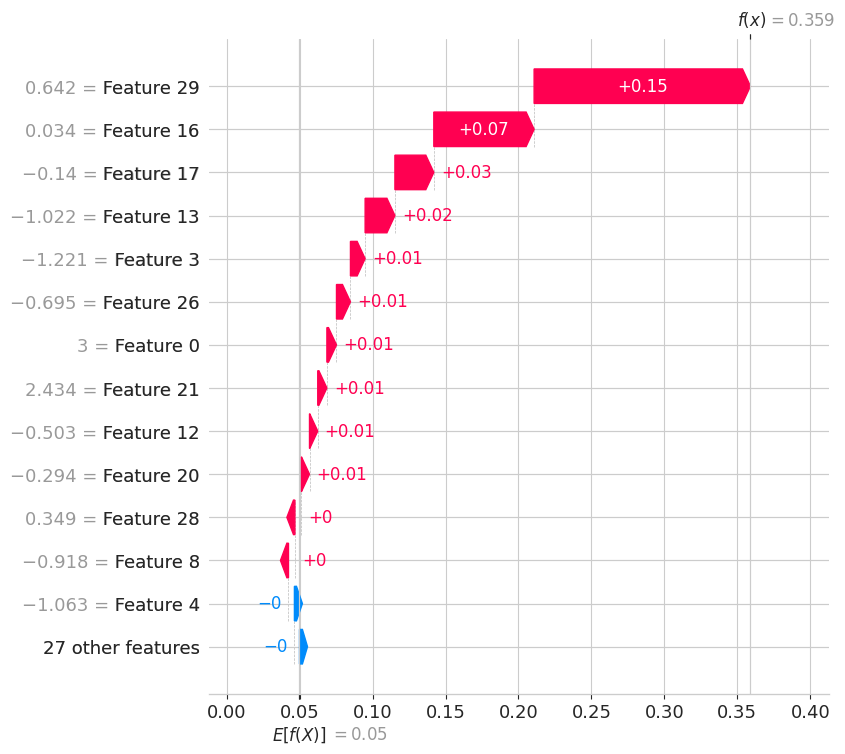


Waterfall plot for target: down.Meth.CG.200_300


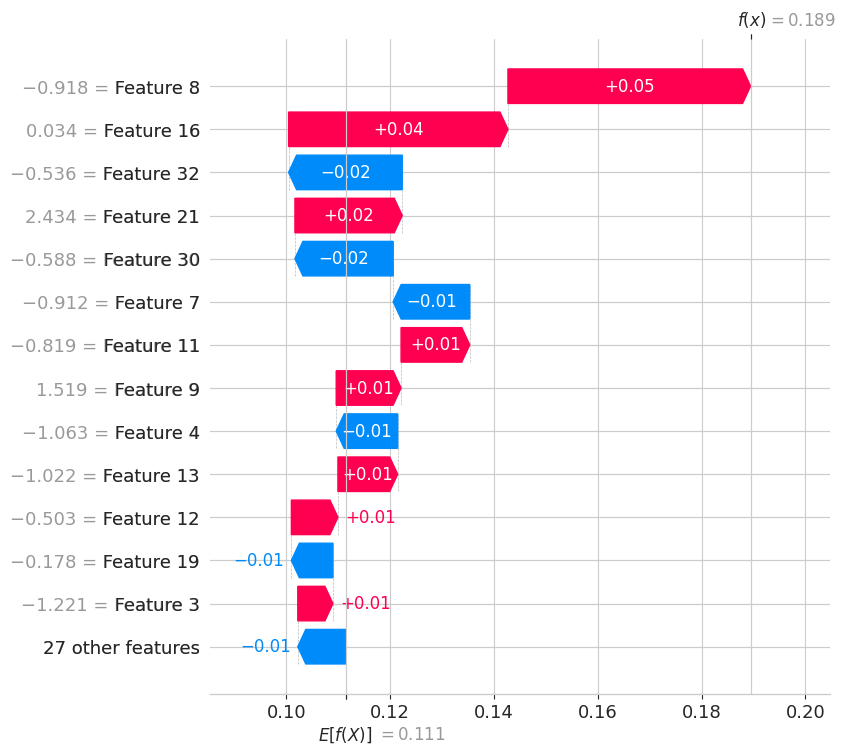


Waterfall plot for target: down.Meth.CHG.200_300


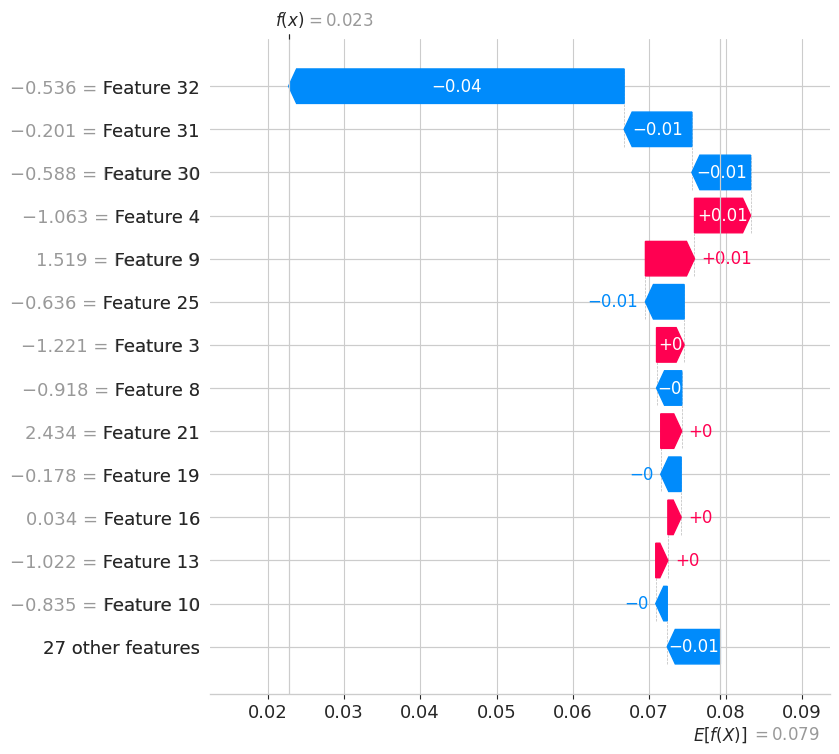


Waterfall plot for target: down.Meth.CHH.200_300


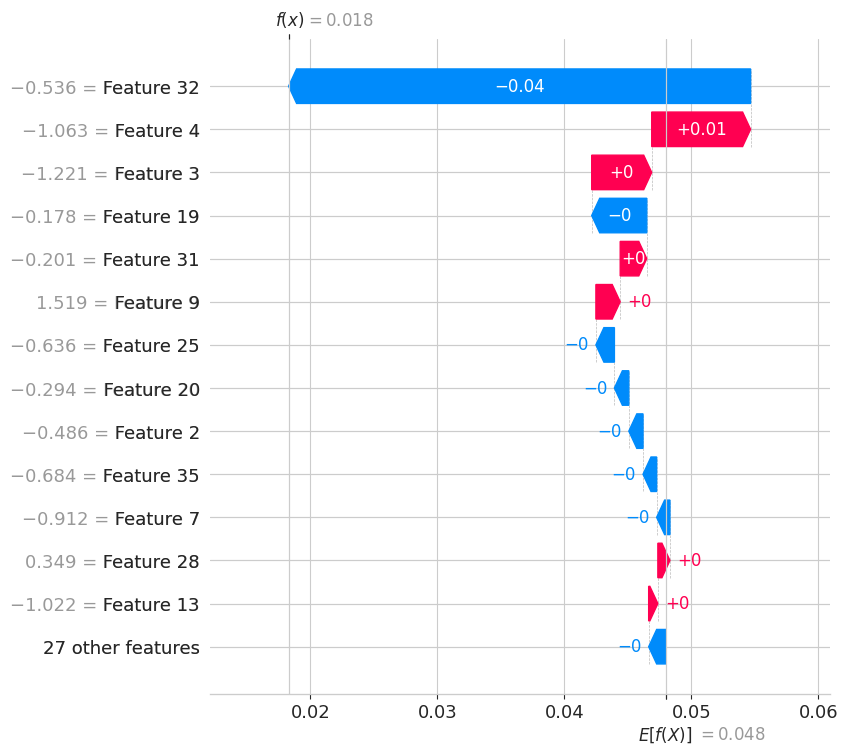

In [46]:

# Waterfall plots: one per target (first sample only)
for target_col in shap_values_dict.keys():
    print(f"\nWaterfall plot for target: {target_col}")
    shap_values = shap_values_dict[target_col]
    shap.plots.waterfall(shap_values[0], max_display=14)  # only the first sample


### Feature correlation with the target methylation (for TE + each three windows)


--- Correlation Analysis for TE window ---


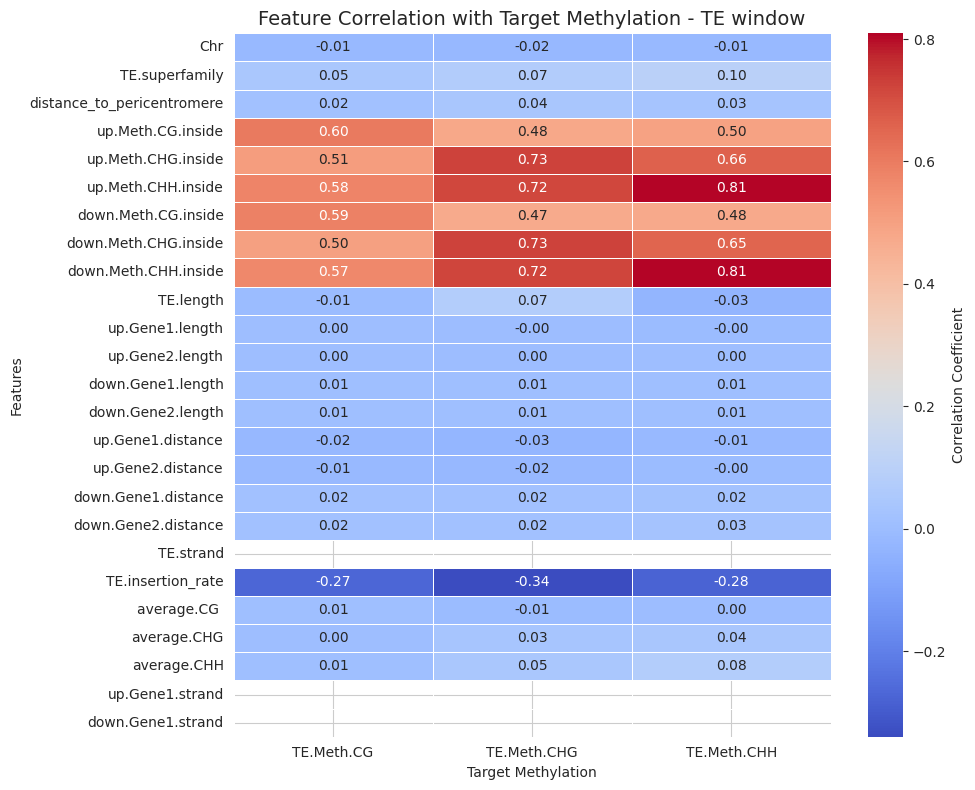


--- Correlation Analysis for 0-100 window ---


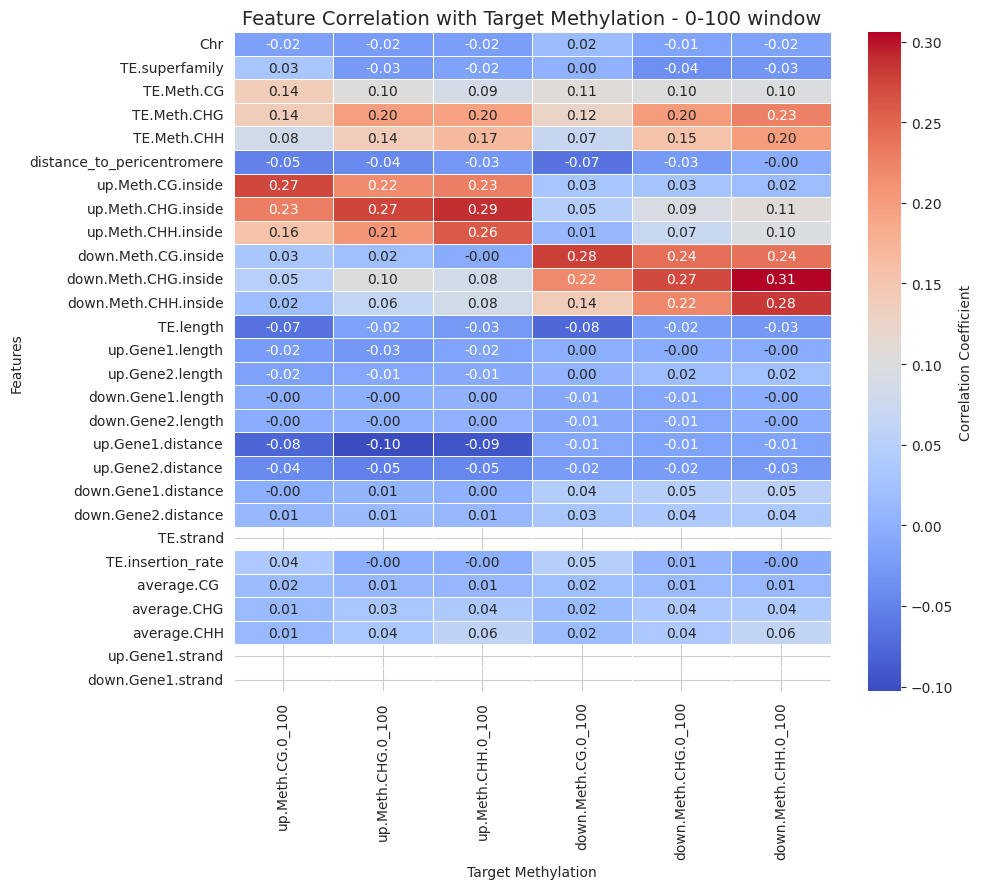


--- Correlation Analysis for 100-200 window ---


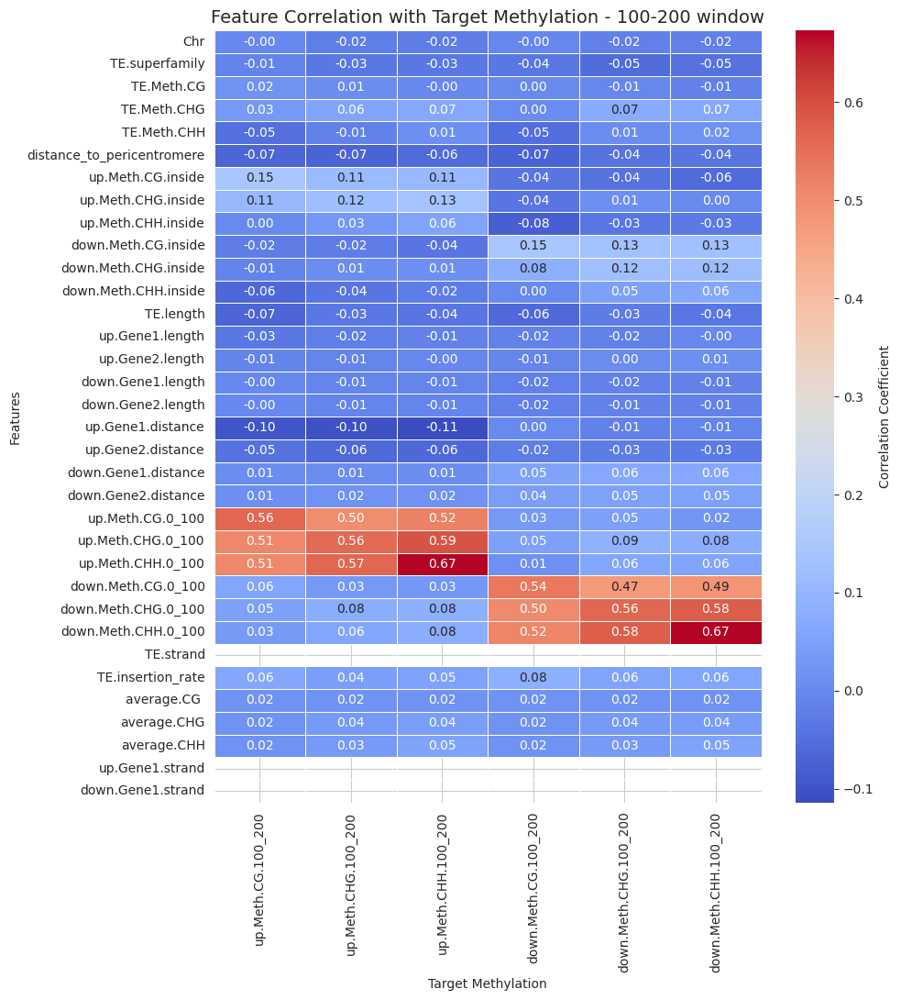


--- Correlation Analysis for 200-300 window ---


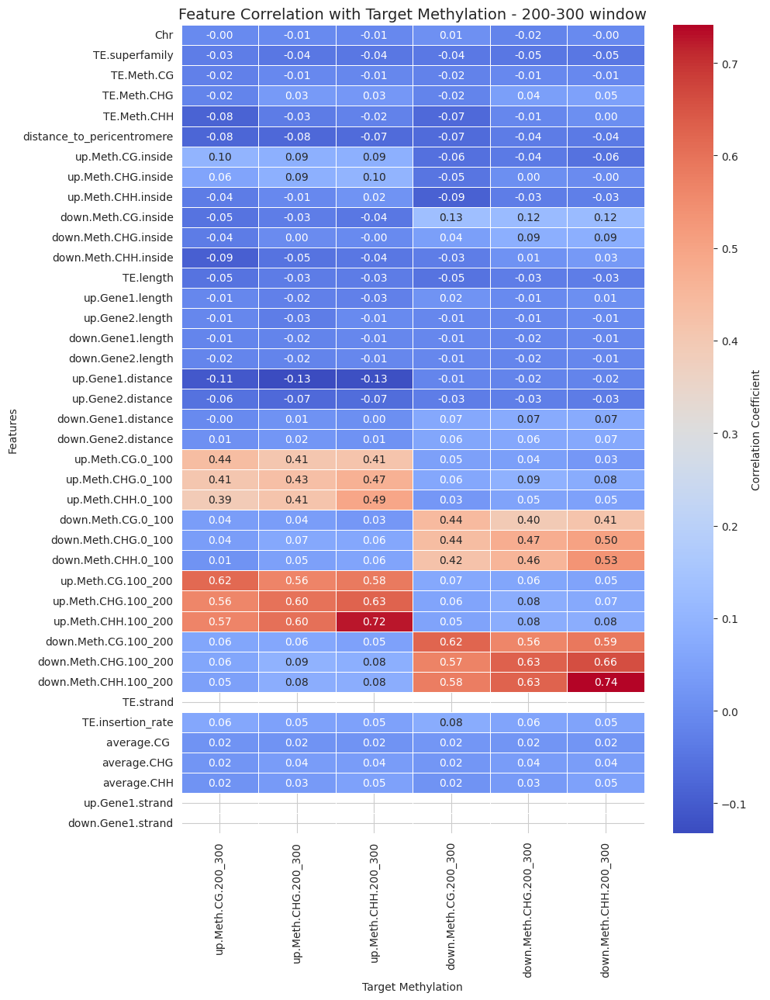

In [47]:
def get_transformed_feature_names(preprocessor):
    feature_names = []
    for name, transformer, cols in preprocessor.transformers_:
        if hasattr(transformer, 'get_feature_names_out'):
            if isinstance(transformer, OrdinalEncoder):
                 feature_names.extend([f'{col}' for col in cols])
            else:
                 feature_names.extend(transformer.get_feature_names_out(cols))
        else:
            feature_names.extend(cols)
    return feature_names
for window_name, target_cols in windows_and_targets:
    print(f"\n--- Correlation Analysis for {window_name} window ---")

    X_window = df_cleaned_new[features_per_window[window_name]].copy()
    y_window = df_cleaned_new[target_cols].copy()

    sample_target_col = target_cols[0]
    if sample_target_col not in models:
        print(f"Skipping {window_name}: No models found for this window.")
        continue

    preprocessor = models[sample_target_col].named_steps['preprocessor']
    X_transformed = preprocessor.transform(X_window)
    transformed_feature_names = get_transformed_feature_names(preprocessor)
    X_transformed_df = pd.DataFrame(X_transformed, columns=transformed_feature_names, index=X_window.index)
    combined_df_window = pd.concat([X_transformed_df, y_window], axis=1)
    correlation_matrix = combined_df_window.corr()
    correlation_with_targets = correlation_matrix.loc[transformed_feature_names, target_cols]
    plt.figure(figsize=(10, max(6, len(transformed_feature_names) // 3)))
    sns.heatmap(
        correlation_with_targets,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        cbar_kws={'label': 'Correlation Coefficient'},
        linewidths=0.5
    )
    plt.title(f'Feature Correlation with Target Methylation - {window_name} window', fontsize=14)
    plt.xlabel('Target Methylation')
    plt.ylabel('Features')
    plt.tight_layout()
    plt.show()

### Correlation of the features (only for the numerical features as they are prevalent)

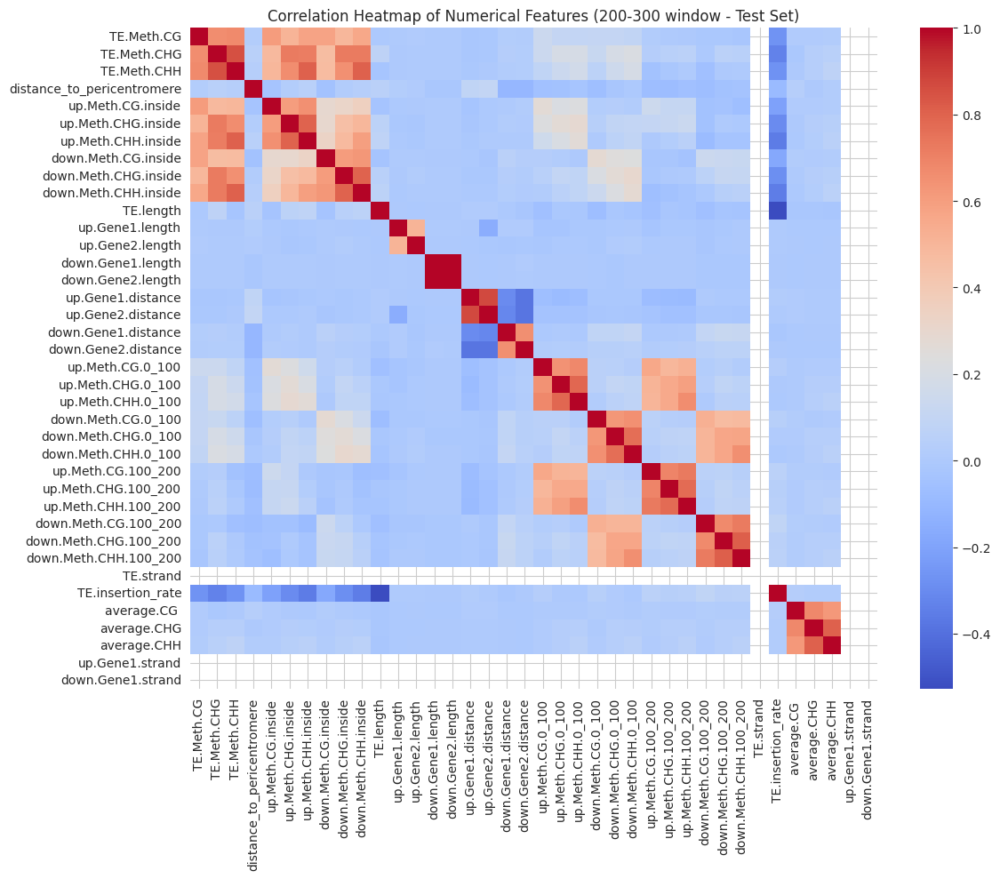

In [48]:
numeric_cols_200_300 = data_test.select_dtypes(include=np.number).columns

correlation_matrix = data_test[numeric_cols_200_300].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap of Numerical Features (200-300 window - Test Set)')
plt.tight_layout()
plt.show()

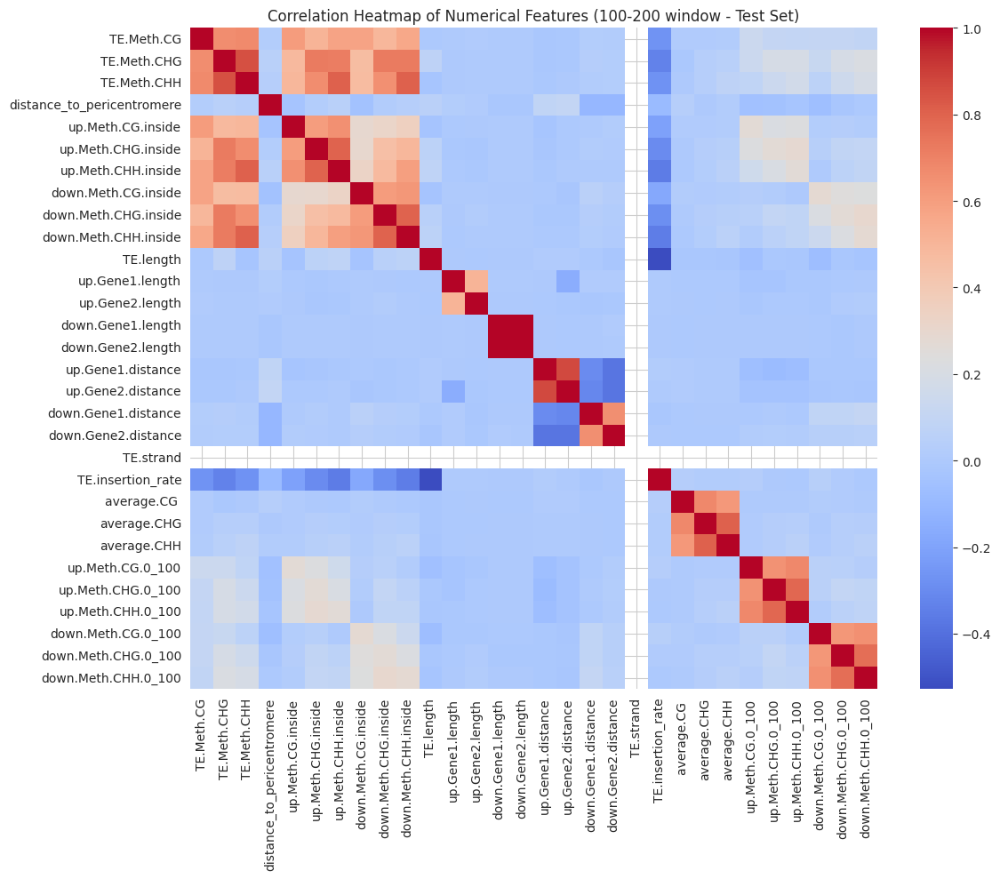

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

target_methylation_columns = [
    'up.Meth.CG.100_200', 'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200',
    'down.Meth.CG.100_200', 'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200'
]

# feature_columns : including methylation features from the TE itself only (and its ends, given by the features marked as "inside")
feature_columns = [
    'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH', 'distance_to_pericentromere',
    'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
    'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
    'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
    'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
    'Chr', 'TE.strand', 'TE.superfamily',"TE.insertion_rate", "average.CG ","average.CHG","average.CHH",
    'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
    'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100'
]

all_relevant_columns = feature_columns + target_methylation_columns
missing_columns = [col for col in all_relevant_columns if col not in df_cleaned_new.columns]

if missing_columns:
    print(f"Error: Missing columns in DataFrame: {missing_columns}")
else:

    X = df_cleaned_new[feature_columns]
    y = df_cleaned_new[target_methylation_columns]

    numeric_cols_for_model = X.select_dtypes(include=np.number).columns.tolist()
    categorical_cols_for_model = X.select_dtypes(exclude=np.number).columns.tolist()

    data_train, data_test, target_train, target_test = train_test_split(X, y, test_size=0.2, random_state=42)

    preprocessor = ColumnTransformer(
        transformers=[
            #('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols_for_model),
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_cols_for_model),
            ('num', StandardScaler(), numeric_cols_for_model)
        ],
        remainder='passthrough'
    )

    models = {}
    evaluation_results = {}

    for target_col in target_methylation_columns:
        model= Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('regressor', RandomForestRegressor(n_estimators=5, random_state=42, n_jobs=-1))
        ])

        start_time = time.time()
        model.fit(data_train, target_train[target_col])
        train_time = time.time() - start_time

        start_time = time.time()
        predictions = model.predict(data_test)
        prediction_time = time.time() - start_time

        mae = mean_absolute_error(target_test[target_col], predictions)
        mse = mean_squared_error(target_test[target_col], predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(target_test[target_col], predictions)

        evaluation_results[target_col] = {
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2
        }

        models[target_col] = model
numeric_cols_100_200 = data_test.select_dtypes(include=np.number).columns

correlation_matrix = data_test[numeric_cols_100_200].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap of Numerical Features (100-200 window - Test Set)')
plt.tight_layout()
plt.show()


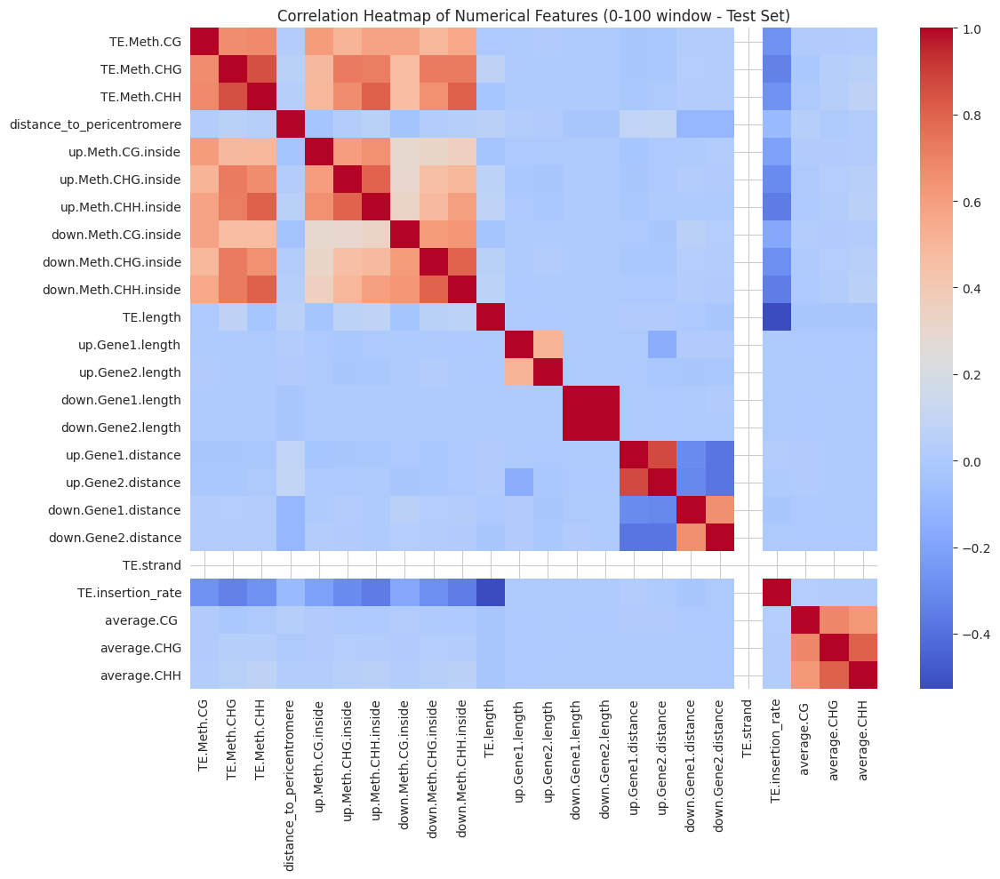

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

target_methylation_columns = [
    'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
    'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100'
]

# feature_columns : including methylation features from the TE itself only (and its ends, given by the features marked as "inside")
feature_columns = [
    'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH', 'distance_to_pericentromere',
    'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
    'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
    'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
    'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
    'Chr', 'TE.strand', 'TE.superfamily',"TE.insertion_rate", "average.CG ","average.CHG","average.CHH"
]

all_relevant_columns = feature_columns + target_methylation_columns
missing_columns = [col for col in all_relevant_columns if col not in df_cleaned_new.columns]

if missing_columns:
    print(f"Error: Missing columns in DataFrame: {missing_columns}")
else:

    X = df_cleaned_new[feature_columns]
    y = df_cleaned_new[target_methylation_columns]

    numeric_cols_for_model = X.select_dtypes(include=np.number).columns.tolist()
    categorical_cols_for_model = X.select_dtypes(exclude=np.number).columns.tolist()

    data_train, data_test, target_train, target_test = train_test_split(X, y, test_size=0.2, random_state=42)

    preprocessor = ColumnTransformer(
        transformers=[
            #('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols_for_model),
            ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_cols_for_model),
            ('num', StandardScaler(), numeric_cols_for_model)
        ],
        remainder='passthrough'
    )

    models = {}
    evaluation_results = {}

    for target_col in target_methylation_columns:

        model= Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('regressor', RandomForestRegressor(n_estimators=10, random_state=42, n_jobs=-1))
        ])

        start_time = time.time()
        model.fit(data_train, target_train[target_col])
        train_time = time.time() - start_time

        start_time = time.time()
        predictions = model.predict(data_test)
        prediction_time = time.time() - start_time

        mae = mean_absolute_error(target_test[target_col], predictions)
        mse = mean_squared_error(target_test[target_col], predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(target_test[target_col], predictions)

        evaluation_results[target_col] = {
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2
        }
        models[target_col] = model

numeric_cols_0_100 = data_test.select_dtypes(include=np.number).columns

correlation_matrix = data_test[numeric_cols_0_100].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap of Numerical Features (0-100 window - Test Set)')
plt.tight_layout()
plt.show()

# Classification method using random forest Classifier + 50 trees


=== Classification for TE window ===

→ Training classifier for target: TE.Meth.CG (threshold 0.05)
  Training time: 17.34 s
  Prediction time: 0.15 s
  Accuracy: 0.9904
              precision    recall  f1-score   support

         Low       0.88      0.32      0.47       423
        High       0.99      1.00      1.00     31397

    accuracy                           0.99     31820
   macro avg       0.94      0.66      0.73     31820
weighted avg       0.99      0.99      0.99     31820



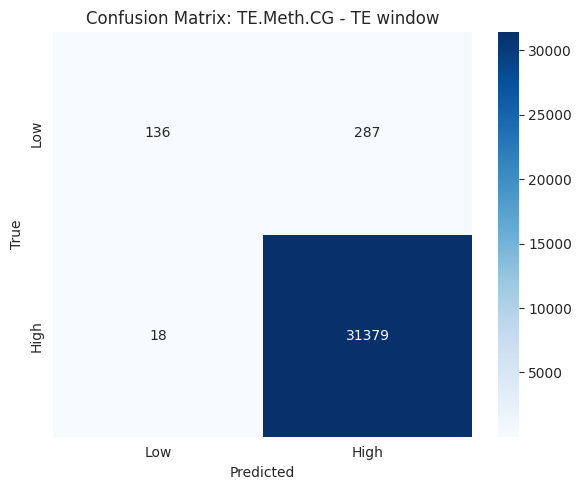

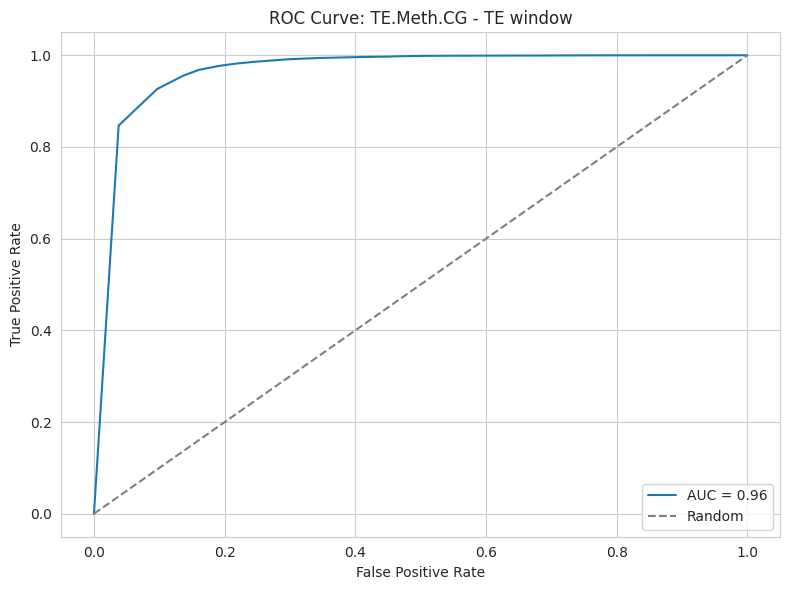

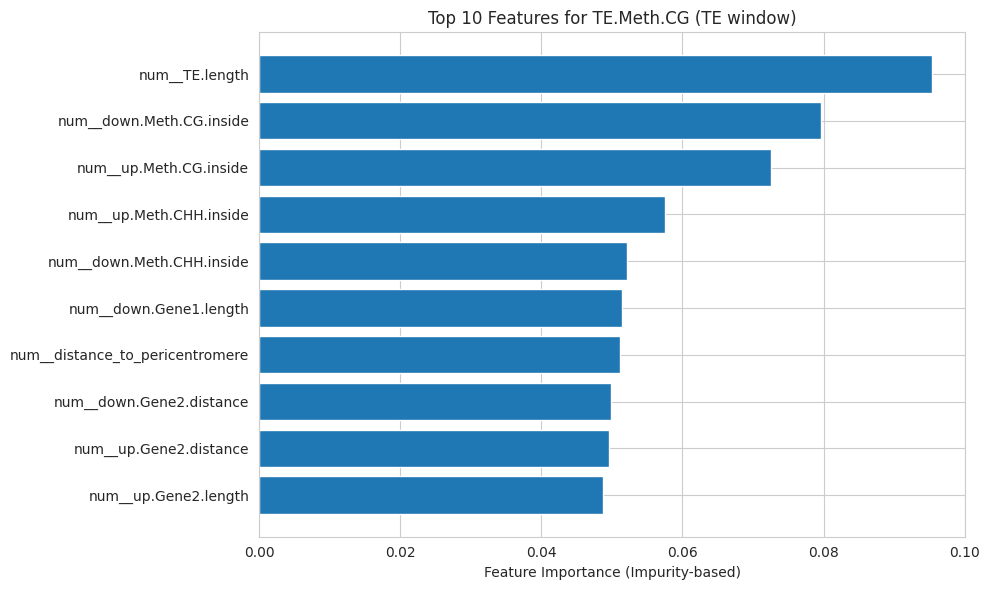


→ Training classifier for target: TE.Meth.CHG (threshold 0.05)
  Training time: 22.65 s
  Prediction time: 0.41 s
  Accuracy: 0.9440
              precision    recall  f1-score   support

         Low       0.84      0.76      0.80      4633
        High       0.96      0.98      0.97     27187

    accuracy                           0.94     31820
   macro avg       0.90      0.87      0.88     31820
weighted avg       0.94      0.94      0.94     31820



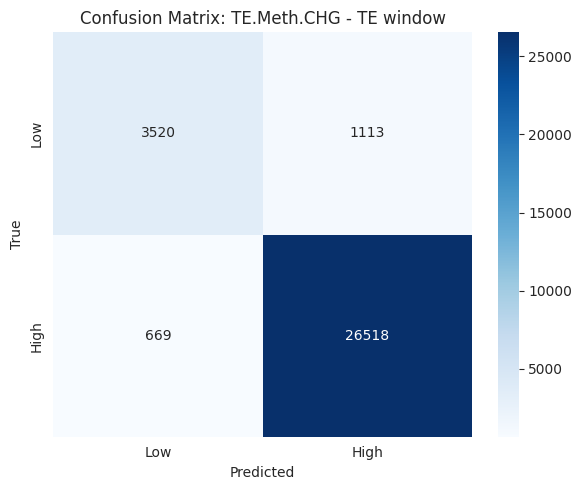

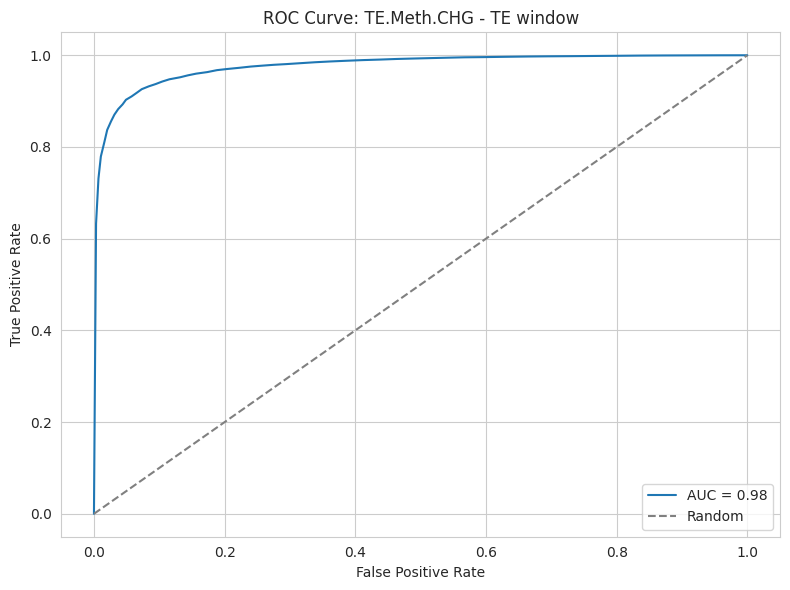

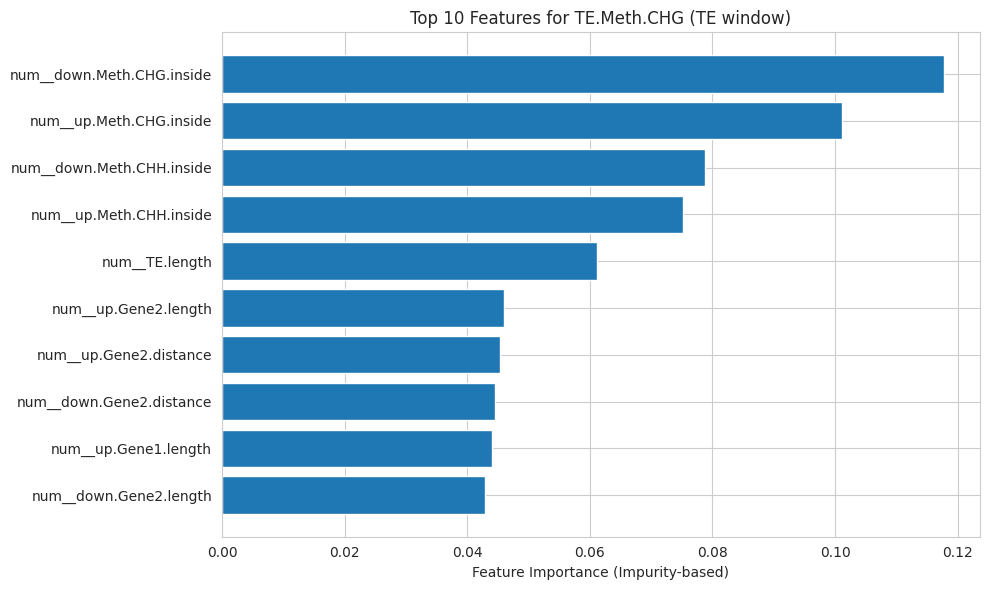


→ Training classifier for target: TE.Meth.CHH (threshold 0.05)
  Training time: 22.95 s
  Prediction time: 0.24 s
  Accuracy: 0.9502
              precision    recall  f1-score   support

         Low       0.89      0.87      0.88      6649
        High       0.97      0.97      0.97     25171

    accuracy                           0.95     31820
   macro avg       0.93      0.92      0.92     31820
weighted avg       0.95      0.95      0.95     31820



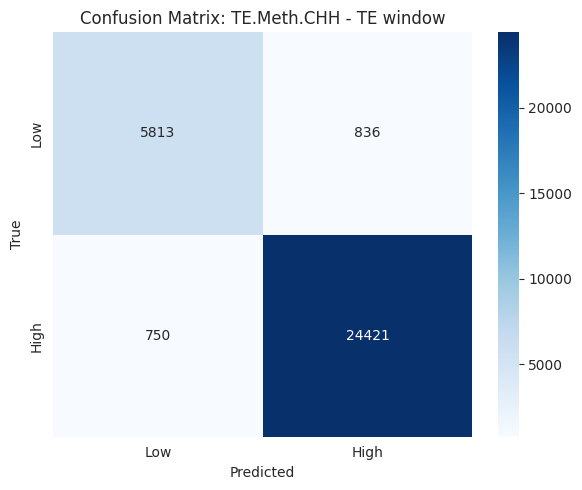

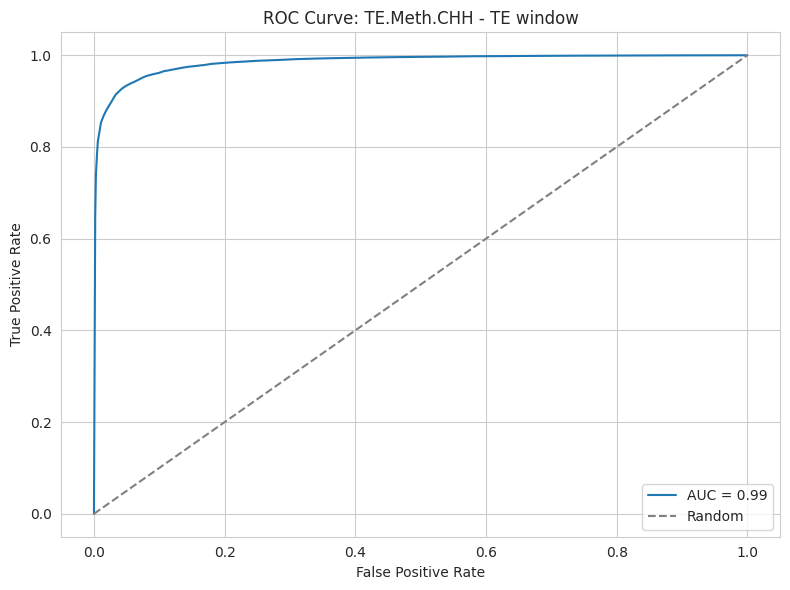

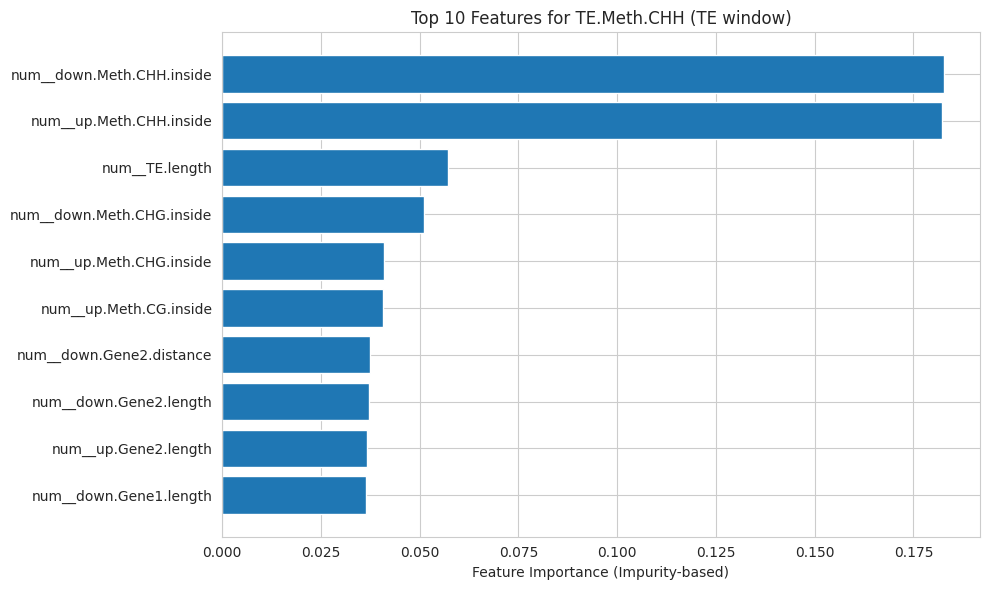


=== Classification for 0-100 window ===

→ Training classifier for target: up.Meth.CG.0_100 (threshold 0.05)
  Training time: 42.95 s
  Prediction time: 0.44 s
  Accuracy: 0.8861
              precision    recall  f1-score   support

         Low       0.89      0.90      0.89     16923
        High       0.88      0.87      0.88     14897

    accuracy                           0.89     31820
   macro avg       0.89      0.89      0.89     31820
weighted avg       0.89      0.89      0.89     31820



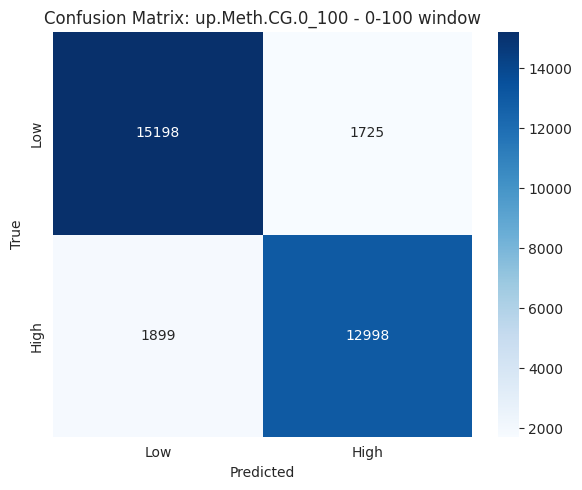

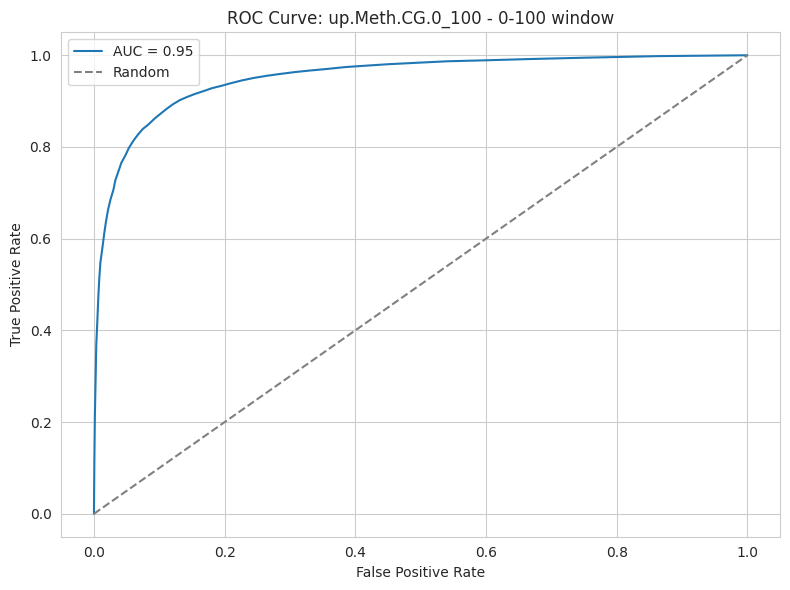

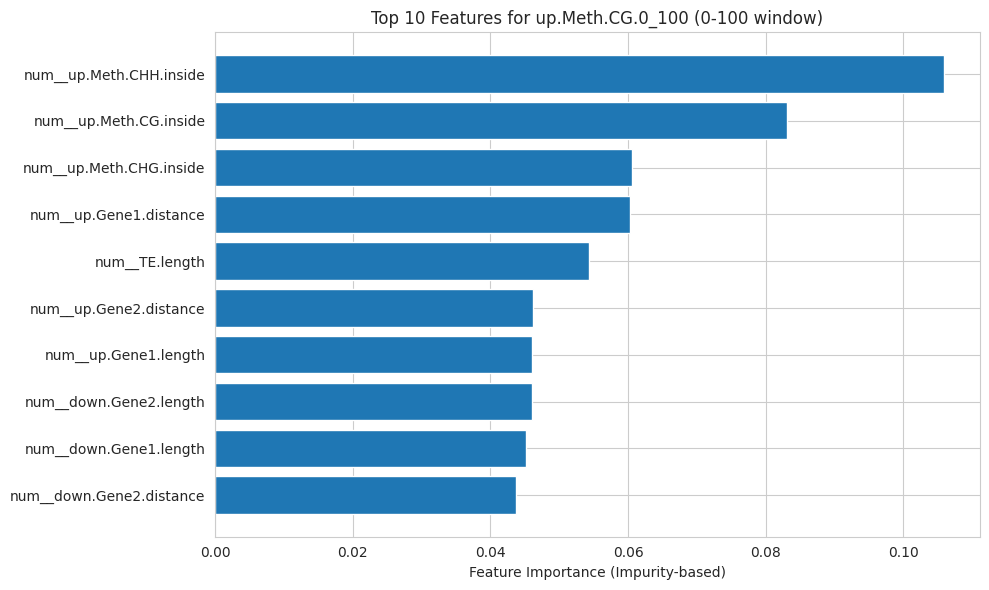


→ Training classifier for target: up.Meth.CHG.0_100 (threshold 0.05)
  Training time: 47.35 s
  Prediction time: 0.43 s
  Accuracy: 0.8866
              precision    recall  f1-score   support

         Low       0.90      0.92      0.91     19358
        High       0.87      0.83      0.85     12462

    accuracy                           0.89     31820
   macro avg       0.88      0.88      0.88     31820
weighted avg       0.89      0.89      0.89     31820



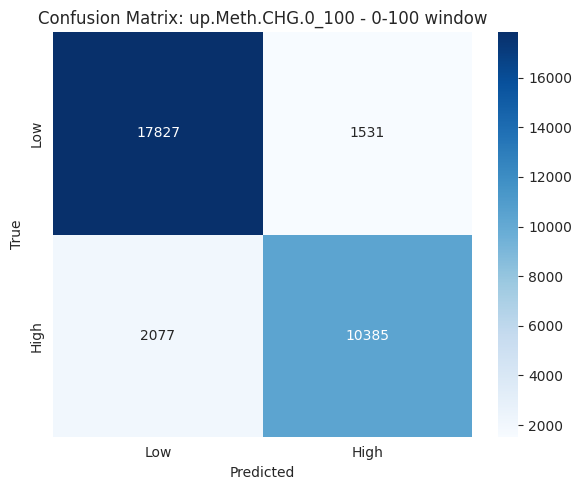

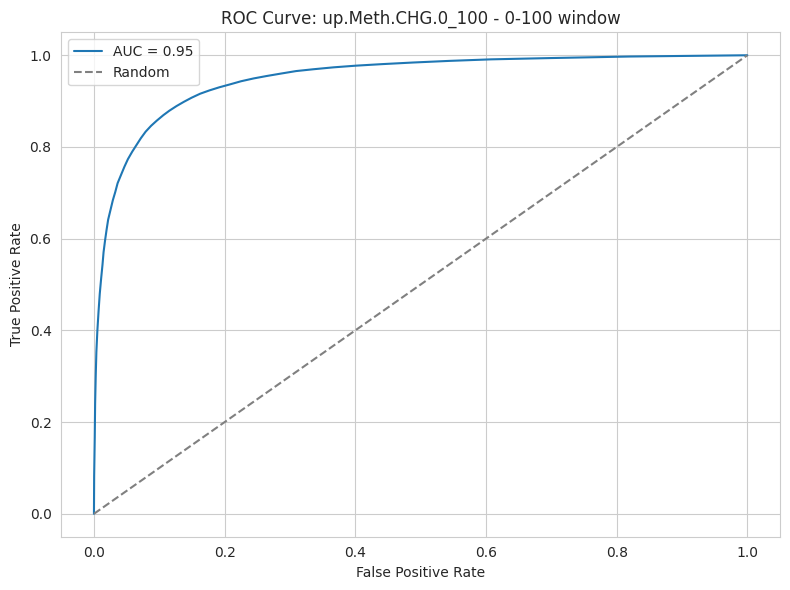

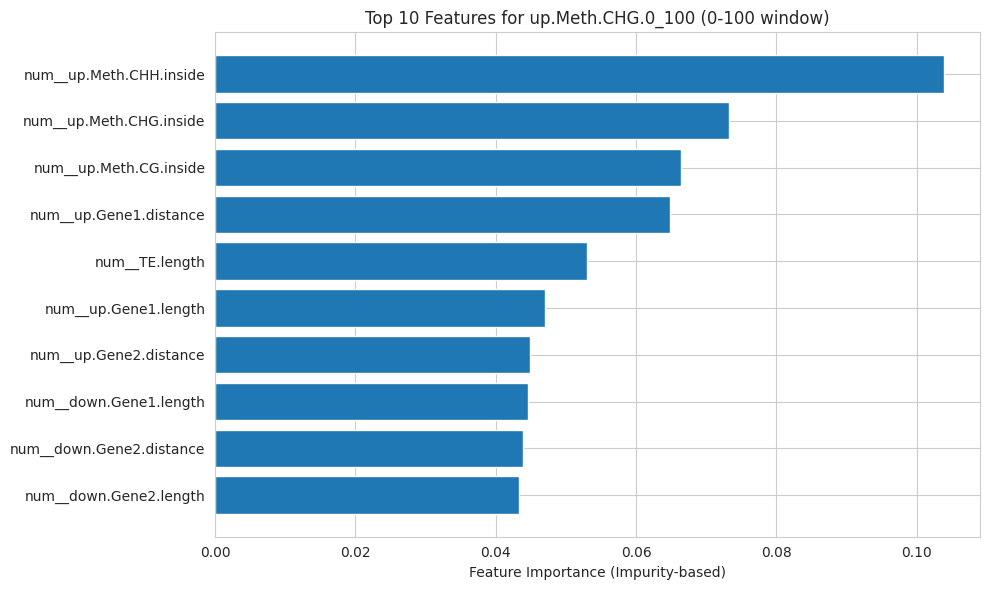


→ Training classifier for target: up.Meth.CHH.0_100 (threshold 0.05)
  Training time: 42.33 s
  Prediction time: 0.37 s
  Accuracy: 0.8989
              precision    recall  f1-score   support

         Low       0.91      0.92      0.91     18420
        High       0.89      0.87      0.88     13400

    accuracy                           0.90     31820
   macro avg       0.90      0.90      0.90     31820
weighted avg       0.90      0.90      0.90     31820



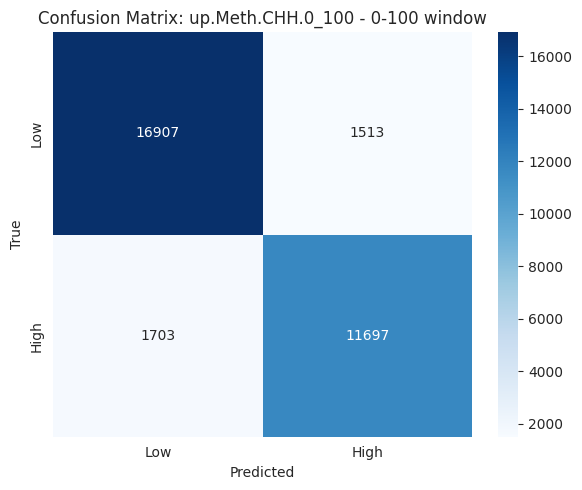

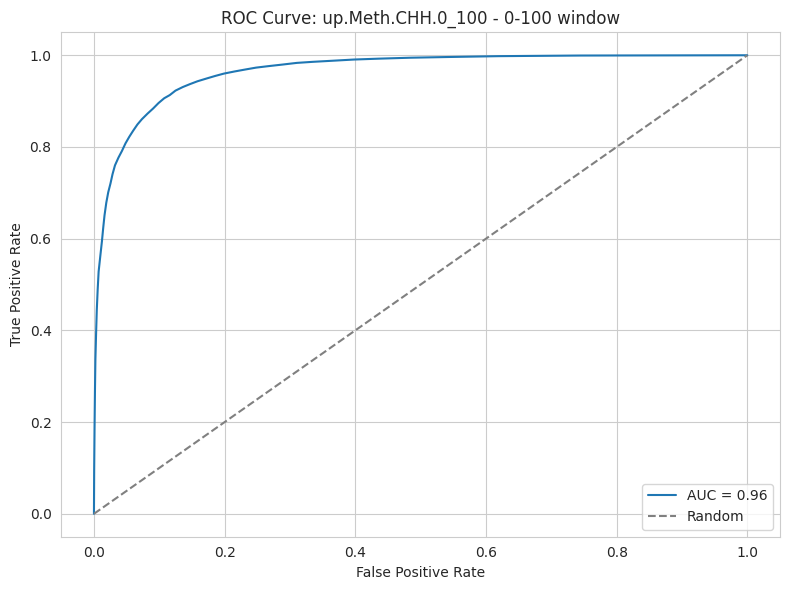

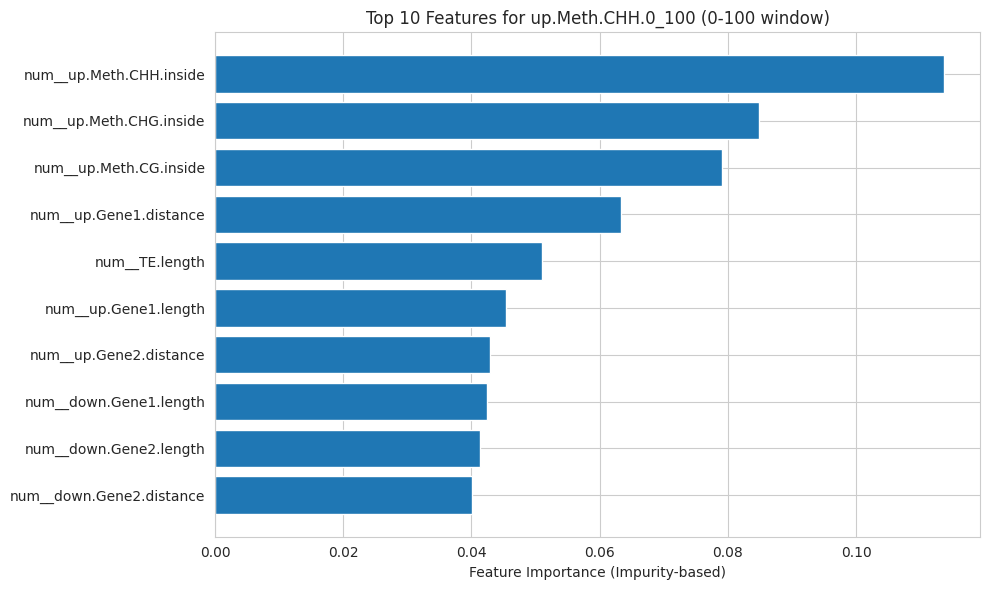


→ Training classifier for target: down.Meth.CG.0_100 (threshold 0.05)
  Training time: 43.47 s
  Prediction time: 0.44 s
  Accuracy: 0.8858
              precision    recall  f1-score   support

         Low       0.88      0.90      0.89     16311
        High       0.89      0.87      0.88     15509

    accuracy                           0.89     31820
   macro avg       0.89      0.89      0.89     31820
weighted avg       0.89      0.89      0.89     31820



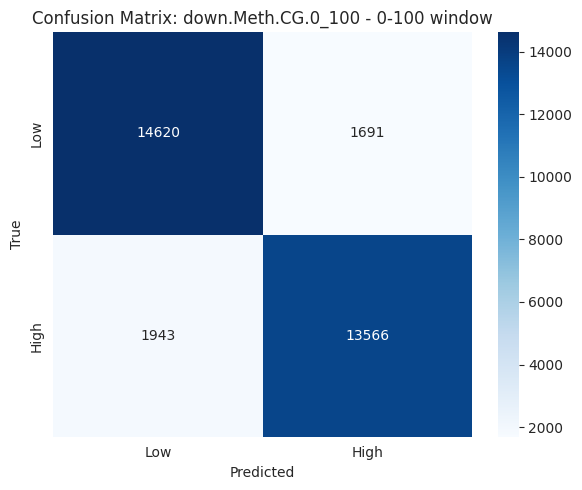

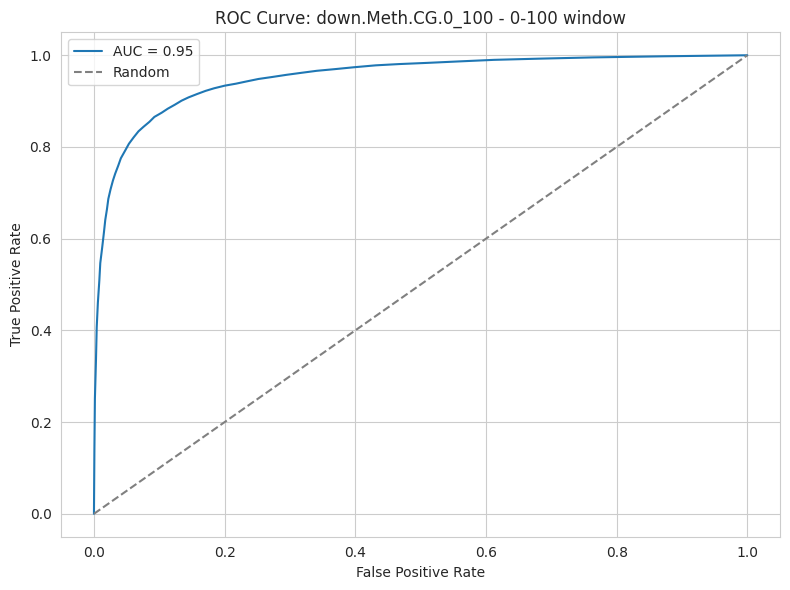

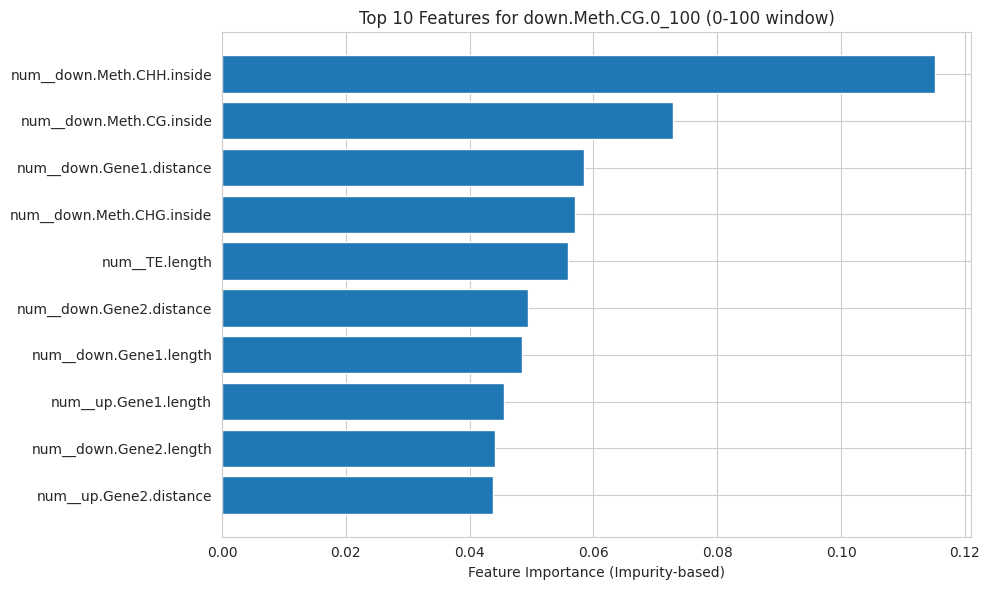


→ Training classifier for target: down.Meth.CHG.0_100 (threshold 0.05)
  Training time: 42.75 s
  Prediction time: 0.67 s
  Accuracy: 0.8811
              precision    recall  f1-score   support

         Low       0.89      0.91      0.90     18855
        High       0.87      0.84      0.85     12965

    accuracy                           0.88     31820
   macro avg       0.88      0.87      0.88     31820
weighted avg       0.88      0.88      0.88     31820



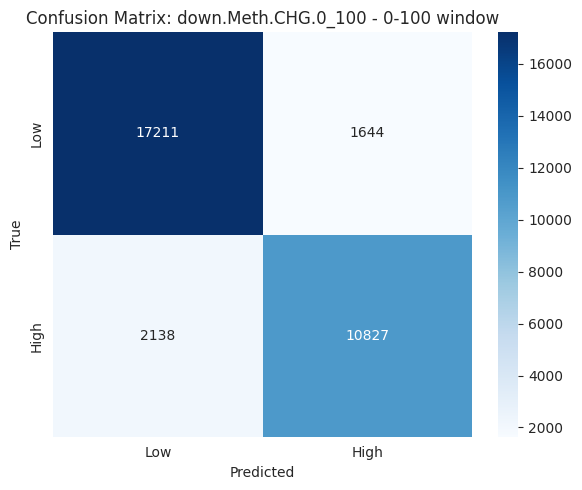

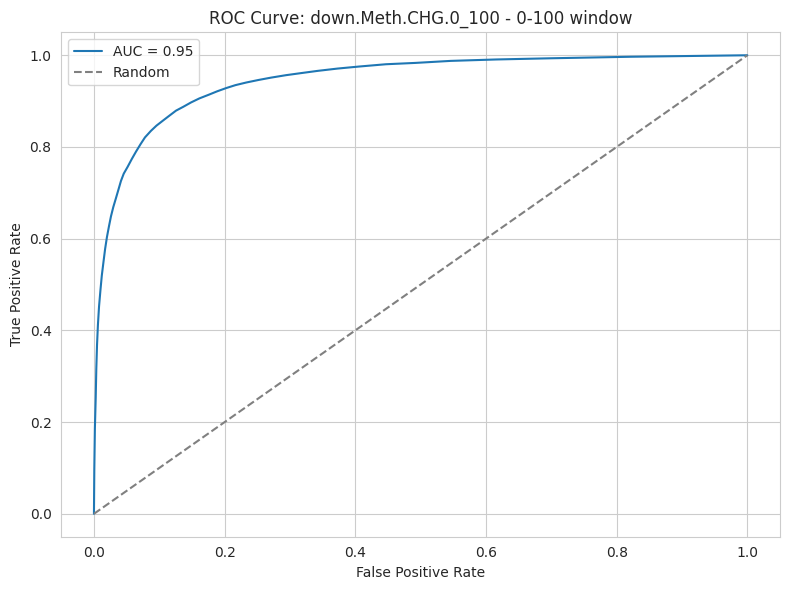

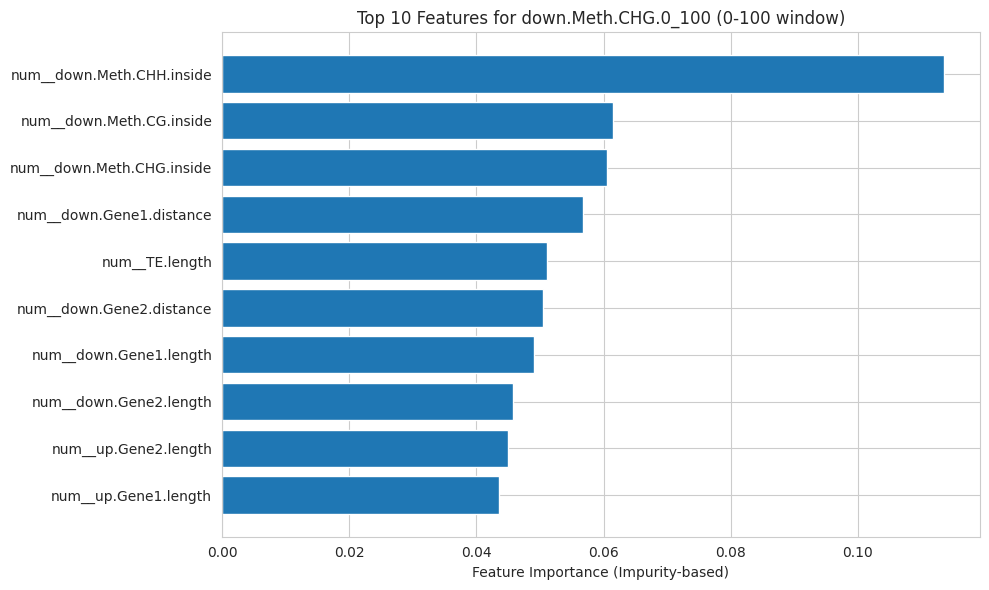


→ Training classifier for target: down.Meth.CHH.0_100 (threshold 0.05)
  Training time: 42.22 s
  Prediction time: 0.66 s
  Accuracy: 0.9047
              precision    recall  f1-score   support

         Low       0.92      0.91      0.91     17748
        High       0.89      0.89      0.89     14072

    accuracy                           0.90     31820
   macro avg       0.90      0.90      0.90     31820
weighted avg       0.90      0.90      0.90     31820



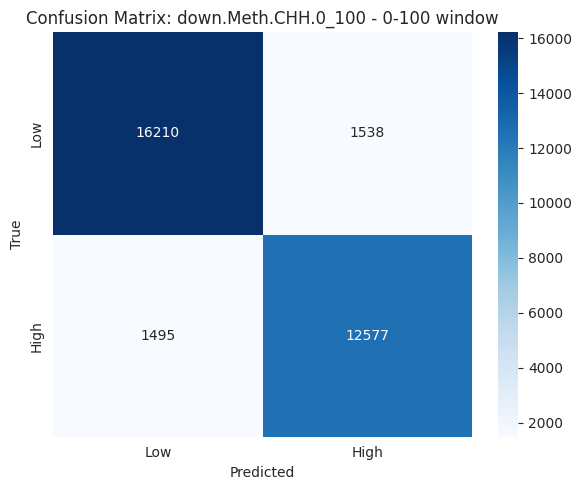

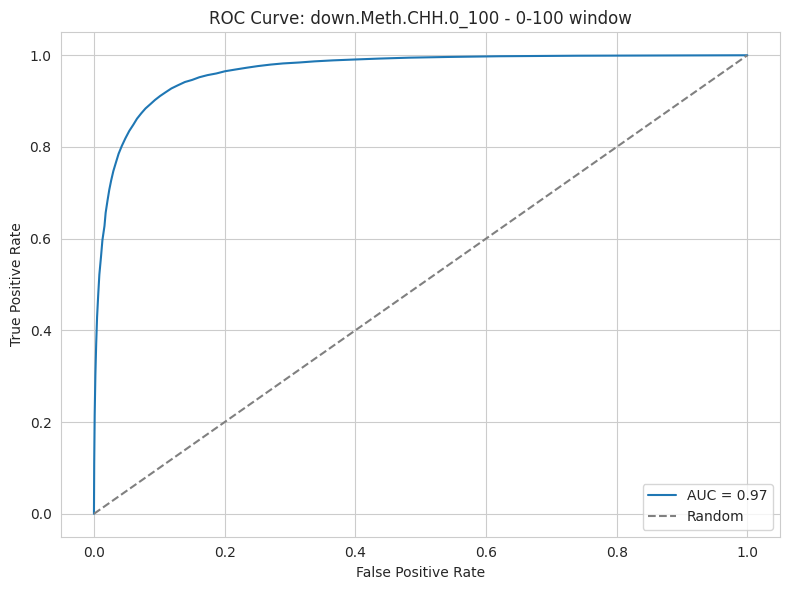

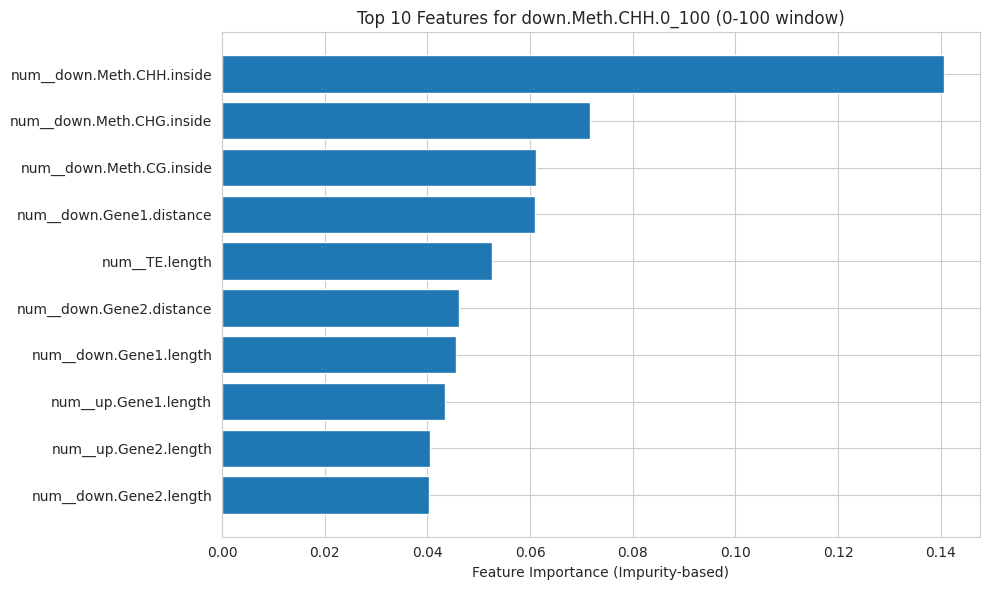


=== Classification for 100-200 window ===

→ Training classifier for target: up.Meth.CG.100_200 (threshold 0.05)
  Training time: 46.15 s
  Prediction time: 0.36 s
  Accuracy: 0.9154
              precision    recall  f1-score   support

         Low       0.92      0.96      0.94     22045
        High       0.91      0.81      0.85      9775

    accuracy                           0.92     31820
   macro avg       0.91      0.88      0.90     31820
weighted avg       0.92      0.92      0.91     31820



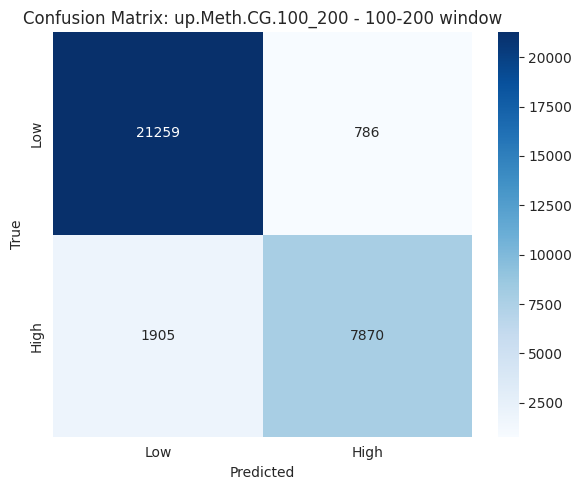

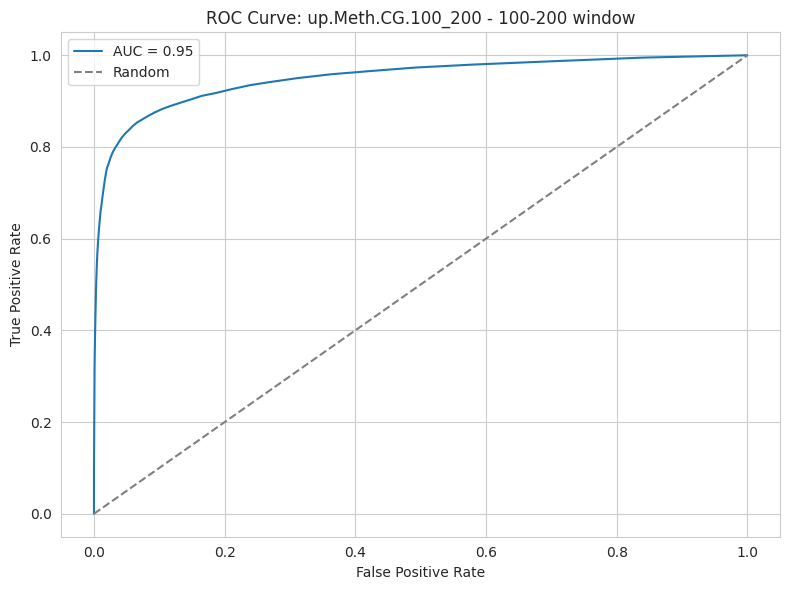

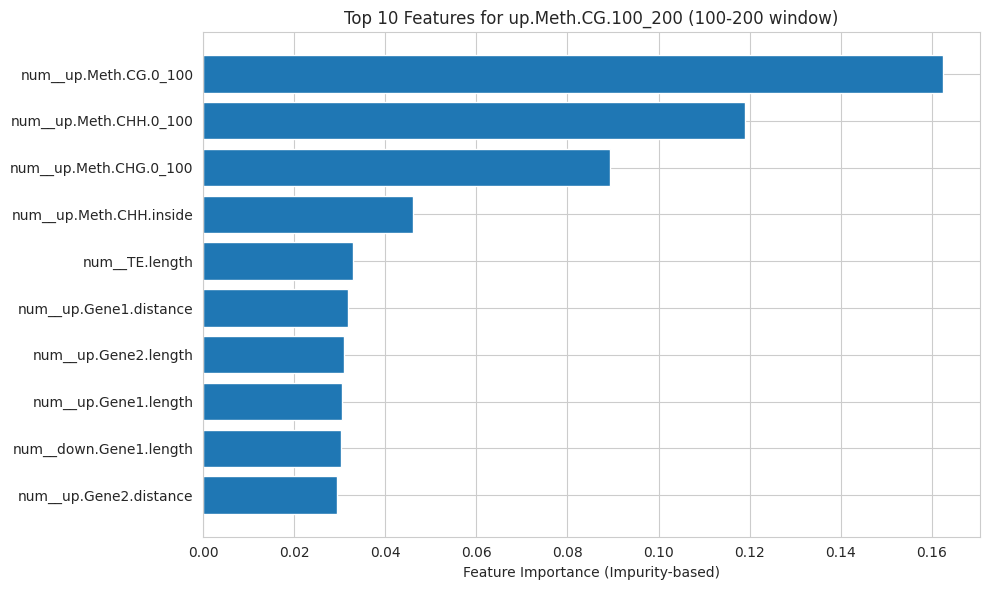


→ Training classifier for target: up.Meth.CHG.100_200 (threshold 0.05)
  Training time: 45.44 s
  Prediction time: 0.42 s
  Accuracy: 0.9209
              precision    recall  f1-score   support

         Low       0.93      0.96      0.95     23455
        High       0.89      0.80      0.84      8365

    accuracy                           0.92     31820
   macro avg       0.91      0.88      0.89     31820
weighted avg       0.92      0.92      0.92     31820



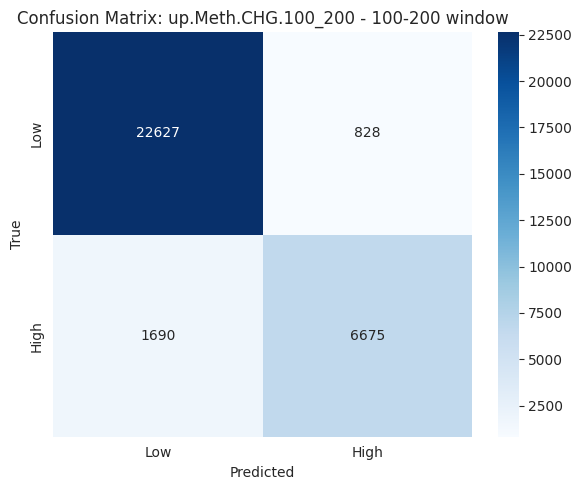

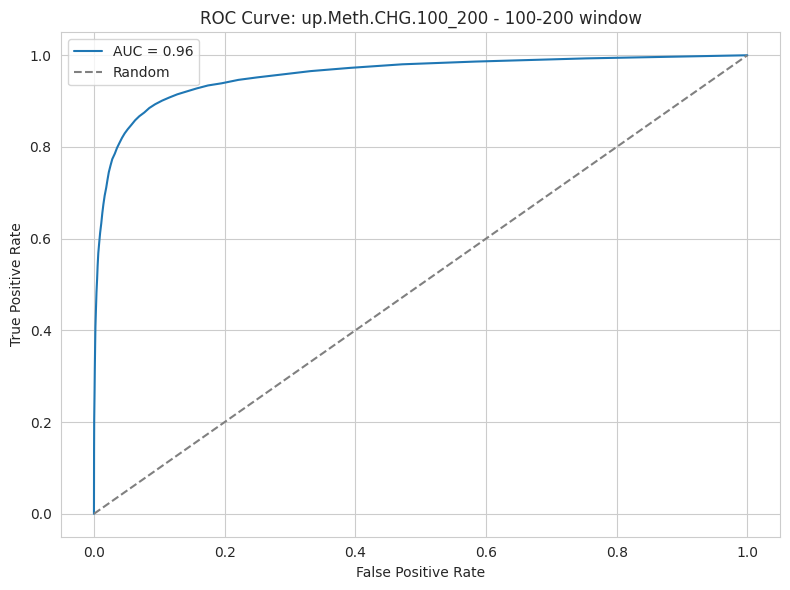

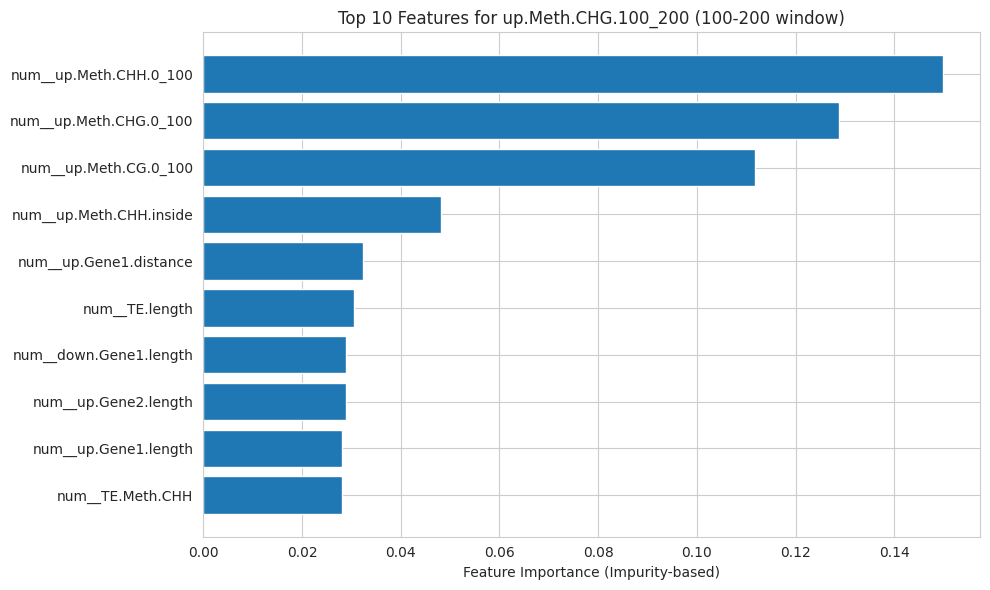


→ Training classifier for target: up.Meth.CHH.100_200 (threshold 0.05)
  Training time: 43.79 s
  Prediction time: 0.33 s
  Accuracy: 0.9404
              precision    recall  f1-score   support

         Low       0.95      0.97      0.96     23455
        High       0.91      0.85      0.88      8365

    accuracy                           0.94     31820
   macro avg       0.93      0.91      0.92     31820
weighted avg       0.94      0.94      0.94     31820



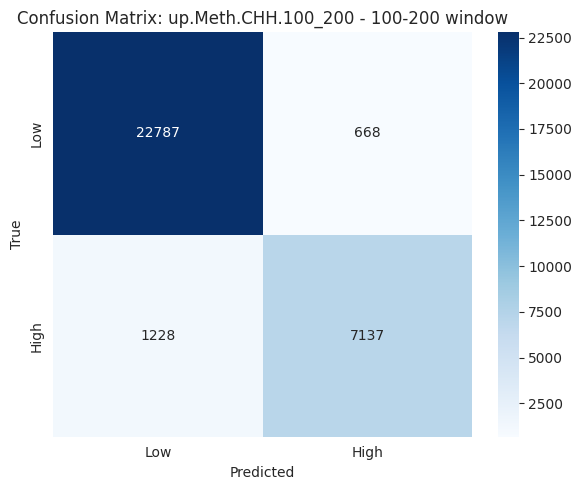

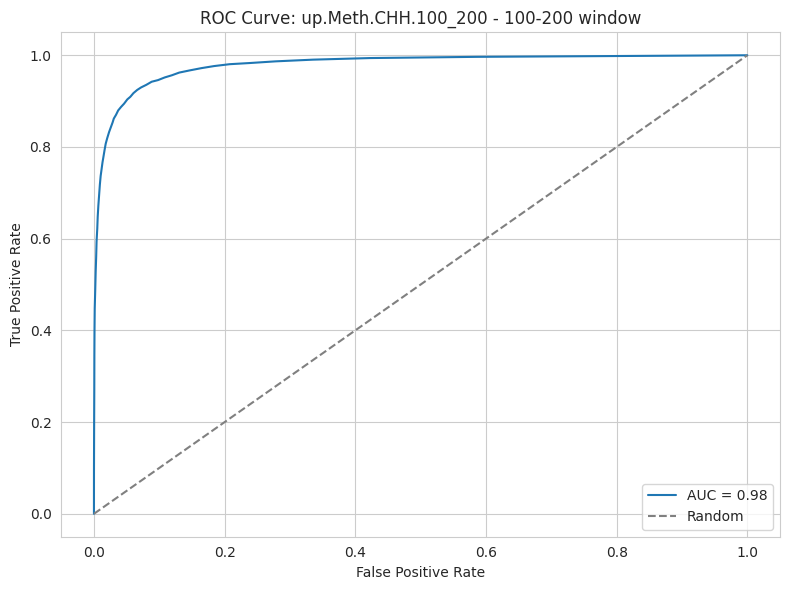

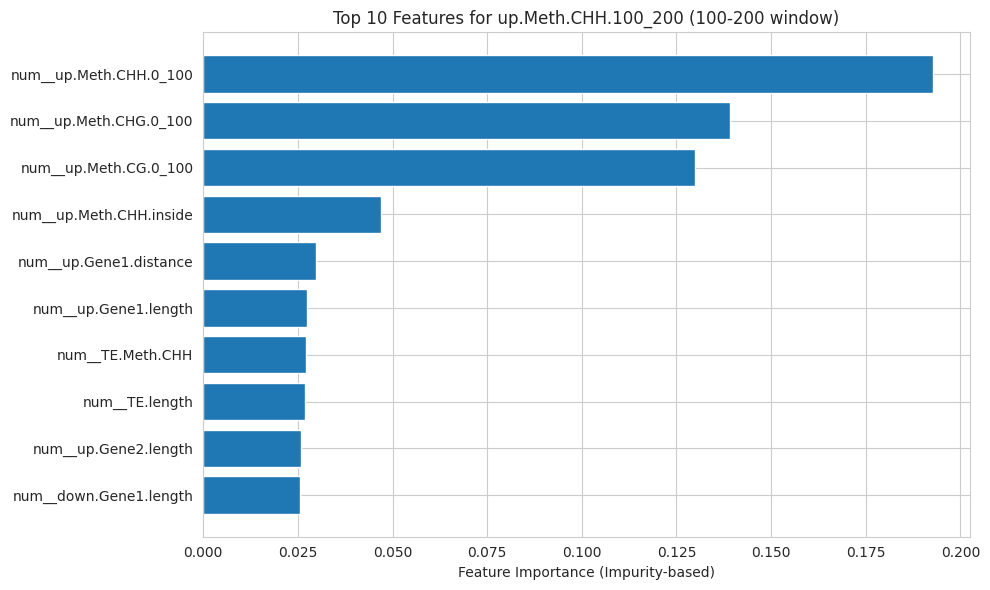


→ Training classifier for target: down.Meth.CG.100_200 (threshold 0.05)
  Training time: 45.41 s
  Prediction time: 0.43 s
  Accuracy: 0.9136
              precision    recall  f1-score   support

         Low       0.91      0.96      0.94     21450
        High       0.91      0.81      0.86     10370

    accuracy                           0.91     31820
   macro avg       0.91      0.89      0.90     31820
weighted avg       0.91      0.91      0.91     31820



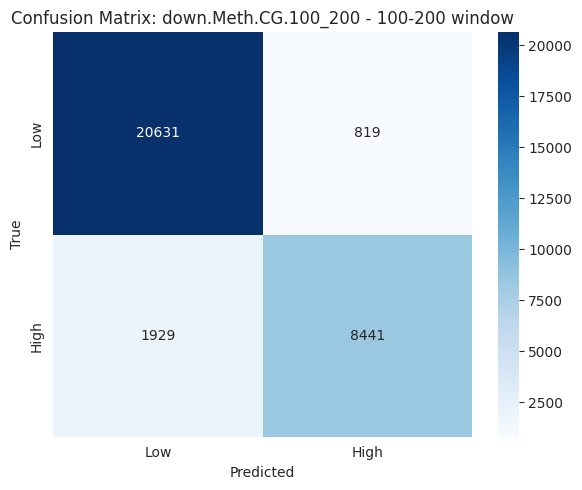

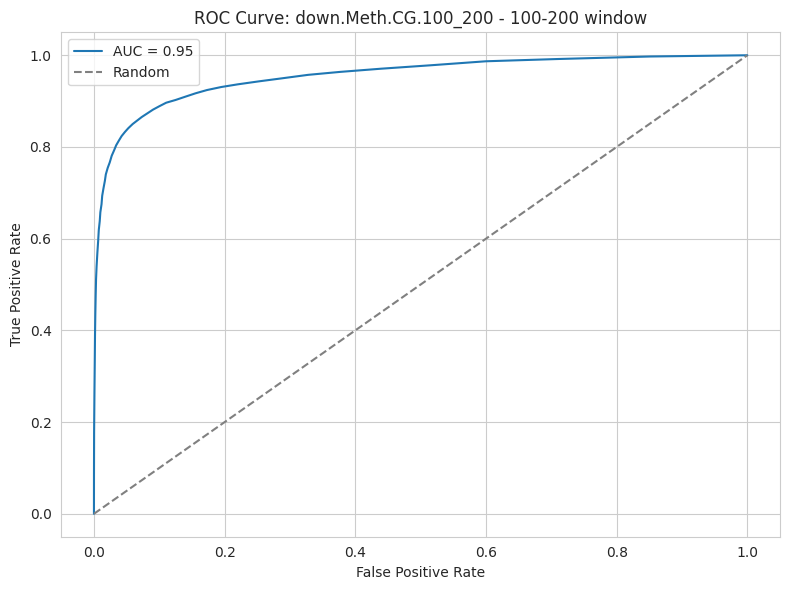

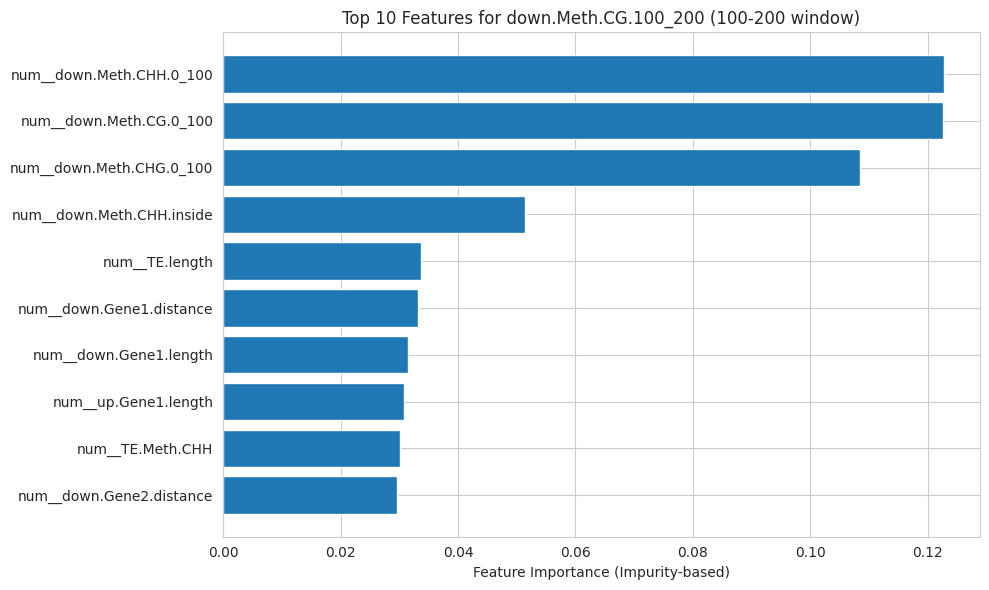


→ Training classifier for target: down.Meth.CHG.100_200 (threshold 0.05)
  Training time: 45.61 s
  Prediction time: 0.53 s
  Accuracy: 0.9183
              precision    recall  f1-score   support

         Low       0.93      0.96      0.94     23080
        High       0.89      0.80      0.84      8740

    accuracy                           0.92     31820
   macro avg       0.91      0.88      0.89     31820
weighted avg       0.92      0.92      0.92     31820



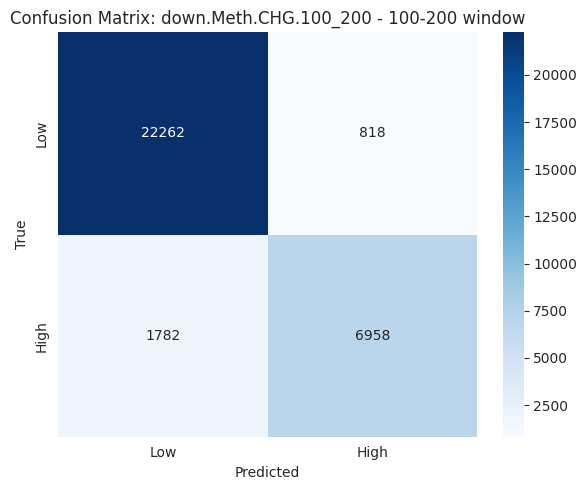

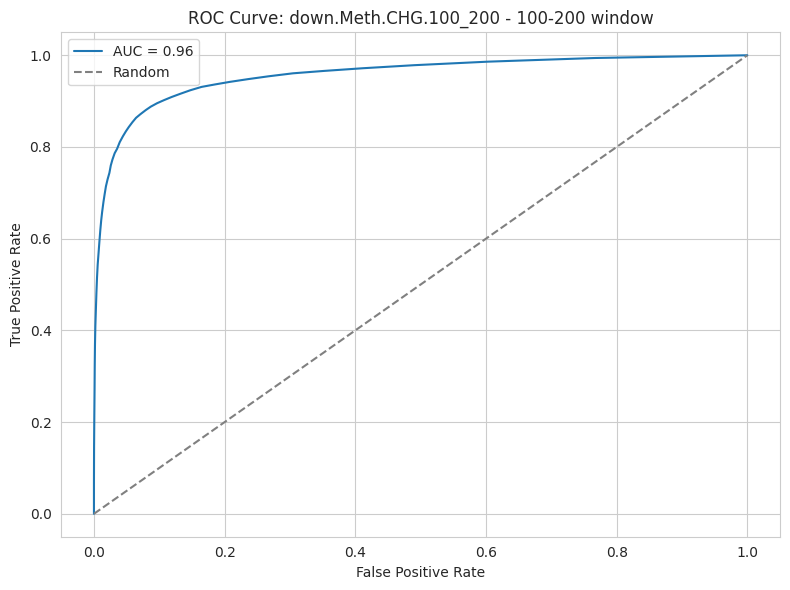

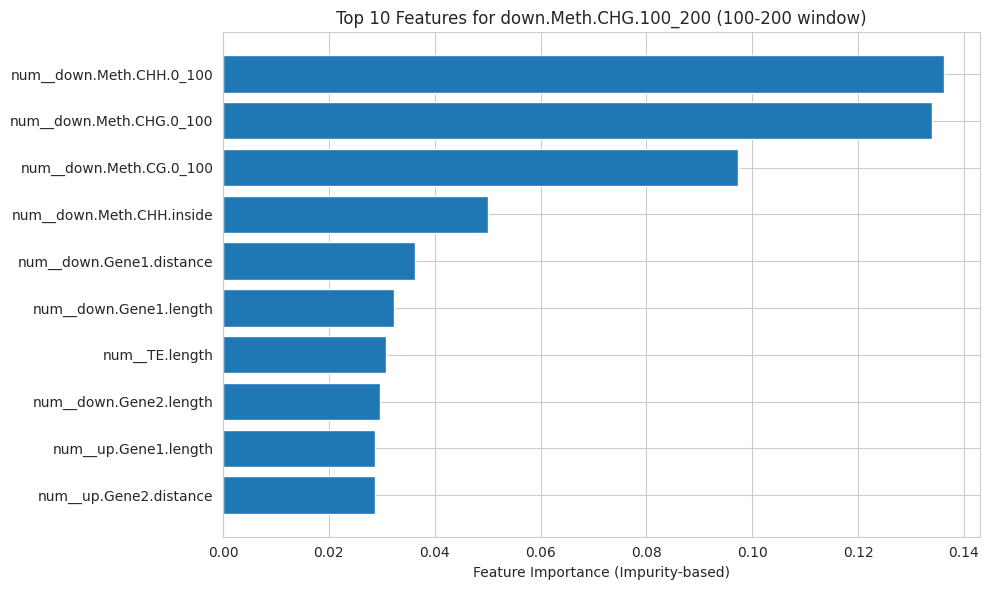


→ Training classifier for target: down.Meth.CHH.100_200 (threshold 0.05)
  Training time: 42.38 s
  Prediction time: 0.34 s
  Accuracy: 0.9400
              precision    recall  f1-score   support

         Low       0.95      0.97      0.96     22859
        High       0.91      0.87      0.89      8961

    accuracy                           0.94     31820
   macro avg       0.93      0.92      0.92     31820
weighted avg       0.94      0.94      0.94     31820



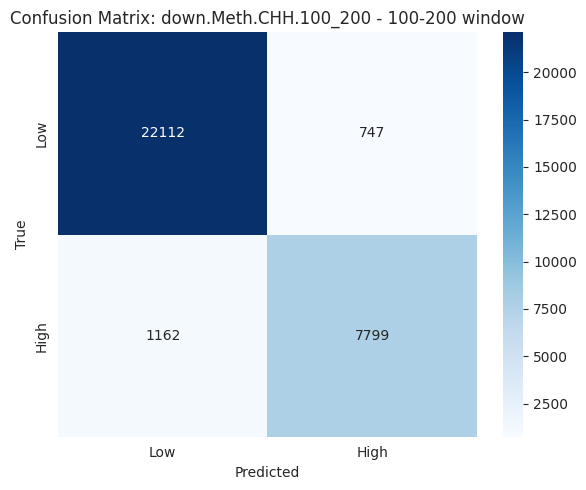

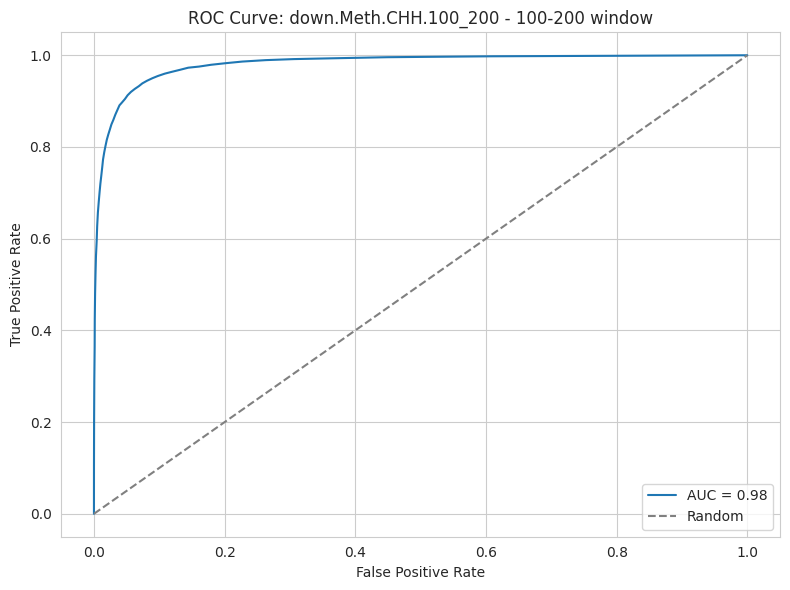

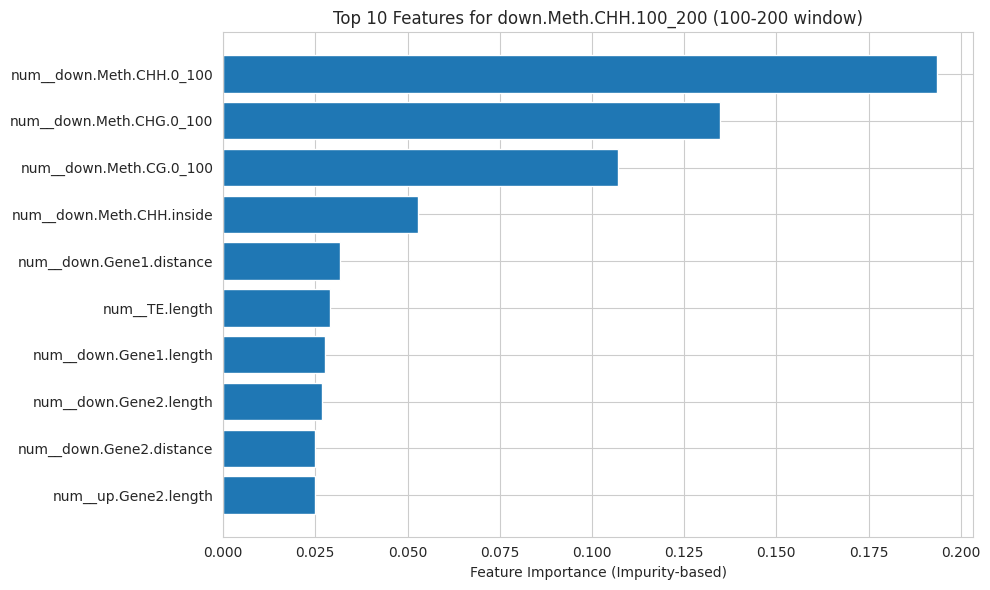


=== Classification for 200-300 window ===

→ Training classifier for target: up.Meth.CG.200_300 (threshold 0.05)
  Training time: 60.12 s
  Prediction time: 0.39 s
  Accuracy: 0.9215
              precision    recall  f1-score   support

         Low       0.93      0.97      0.95     23535
        High       0.90      0.78      0.84      8285

    accuracy                           0.92     31820
   macro avg       0.91      0.88      0.89     31820
weighted avg       0.92      0.92      0.92     31820



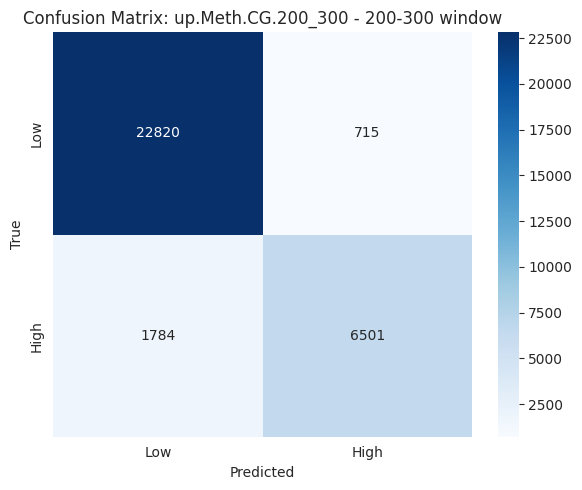

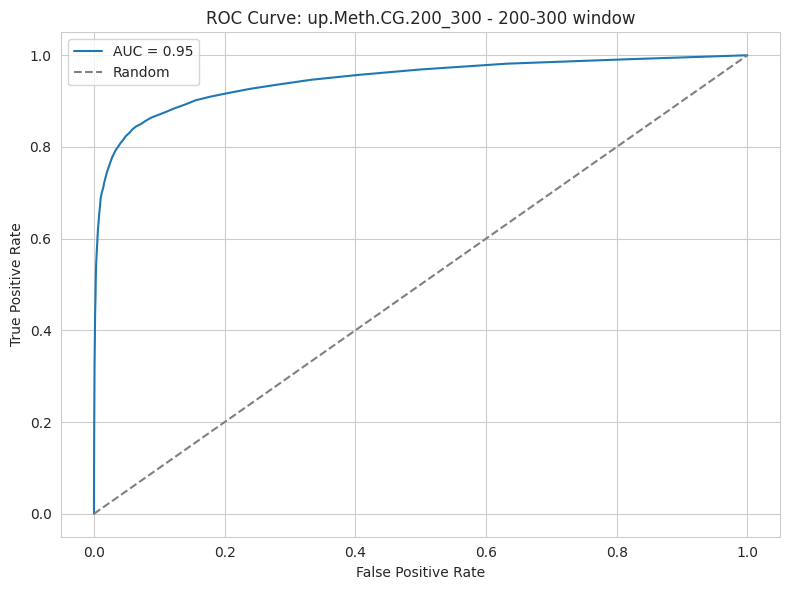

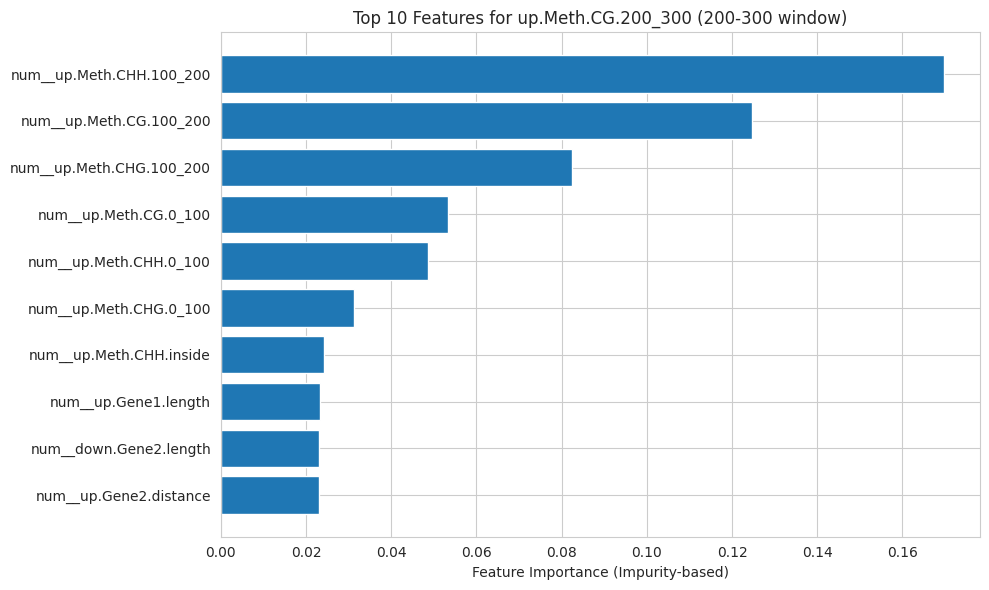


→ Training classifier for target: up.Meth.CHG.200_300 (threshold 0.05)
  Training time: 58.83 s
  Prediction time: 0.36 s
  Accuracy: 0.9329
              precision    recall  f1-score   support

         Low       0.95      0.97      0.96     24828
        High       0.88      0.81      0.84      6992

    accuracy                           0.93     31820
   macro avg       0.91      0.89      0.90     31820
weighted avg       0.93      0.93      0.93     31820



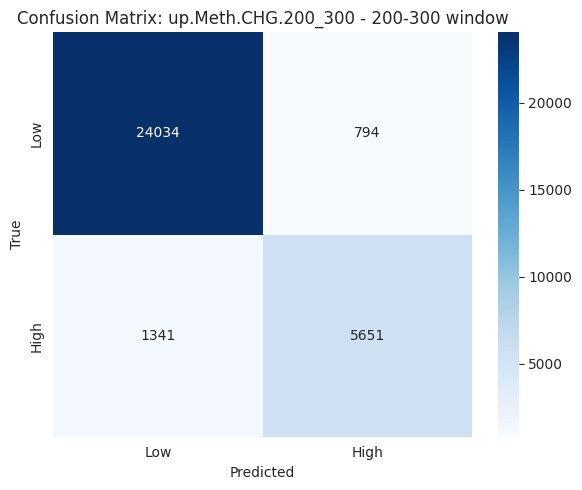

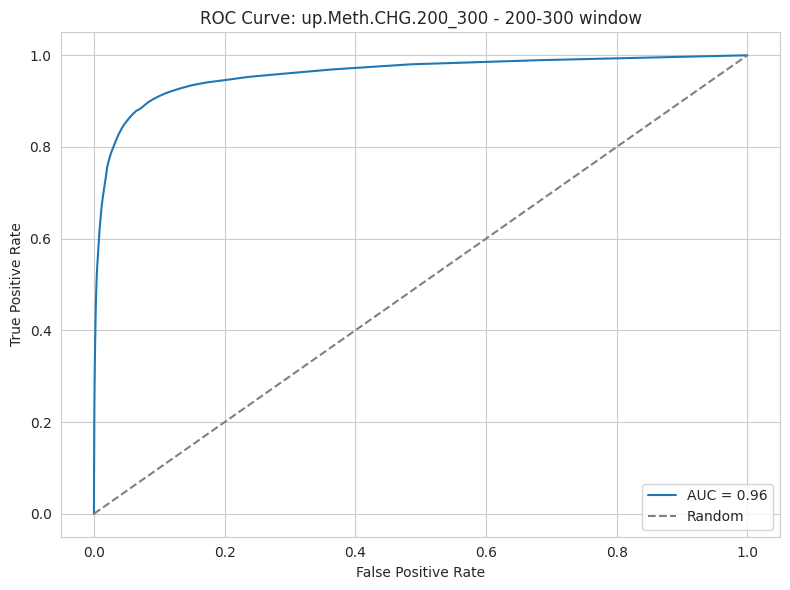

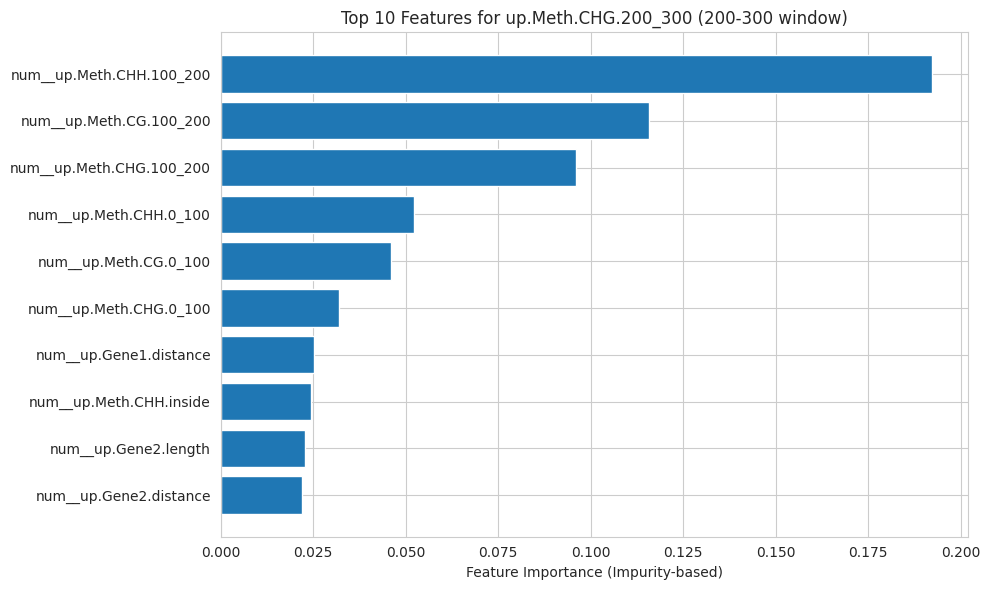


→ Training classifier for target: up.Meth.CHH.200_300 (threshold 0.05)
  Training time: 60.63 s
  Prediction time: 0.30 s
  Accuracy: 0.9556
              precision    recall  f1-score   support

         Low       0.97      0.98      0.97     24745
        High       0.91      0.88      0.90      7075

    accuracy                           0.96     31820
   macro avg       0.94      0.93      0.94     31820
weighted avg       0.96      0.96      0.96     31820



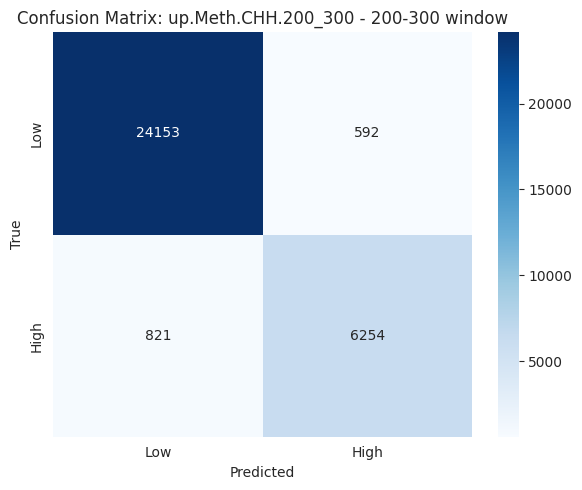

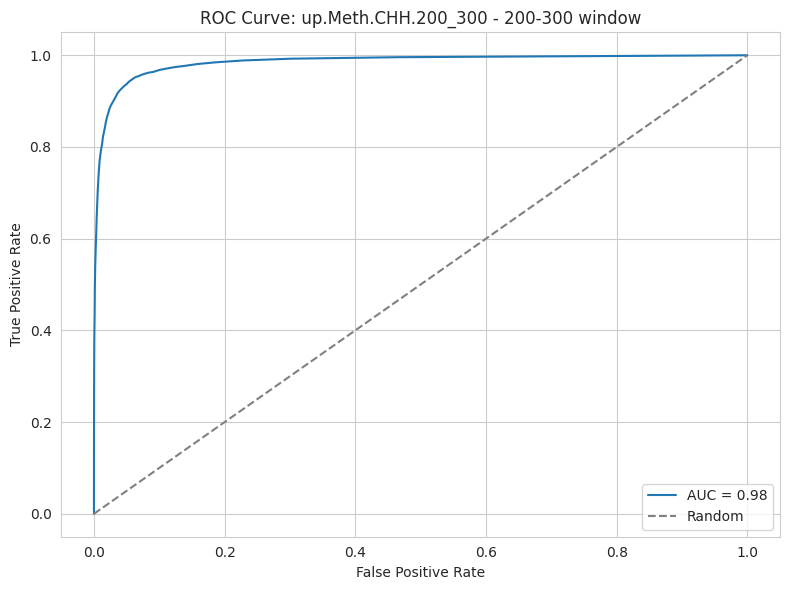

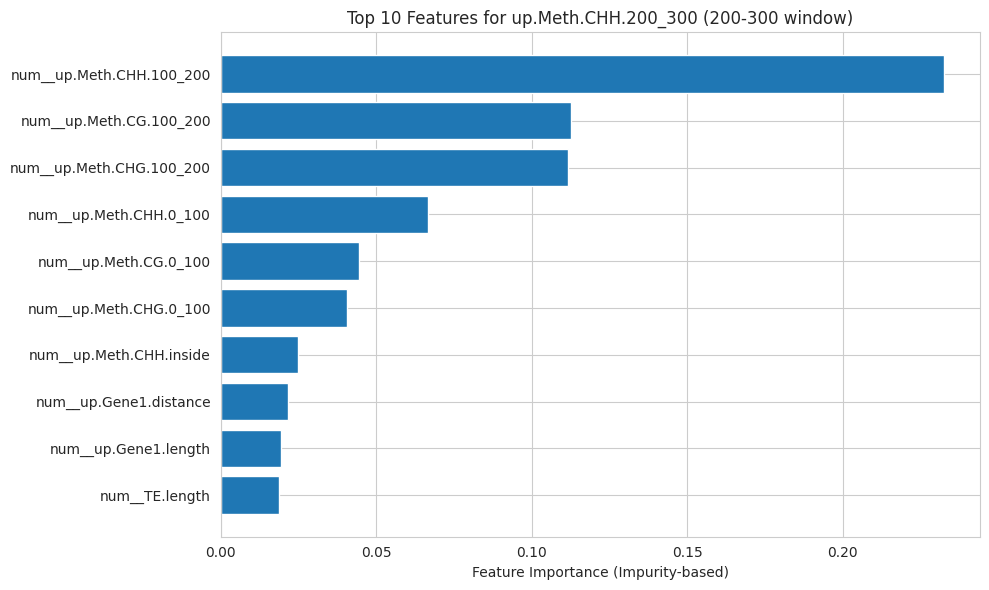


→ Training classifier for target: down.Meth.CG.200_300 (threshold 0.05)
  Training time: 62.50 s
  Prediction time: 0.39 s
  Accuracy: 0.9267
              precision    recall  f1-score   support

         Low       0.93      0.97      0.95     22951
        High       0.92      0.81      0.86      8869

    accuracy                           0.93     31820
   macro avg       0.92      0.89      0.91     31820
weighted avg       0.93      0.93      0.93     31820



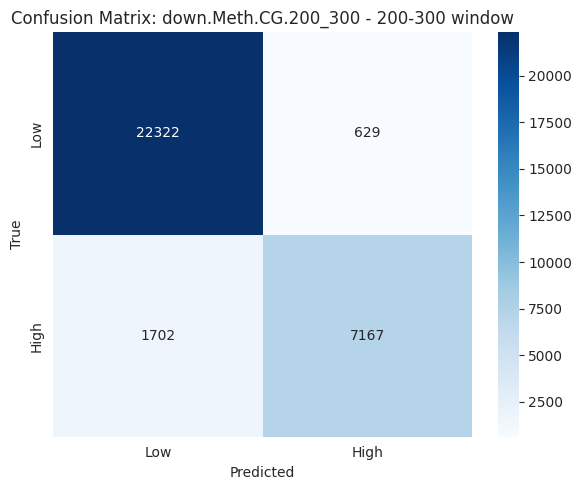

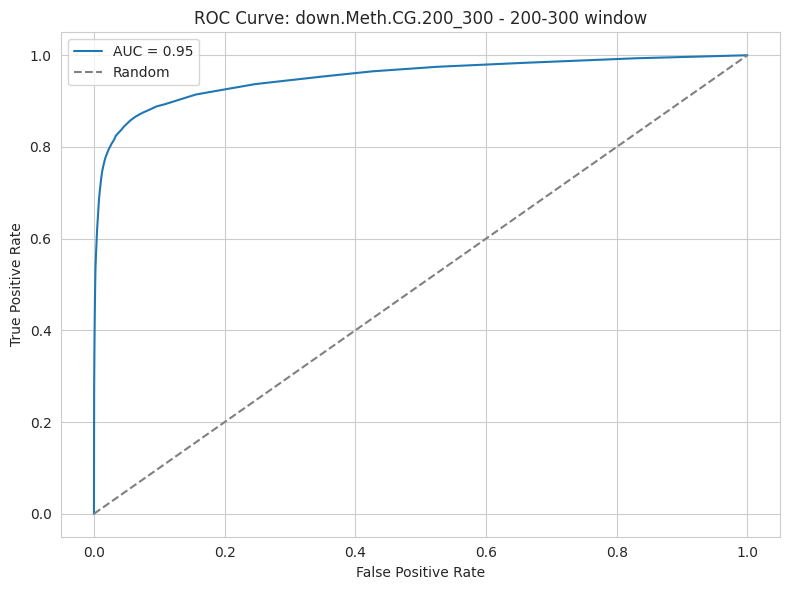

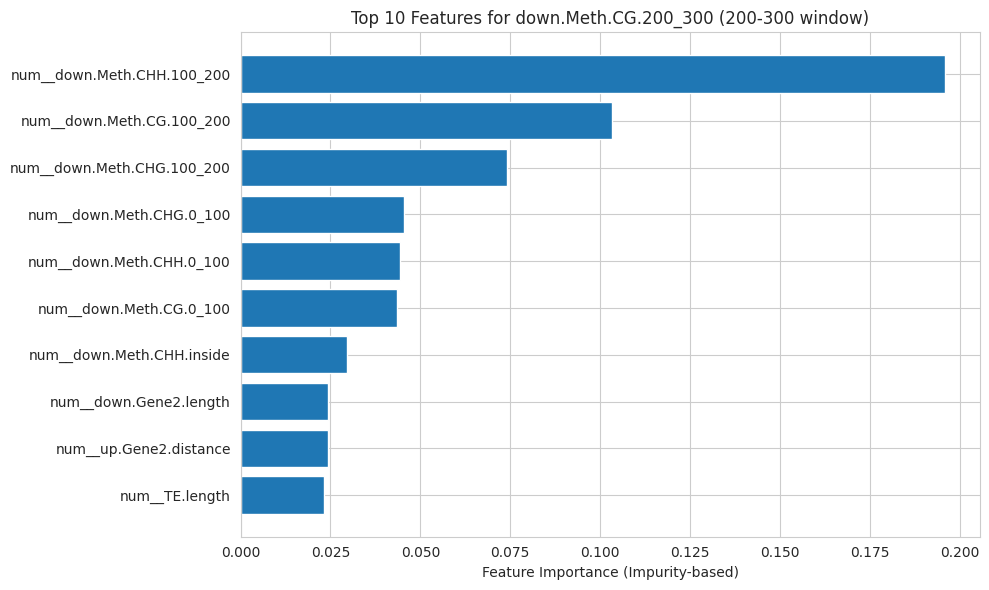


→ Training classifier for target: down.Meth.CHG.200_300 (threshold 0.05)
  Training time: 57.82 s
  Prediction time: 0.38 s
  Accuracy: 0.9317
              precision    recall  f1-score   support

         Low       0.94      0.97      0.96     24406
        High       0.88      0.81      0.85      7414

    accuracy                           0.93     31820
   macro avg       0.91      0.89      0.90     31820
weighted avg       0.93      0.93      0.93     31820



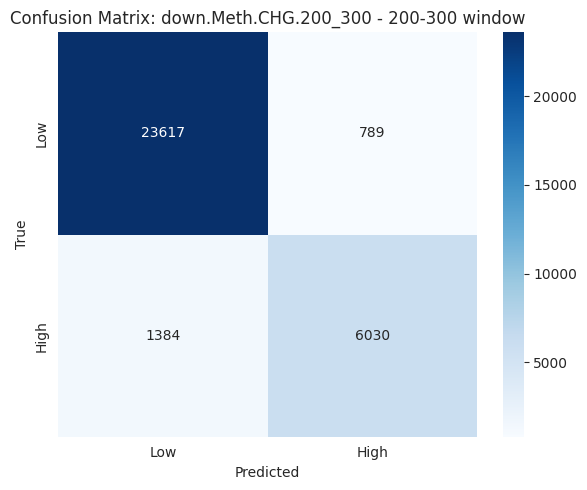

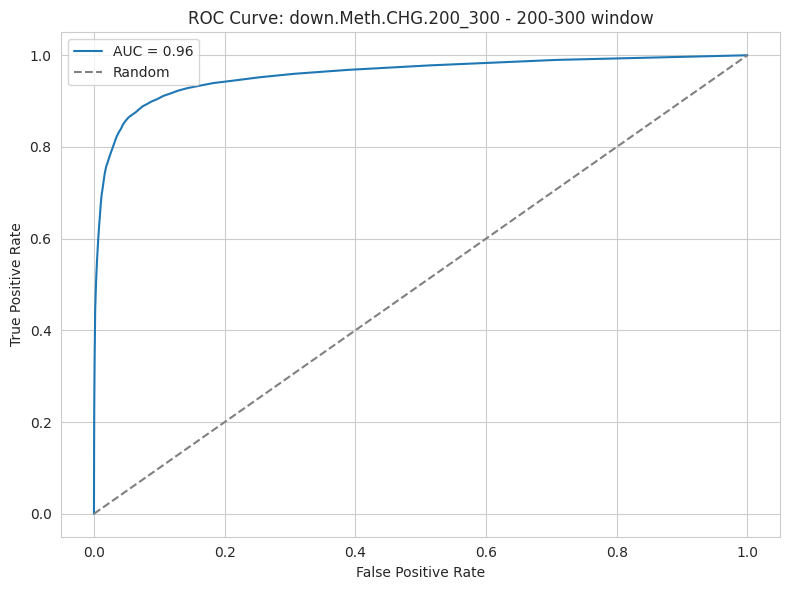

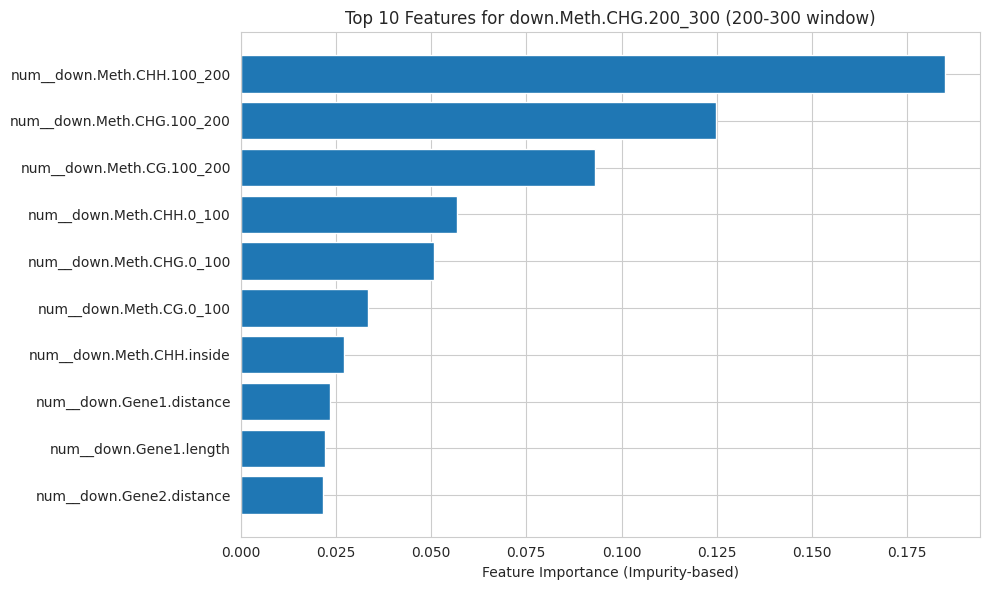


→ Training classifier for target: down.Meth.CHH.200_300 (threshold 0.05)
  Training time: 51.65 s
  Prediction time: 0.38 s
  Accuracy: 0.9521
              precision    recall  f1-score   support

         Low       0.96      0.97      0.97     24239
        High       0.91      0.88      0.90      7581

    accuracy                           0.95     31820
   macro avg       0.94      0.93      0.93     31820
weighted avg       0.95      0.95      0.95     31820



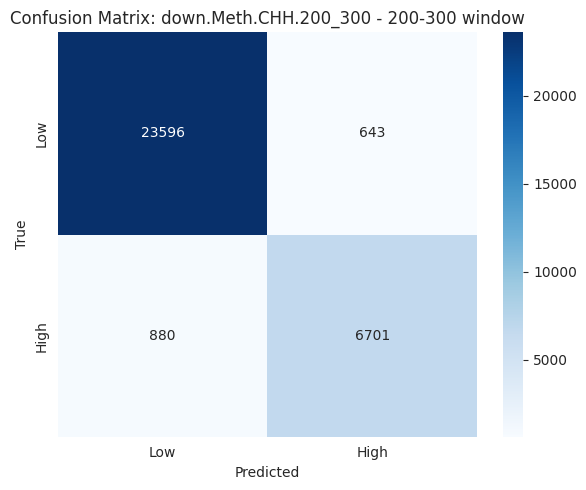

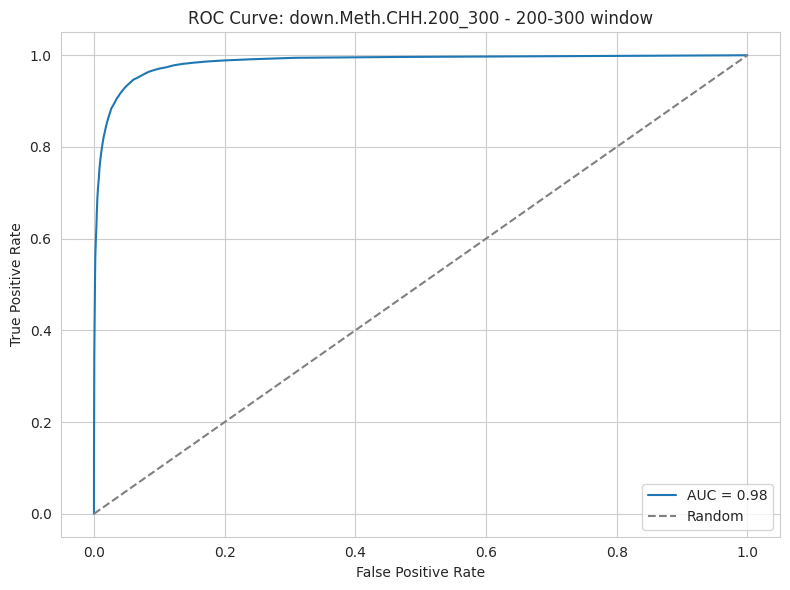

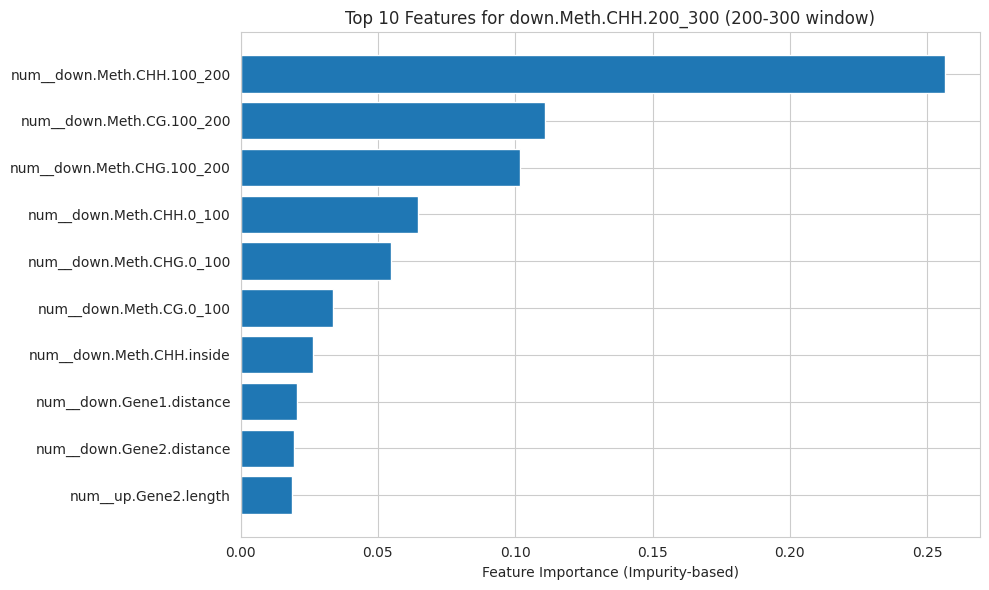


=== Global Classification Summary ===

--- TE window ---

→ TE.Meth.CG:
  Accuracy: 0.9904
    Low:
      precision: 0.8831
      recall: 0.3215
      f1-score: 0.4714
      support: 423.0000
    High:
      precision: 0.9909
      recall: 0.9994
      f1-score: 0.9952
      support: 31397.0000
    accuracy: 0.9904
    macro avg:
      precision: 0.9370
      recall: 0.6605
      f1-score: 0.7333
      support: 31820.0000
    weighted avg:
      precision: 0.9895
      recall: 0.9904
      f1-score: 0.9882
      support: 31820.0000

→ TE.Meth.CHG:
  Accuracy: 0.9440
    Low:
      precision: 0.8403
      recall: 0.7598
      f1-score: 0.7980
      support: 4633.0000
    High:
      precision: 0.9597
      recall: 0.9754
      f1-score: 0.9675
      support: 27187.0000
    accuracy: 0.9440
    macro avg:
      precision: 0.9000
      recall: 0.8676
      f1-score: 0.8827
      support: 31820.0000
    weighted avg:
      precision: 0.9423
      recall: 0.9440
      f1-score: 0.9428
    

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline



# Defining target variable
target_methylation_columns_TE = ['TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH']

target_methylation_columns_0_100 = [
    'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
    'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100'
]

target_methylation_columns_100_200 = [
    'up.Meth.CG.100_200', 'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200',
    'down.Meth.CG.100_200', 'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200'
]

target_methylation_columns_200_300 = [
    'up.Meth.CG.200_300', 'up.Meth.CHG.200_300', 'up.Meth.CHH.200_300',
    'down.Meth.CG.200_300', 'down.Meth.CHG.200_300', 'down.Meth.CHH.200_300'
]

# Defining features for the TE, and the three windows. Took the Meth.inside features for the TE group.
features_per_window = {
    'TE': [
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate',
        'average.CG ', 'average.CHG', 'average.CHH'
    ],
    '0-100': [
        'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate',
        'average.CG ', 'average.CHG', 'average.CHH'
    ],
    '100-200': [
        'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
        'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate',
        'average.CG ', 'average.CHG', 'average.CHH'
    ],
    '200-300': [
        'TE.Meth.CG', 'TE.Meth.CHG', 'TE.Meth.CHH',
        'distance_to_pericentromere',
        'up.Meth.CG.inside', 'up.Meth.CHG.inside', 'up.Meth.CHH.inside',
        'down.Meth.CG.inside', 'down.Meth.CHG.inside', 'down.Meth.CHH.inside',
        'TE.length', 'up.Gene1.length', 'up.Gene2.length', 'down.Gene1.length', 'down.Gene2.length',
        'up.Gene1.distance', 'up.Gene2.distance', 'down.Gene1.distance', 'down.Gene2.distance',
        'up.Meth.CG.0_100', 'up.Meth.CHG.0_100', 'up.Meth.CHH.0_100',
        'down.Meth.CG.0_100', 'down.Meth.CHG.0_100', 'down.Meth.CHH.0_100',
        'up.Meth.CG.100_200', 'up.Meth.CHG.100_200', 'up.Meth.CHH.100_200',
        'down.Meth.CG.100_200', 'down.Meth.CHG.100_200', 'down.Meth.CHH.100_200',
        'Chr', 'TE.strand', 'TE.superfamily', 'TE.insertion_rate',
        'average.CG ', 'average.CHG', 'average.CHH'
    ]
}

windows_and_targets = [
    ('TE', target_methylation_columns_TE),
    ('0-100', target_methylation_columns_0_100),
    ('100-200', target_methylation_columns_100_200),
    ('200-300', target_methylation_columns_200_300)
]

# 5% treshold set for biological considerations
threshold = 0.05
classification_results = {}
feature_importance_summary = []


# Features selection
for window_name, target_cols in windows_and_targets:
    print(f"\n=== Classification for {window_name} window ===")

    X_window = df_cleaned_new[features_per_window[window_name]]
    numeric_cols = X_window.select_dtypes(include=np.number).columns.tolist()
    categorical_cols = X_window.select_dtypes(exclude=np.number).columns.tolist()

    window_results = {}

    for target_col in target_cols:
        print(f"\n→ Training classifier for target: {target_col} (threshold {threshold})")

        # binary labels + Train / Test split (80/20)
        df_cleaned_new[f'{target_col}_label'] = (df_cleaned_new[target_col] > threshold).astype(int)
        y_window = df_cleaned_new[f'{target_col}_label']

        data_train, data_test, target_train, target_test = train_test_split(
            X_window, y_window, test_size=0.2, random_state=42, stratify=y_window
        )

        preprocessor = ColumnTransformer(
            transformers=[
                ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_cols),
                ('num', StandardScaler(), numeric_cols)
            ],
            remainder='passthrough'
        )

        model = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('classifier', RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1))
        ])

        # Training
        start_time = time.time()
        model.fit(data_train, target_train)
        print(f"  Training time: {time.time() - start_time:.2f} s")

        # Predictions
        start_time = time.time()
        predictions = model.predict(data_test)
        print(f"  Prediction time: {time.time() - start_time:.2f} s")

        # Evaluation
        accuracy = accuracy_score(target_test, predictions)
        print(f"  Accuracy: {accuracy:.4f}")
        clf_report = classification_report(target_test, predictions, target_names=['Low', 'High'], output_dict=True)
        print(classification_report(target_test, predictions, target_names=['Low', 'High']))

        window_results[target_col] = {
            'Accuracy': accuracy,
            'Classification Report': clf_report,
            'Model': model
        }

        # Matrice de confusion
        conf_matrix = confusion_matrix(target_test, predictions)
        plt.figure(figsize=(6, 5))
        sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d",
                    xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
        plt.title(f"Confusion Matrix: {target_col} - {window_name} window")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.show()

        # ROC & AUC
        if hasattr(model.named_steps['classifier'], 'predict_proba'):
            y_prob = model.predict_proba(data_test)[:, 1]
            fpr, tpr, thresholds = roc_curve(target_test, y_prob)
            auc = roc_auc_score(target_test, y_prob)

            plt.figure(figsize=(8, 6))
            plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve: {target_col} - {window_name} window')
            plt.legend()
            plt.tight_layout()
            plt.show()

        # Feature importance : impurity based method
        final_model = model.named_steps['classifier']
        feature_names = model.named_steps['preprocessor'].get_feature_names_out()

        if hasattr(final_model, "feature_importances_"):
            importances = final_model.feature_importances_
            indices = np.argsort(importances)

            num_features_to_plot = min(10, len(importances))
            top_indices = indices[-num_features_to_plot:]

            plt.figure(figsize=(10, 6))
            plt.barh(range(len(top_indices)), importances[top_indices], align="center")
            plt.yticks(range(len(top_indices)), [feature_names[i] for i in top_indices])
            plt.xlabel("Feature Importance (Impurity-based)")
            plt.title(f"Top {num_features_to_plot} Features for {target_col} ({window_name} window)")
            plt.tight_layout()
            plt.show()

            for feat, val in zip(feature_names, importances):
                feature_importance_summary.append({
                    'Window': window_name,
                    'Target': target_col,
                    'Feature': feat,
                    'Importance': val
                })

    classification_results[window_name] = window_results

# Summary
print("\n=== Global Classification Summary ===")
for window_name, results in classification_results.items():
    print(f"\n--- {window_name} window ---")
    for target, metrics in results.items():
        print(f"\n→ {target}:")
        print(f"  Accuracy: {metrics['Accuracy']:.4f}")
        for label, scores in metrics['Classification Report'].items():
            if isinstance(scores, dict):
                print(f"    {label}:")
                for metric, value in scores.items():
                    print(f"      {metric}: {value:.4f}")
            else:
                print(f"    {label}: {scores:.4f}")

# Feature importances
feature_importance_df = pd.DataFrame(feature_importance_summary)

print("\n=== Global Feature Importance Summary (top 20) ===")
print(feature_importance_df.sort_values(by="Importance", ascending=False).head(20))
